# Intro 

In this notebook, I analyze the impact of bike lanes on traffict accidents.

Note that: A traffic Accident is defind as: "traffic collision, hit & run, injury", "traffic accident", "TRAFFIC COLLISION, HIT & RUN, PROPERTY DAMAGE"
The dataset I'm given tells us the date of a traffic accident, as well as the year of the bike lane (unfortunately it doesn't tel lus whether a bike lane was installed or about to begin construction at the date of the bike lane).

Note that in previous studies performed by san francisco, they did not come to conclusions because:  "The number of annual fatalities is subject to year-to-year fluctuations and a high degree of random variation, limiting the ability to draw statistically meaningful trends on an annual basis." 
## Organization
1. Regressions. This technically was the second thing I did when analyzing the data, but I throw it at the bottom since I chose not go through with it. The sample size and variability seemed low
2. Visualizations. I cut the data in various ways. I essentially summarize all this in " Map Accidents to bike lanes using lane breach's API"


In [28]:
%%javascript

/* disables scrolling in graphs */

IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

## Summary of learnings as of 7/14/19

I first attempted to do a diff-in-diff on this dataset. Only 19 bike lanes have accidents before and after implementation. On one hand this may be a sign of bike lanes doing a good job. On the other, it just seems like a really small sample size. Since my goal is to focus my analysis on SF, and not pool in data from other cities, I feel like we have to use other methods to really understand this question.


### Visualizations of bike lanes on accident outcomes
I cut the data by some combinations of 
- whether or not the accidents occured on or not on a bike lane
- time of day (by hour, though for future analysis it may make more sense to group by groups of hours
- day of week (weekday vs weekend and also each day of week)
- police district (has differences with standard neighborhood definitions used by most residents such as soma, mission bay, japantown, marina, hayes) 

If you focus on the chart of accidents by bikelane by Weekday vs Weekend by Neighborhood, at 7AM. Counts are pretty low in general. Part of the differences between each group are due to differences on where people are going at that time. Maybe a lot of people who live in the tenderloin walk to work? More people in richmond and mission probably bike to work, which is why we see a difference in bike lane accidents vs not bike lane accidents at that time

But other parts of the difference will be probably that there are just fewer bike lanes vs normal streets in tenderloin vs richmond?

In [31]:
import pandas as pd
import numpy as np
import sqlite3
from plotnine import ggplot, aes, geom_bar, coord_flip, facet_wrap, labs
import geopandas as gpd

ModuleNotFoundError: No module named 'geopandas'

In [13]:
traffic_reports_and_bikelanes3 = pd.read_csv( 'BikewayNetwork_edit/accidents_bikelanes_roads_wlengths.csv')

In [5]:
daysofweek_array = np.array(set(traffic_reports_and_bikelanes3.DayOfWeek )).tolist()
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes3.groupby(['cnn_of_road' ,'globalid','hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday', 'road_length', 'bikelane_length_haver'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [6]:
accidentsby_ifhour_bikelane.traffic_accidents.value_counts()

1    842
2     11
3      3
4      2
Name: traffic_accidents, dtype: int64

In [7]:
accidentsby_ifhour_bikelane2 = accidentsby_ifhour_bikelane.groupby(['hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday'], as_index = False)['traffic_accidents', 'road_length', 'bikelane_length_haver'].sum().sort_values( by = ['bikelane_exist', 'hour', 'DayOfWeek'])

C:\Users\Divya\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.


In [8]:
def calc_standard( row ):
    if row['bikelane_exist'] == "No":
        return (row['traffic_accidents']/row['road_length'] )
    else:
        return (row['traffic_accidents'] /row['bikelane_length_haver'])


In [9]:
accidentsby_ifhour_bikelane2['standardized_metric'] = accidentsby_ifhour_bikelane2.apply( lambda x: calc_standard(x) , axis = 1)

In [26]:
accidents_hour_bikelane_day_graphs_std =[]

for i in set(accidentsby_ifhour_bikelane2.isWeekday):
    accidents_hour_bikelane_day2 = accidentsby_ifhour_bikelane2.loc[traffic_reports_and_bikelanes3.isWeekday == i, ['bikelane_exist', 'hour', 'standardized_metric']]
    accidents_hour_bikelane_day_graphs_std.append((ggplot(accidents_hour_bikelane_day2, aes(x='bikelane_exist', y = 'standardized_metric'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, time of day on ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)

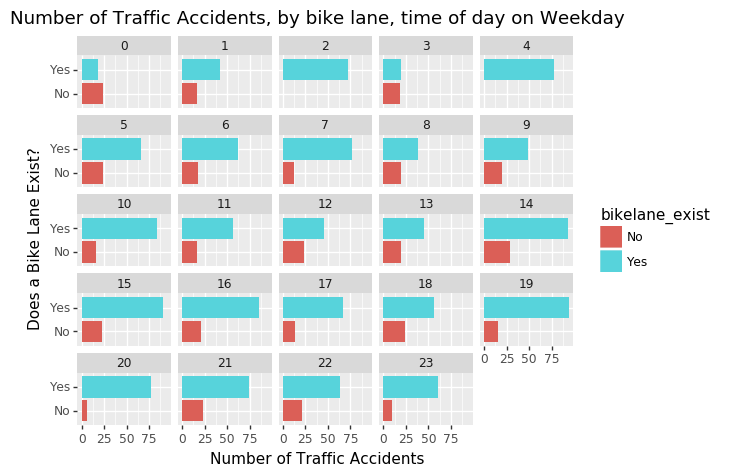

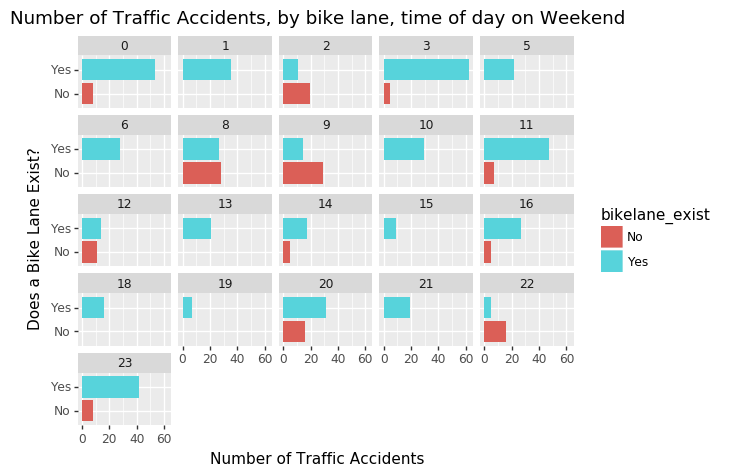

[<ggplot: (-9223371898907862036)>, <ggplot: (-9223371898907871328)>]

In [29]:
accidents_hour_bikelane_day_graphs_std

## Bike lanes vs Roads vs Accidents Map

Lanebreach at Code4SF is working on something more detailed than dynamic than this. However in the mean time, this was pretty interesting to learn to use matplotlib

In [23]:
traffic_reports_and_bikelanes3['point'] = [Point(xy) for xy in zip(traffic_reports_and_bikelanes3.X, traffic_reports_and_bikelanes3.Y)]

In [30]:
traffic_reports_map = gpd.GeoDataFrame( \
    traffic_reports_and_bikelanes3[ ['X', 'Y', 'Category', 'Descript', 'DayOfWeek', 'accident_year', 'bikelane_exist'] ],  \
    geometry =  traffic_reports_and_bikelanes3.point, crs = bikeway_map3.crs)

NameError: name 'gpd' is not defined

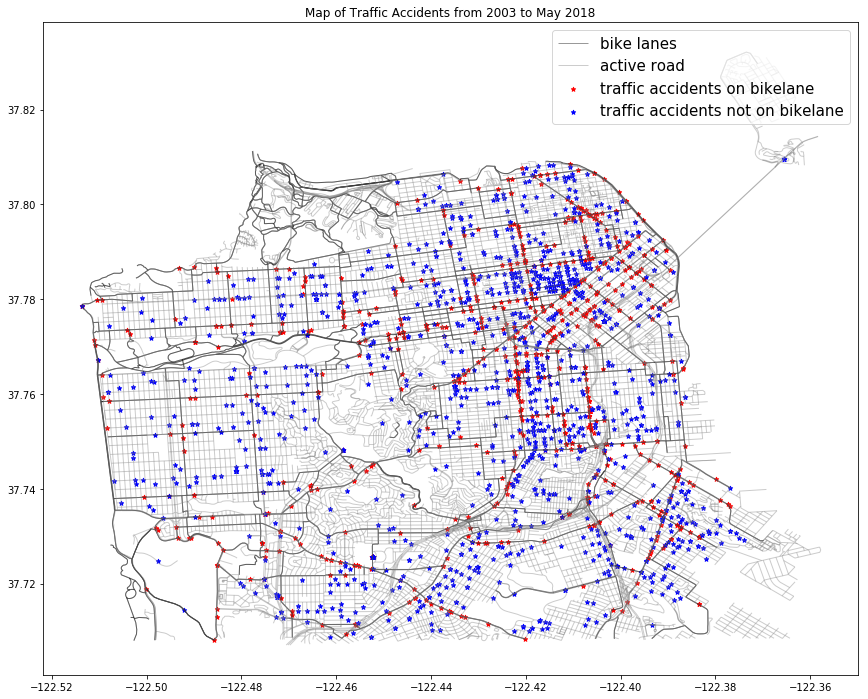

In [114]:
fig, ax=plt.subplots(figsize=(16,12))
#plt.xticks(traffic_reports_by_year['accident_year'], fontsize=10, rotation=30, ha='center', va='top')

bikeway_map3.geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4, label = 'bike lanes') #
total_map.geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'grey', alpha = 0.4, label = 'active road') #

#bikeway_map3.loc[bikeway_map3.symbology == 'BIKE LANE', ].geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4) #
#bikeway_map3.loc[bikeway_map3.symbology == 'BIKE PATH', ].geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4) #
traffic_reports_map.loc[traffic_reports_map['bikelane_exist'] == True, ].plot( ax = ax,marker = '*',markersize = 20, color = 'red', label = "traffic accidents on bikelane")
traffic_reports_map.loc[traffic_reports_map['bikelane_exist'] == False, ].plot( ax = ax,marker = '*',markersize = 20, color = 'blue', label = "traffic accidents not on bikelane")

plt.legend(prop={'size':15})
plt.title('Map of Traffic Accidents from 2003 to May 2018')
plt.show()

Let create a chart of number of traffic accidents per year, on or not on a bike lane

In [32]:
traffic_reports_by_year2 = traffic_reports_and_bikelanes3.groupby(['accident_year', 'bikelane_exist'], as_index = False)['Category'].count()
#drop 2018 point
#traffic_reports_by_year = traffic_reports_by_year.drop([(traffic_reports_by_year.shape[0]-1)], axis = 0)
traffic_reports_by_year2.rename(columns={'Category': 'accident_counts'}, inplace=True)
traffic_reports_by_year2 = traffic_reports_by_year2.reset_index( drop = True) #traffic_reports_and_bikelanes

# drop 2018 since traffic accident dataset only goes til May 2018
traffic_reports_by_year2.drop( traffic_reports_by_year2.loc[ traffic_reports_by_year2.accident_year == 2018 ].index , inplace = True)

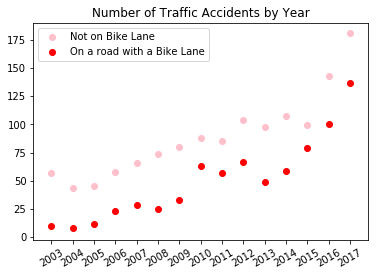

In [33]:
plt.scatter(traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == False), 'accident_year'], traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == False),'accident_counts'], label ='Not on Bike Lane', color = 'pink' )
plt.scatter(traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == True), 'accident_year'], traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == True),'accident_counts'], label ='On a road with a Bike Lane', color = 'red')
plt.title( ("Number of Traffic Accidents by Year"))
plt.legend()
plt.xticks(np.unique(traffic_reports_by_year2['accident_year']), fontsize=10, rotation=30, ha='center', va='top')
    #fig.set_size_inches(18.5, 10.5, forward=True)a
    #plt.xticks(ticks=np.arange(0, 440/57.2985, 90/57.2985), fontsize=12, rotation=30, ha='center', va='top')  # 1 radian = 57.2985 degrees
plt.show()

Trend of more accidents without a bike lane than with a bike lane, per year

## Let's see if there looks like there is a trend between number of accidents and bike lane type

In [557]:
traffic_reports_and_bikelanes3['Time'] = pd.to_datetime(traffic_reports_and_bikelanes3['Time'])
traffic_reports_and_bikelanes3['hour'] = traffic_reports_and_bikelanes3['Time'].apply(lambda x: x.hour)

In [150]:
# figure out how much each bike lane type covers sf in miles
symbology_lengths = pd.merge( bikeway_map3.groupby('symbology')['length'].sum().reset_index(), traffic_reports_and_bikelanes.symbology.value_counts().reset_index(), how = 'left', right_on = "index", left_on = "symbology", sort = False)
symbology_lengths.drop( 'index', axis = 1, inplace = True)
symbology_lengths.columns =  ['symbology', 'length_mi', 'accident_counts']
symbology_lengths['length_percent'] = symbology_lengths.length_mi / np.sum(symbology_lengths.length_mi)

# text formatting for chart - very imp to point this out!
symbology_lengths['length_percent_str'] = (np.round(symbology_lengths['length_percent']*100).astype(str)  + "%").tolist()
symbology_lengths['x_index'] = symbology_lengths.symbology + " (" + symbology_lengths.length_percent_str + ")"

C:\Anaconda3\lib\site-packages\plotnine\layer.py:430: UserWarning: position_stack : Removed 1 rows containing missing values.
  data = self.position.setup_data(self.data, params)


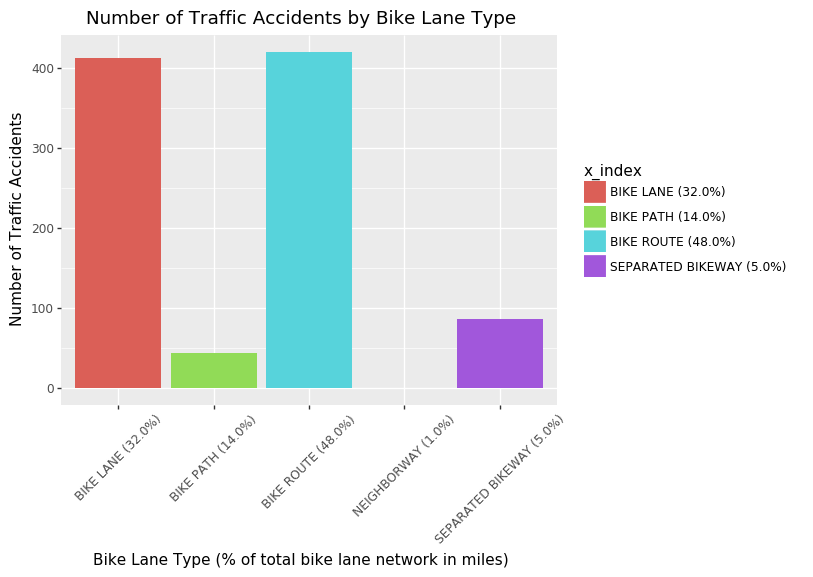

<ggplot: (-9223371905425364939)>

In [36]:
(ggplot(symbology_lengths, aes(x ='x_index', y='accident_counts', fill = 'x_index'))
 + geom_bar( stat='identity') + theme(axis_text_x = element_text(angle=45) )
    + labs(title=('Number of Traffic Accidents by Bike Lane Type'), x='Bike Lane Type (% of total bike lane network in miles)', y='Number of Traffic Accidents'))

This isn't a regression, with controls, but it looks like there are a lot more accidents on a bike lane and bike path, because there are more of this type of lane

## Accidents by Hour, district, weekday vs weekend

Now, let's look at number of accidents by hour of the day

In [564]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'PdDistrict', 'Day', ''], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

.6% of roads are bikeways 

In [565]:
accidentsby_byhour = accidentsby_ifhour_bikelane.groupby('hour').sum()['traffic_accidents'].reset_index()

In [566]:
num_traffic_accidents_hour = (ggplot(accidentsby_byhour, aes(x = 'hour', y = 'traffic_accidents')) + geom_bar(stat= 'identity')
 + labs(title=('Number of Traffic Accidents by Time of Day'), x='Time (24:00 format)', y='Number of Traffic Accidents'))

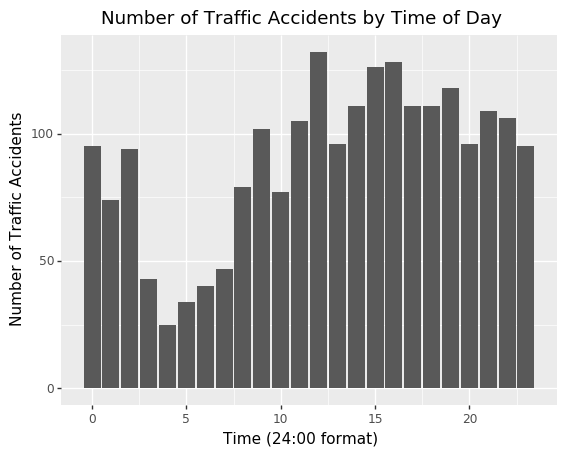

<ggplot: (-9223371904483382826)>

In [567]:
num_traffic_accidents_hour

## Accidents by Hour

Now, let's look at number of accidents by hour of the day

In [564]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

.6% of roads are bikeways 

In [565]:
accidentsby_byhour = accidentsby_ifhour_bikelane.groupby('hour').sum()['traffic_accidents'].reset_index()

In [566]:
num_traffic_accidents_hour = (ggplot(accidentsby_byhour, aes(x = 'hour', y = 'traffic_accidents')) + geom_bar(stat= 'identity')
 + labs(title=('Number of Traffic Accidents by Time of Day'), x='Time (24:00 format)', y='Number of Traffic Accidents'))

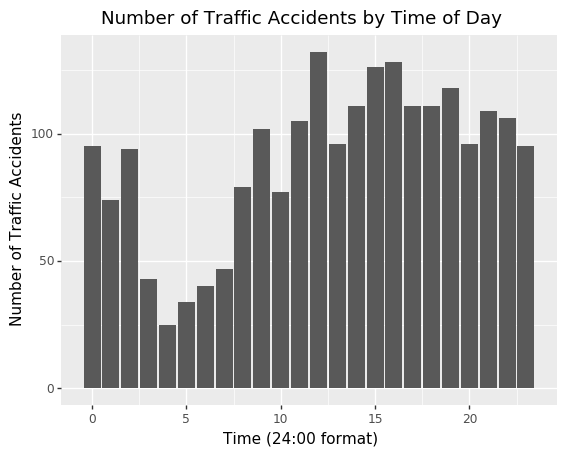

<ggplot: (-9223371904483382826)>

In [567]:
num_traffic_accidents_hour

ways graphic can be improved
- write number of accidents
- show entire bottom scale
- We're not 'controlling' for location, bike lane type, day of week, yaer

## Accidents by time of day, on and not on a bike lane

Let's attempt to control for traffic accidents per day of week

In [558]:
accidents_ifbikelane_hour = (ggplot(accidentsby_ifhour_bikelane, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
 + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
 + coord_flip()
 + facet_wrap('hour')
 + labs(title='Number of Traffic Accidents for Road with/w/o Bike Lane, Hour in Day', x='Does a Bike Lane Exist?', y='Number of Traffic Accidents')
)

# of course I'd like to convert the hour to AM/PM format

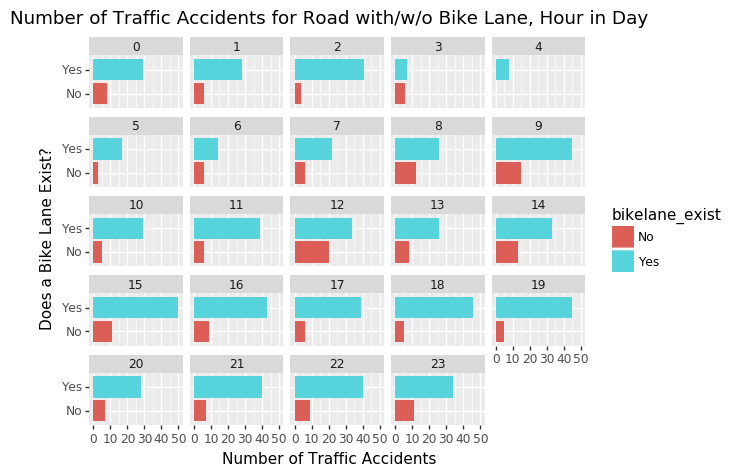

<ggplot: (-9223371904483376419)>

In [559]:
accidents_ifbikelane_hour

We see that there is a lot of difference in accidents when we include hour. If there were actually more counts of accidents per each hour in this dataset, I would definitely put a control for hour in the ultimate regression

It would be interesting to visualize this by day of week if there are differences?

In [561]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [562]:
daysofweek_array = np.array(set(traffic_reports_and_bikelanes.DayOfWeek )).tolist()

## Accidents by time of day, week day vs weekend vs whether or not bike lane exists 

Accidents conditional on varying time of day, weekday vs weekend, and whether or not bike lane exists

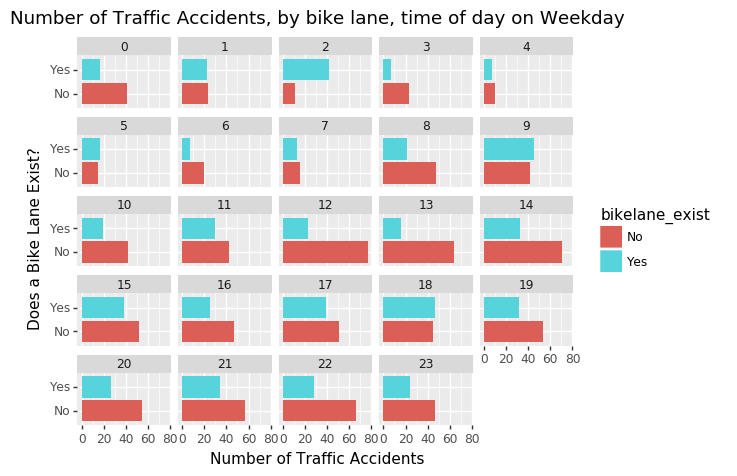

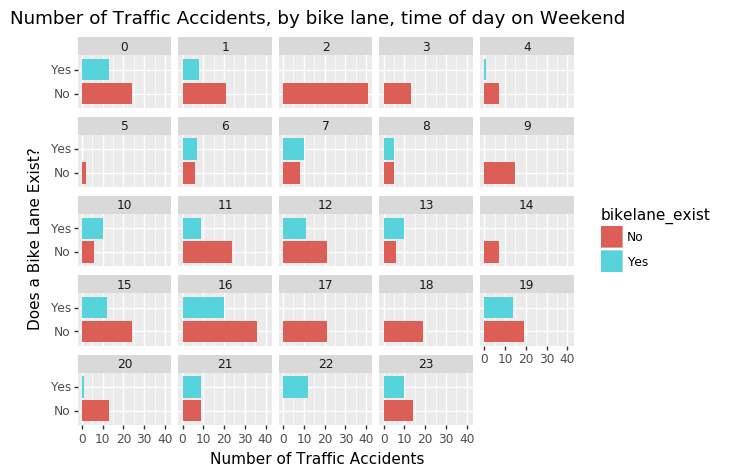

[<ggplot: (132372877523)>, <ggplot: (132371998847)>]

In [563]:
accidents_hour_bikelane_day_graphs = []

for i in set(accidentsby_ifhour_bikelane.isWeekday):
    accidents_hour_bikelane_day = accidentsby_ifhour_bikelane.loc[traffic_reports_and_bikelanes.isWeekday == i]
    accidents_hour_bikelane_day_graphs.append((ggplot(accidents_hour_bikelane_day, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, time of day on ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)
    
accidents_hour_bikelane_day_graphs

## Accidents conditional on varying time of day, day of week, and whether or not bike lane exists

In [249]:
for i in daysofweek_array:
    accidents_hour_bikelane_day = accidentsby_ifhour_bikelane.loc[traffic_reports_and_bikelanes.DayOfWeek == i]
    print((ggplot(accidents_hour_bikelane_day, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, during hour of day on a ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)

NameError: name 'accidentsby_ifhour_bikelane' is not defined

Let's see what happens when we look at this data by neighborhood

## Accidents conditional on varying time of day, day of week, neighborhood, and whether or not bike lane exists

In [596]:
accidentsby_ifhour_bikelane_day_district = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'isWeekday', 'PdDistrict'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane_day_district = accidentsby_ifhour_bikelane_day_district.reset_index(drop = True)
accidentsby_ifhour_bikelane_day_district.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane_day_district.bikelane_exist = accidentsby_ifhour_bikelane_day_district.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [597]:
accidentsby_ifhour_bikelane_day_district_plots = []

for i in (set(accidentsby_ifhour_bikelane_day_district.isWeekday)):
    for j in set( traffic_reports_and_bikelanes.PdDistrict):
        df_hold2 = accidentsby_ifhour_bikelane_day_district.loc[((accidentsby_ifhour_bikelane_day_district.isWeekday == i) & (accidentsby_ifhour_bikelane_day_district.PdDistrict == j))]
        accidentsby_ifhour_bikelane_day_district_plots.append((ggplot(df_hold2, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
         + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
         + coord_flip()
         + facet_wrap('hour')
         + labs(title=('Number of Traffic Accidents, with and without bike lane, during a hour of day, on a ' + i + ' in ' + j), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
        )

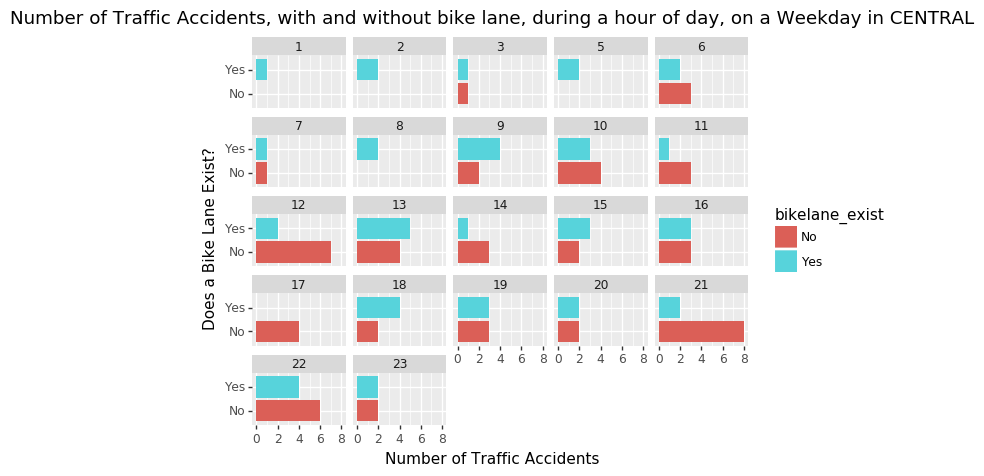

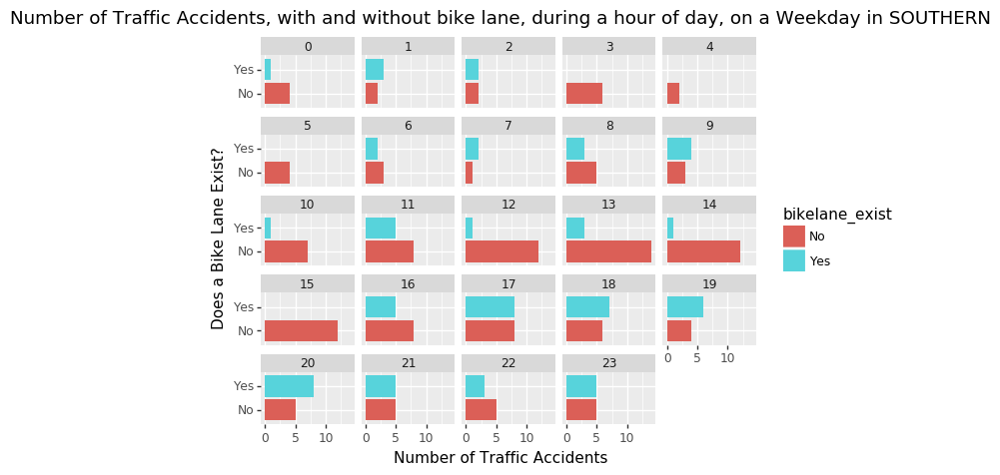

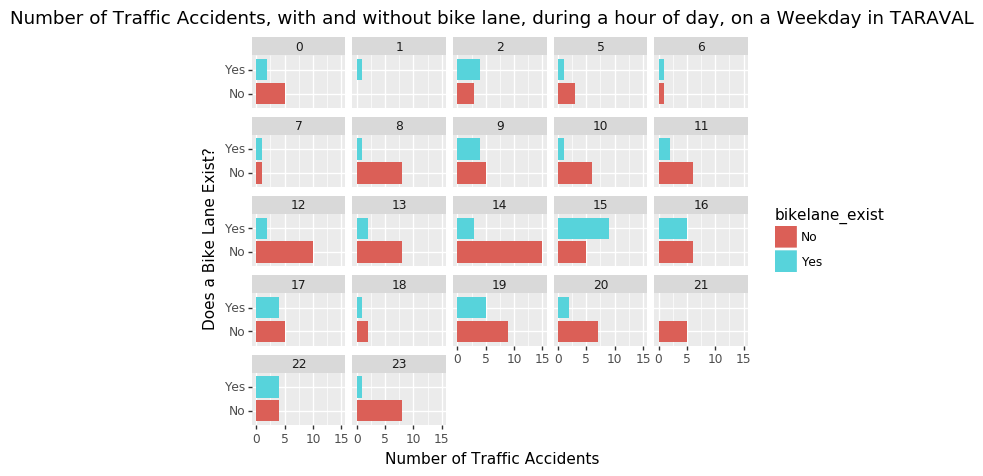

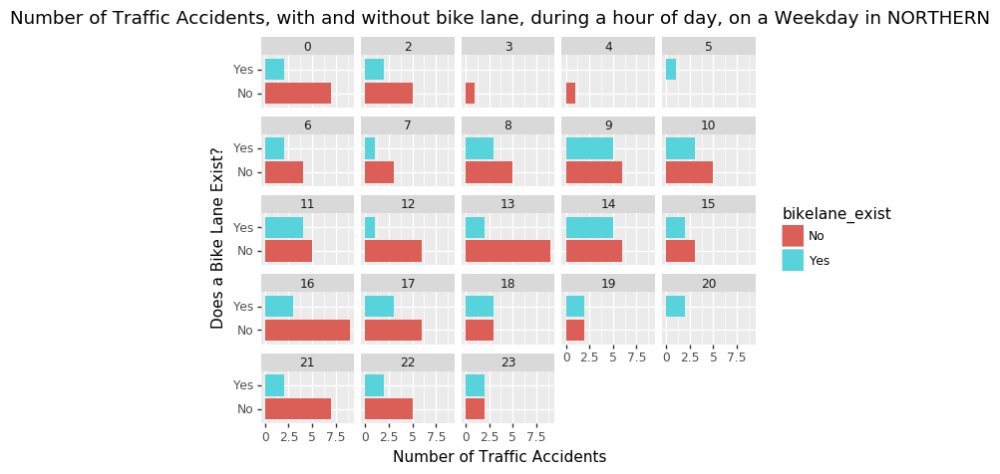

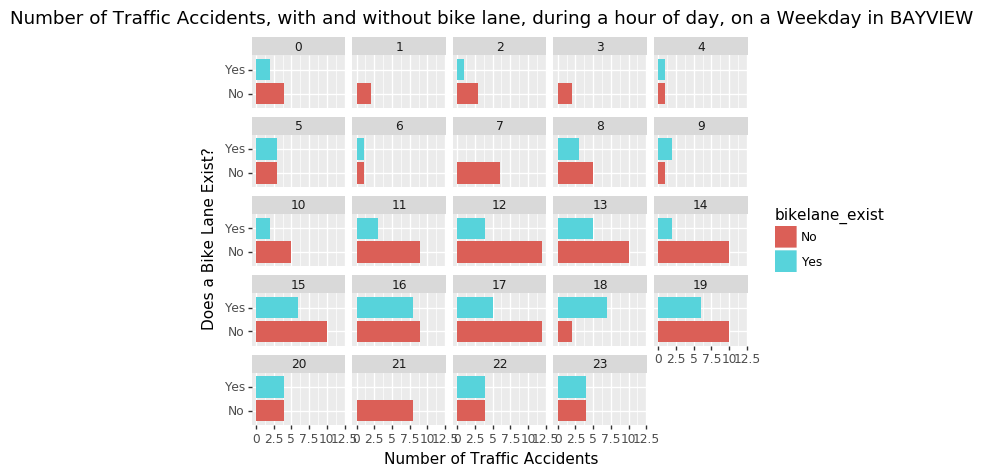

...

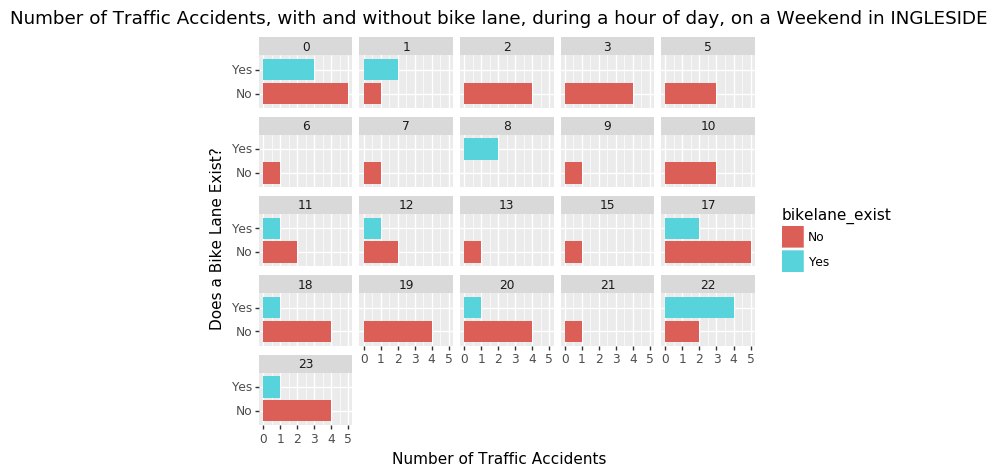

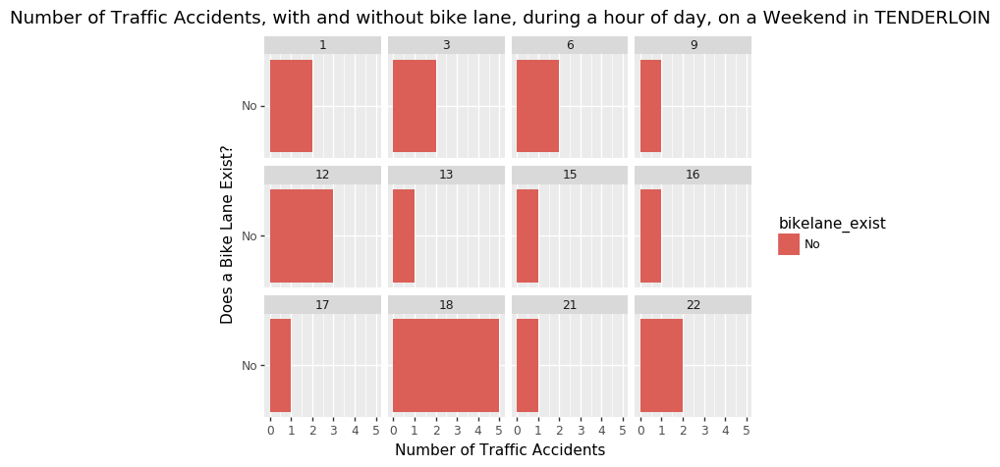

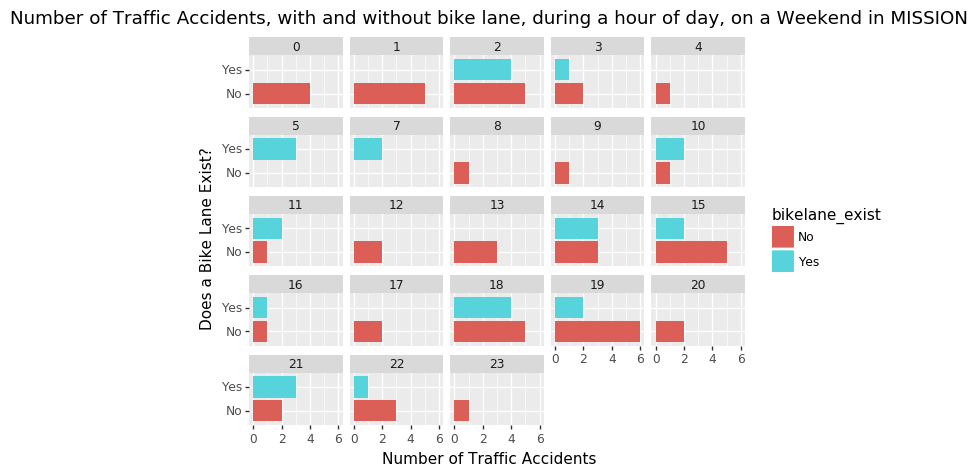

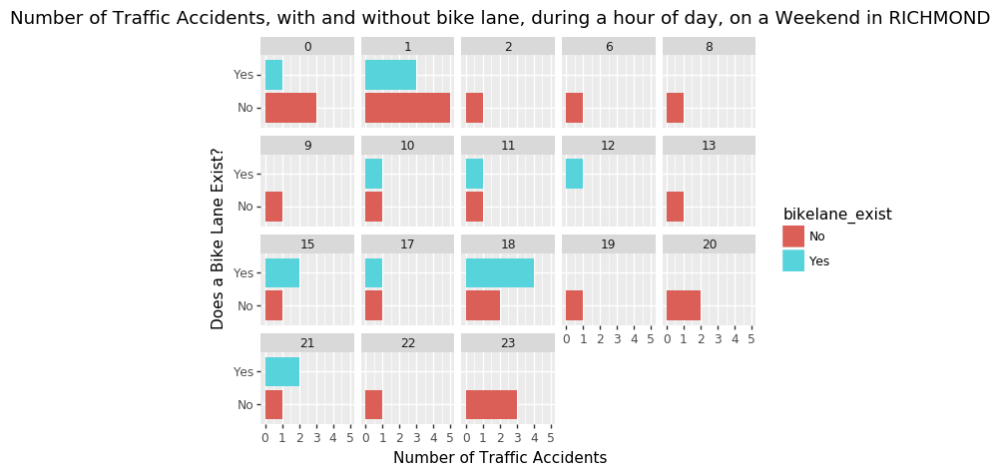

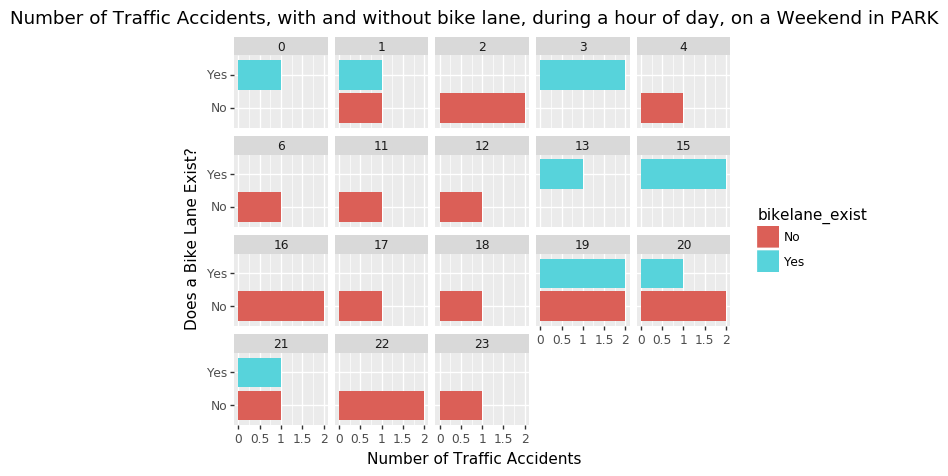

[<ggplot: (-9223371847919354024)>,
 <ggplot: (188934633259)>,
 <ggplot: (-9223371847920142476)>,
 <ggplot: (-9223371847919335182)>,
 <ggplot: (188935072639)>,
 <ggplot: (-9223371847919703096)>,
 <ggplot: (-9223371847920166901)>,
 <ggplot: (188950917503)>,
 <ggplot: (188934768669)>,
 <ggplot: (188935440525)>,
 <ggplot: (188951006377)>,
 <ggplot: (188951328874)>,
 <ggplot: (-9223371847919687750)>,
 <ggplot: (-9223371847920230719)>,
 <ggplot: (188934639375)>,
 <ggplot: (188935072765)>,
 <ggplot: (-9223371847918951164)>,
 <ggplot: (-9223371847920016864)>,
 <ggplot: (-9223371847919356542)>,
 <ggplot: (188935353871)>]

In [271]:
accidentsby_ifhour_bikelane_day_district_plots

Notice that some places do not have bike lanes!

But if we take the results at face value, it looks like that every district has more accidents off bike lanes than on bike lanes

## What are the number of accidents per neighborhood, per year?

In [24]:
traffic_reports_by_year = traffic_reports_and_bikelanes3.groupby(['accident_year', 'bikelane_exist', 'PdDistrict'], as_index = False)['Category'].count()
#drop 2018 point
#traffic_reports_by_year = traffic_reports_by_year.drop([(traffic_reports_by_year.shape[0]-1)], axis = 0)
traffic_reports_by_year.rename(columns={'Category': 'accident_counts'}, inplace=True)
traffic_reports_by_year = traffic_reports_by_year.reset_index( drop = True) #traffic_reports_and_bikelanes

# drop 2018 since traffic accident dataset only goes til May 2018
traffic_reports_by_year.drop( traffic_reports_by_year.loc[ traffic_reports_by_year.accident_year == 2018 ].index , inplace = True)

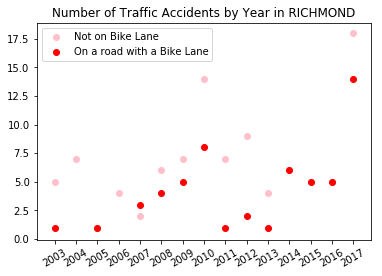

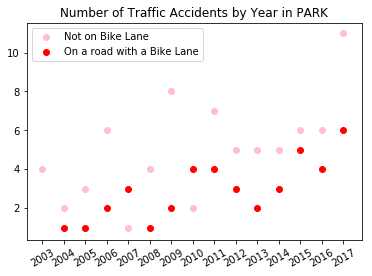

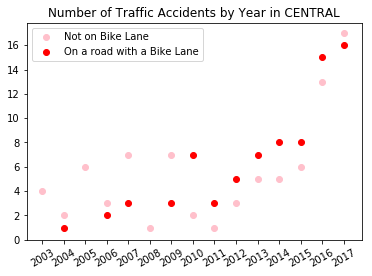

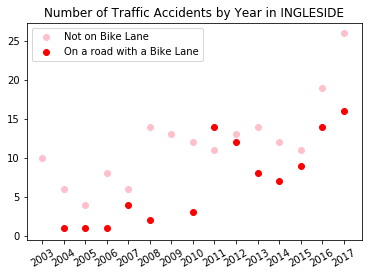

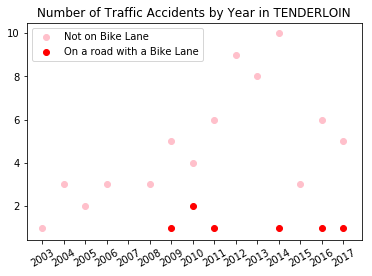

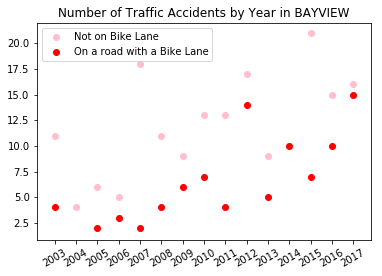

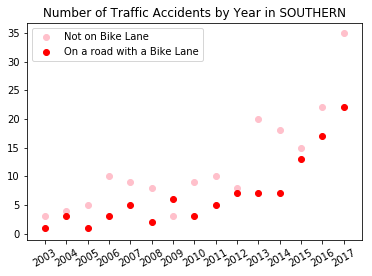

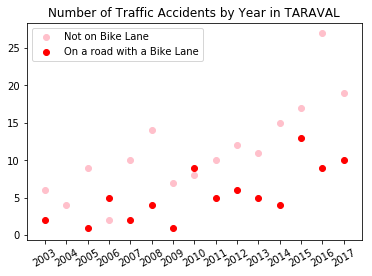

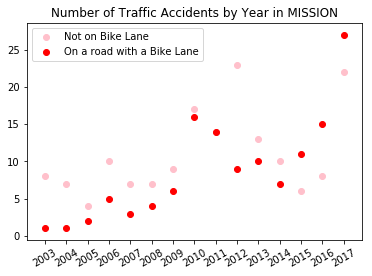

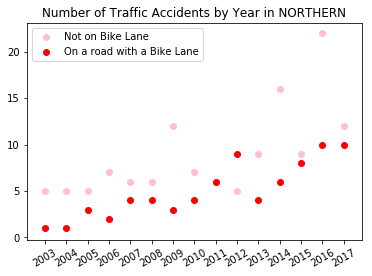

In [25]:
for i in set(traffic_reports_by_year.PdDistrict.tolist()):
    plt.scatter(traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == False) & (traffic_reports_by_year.PdDistrict == i), 'accident_year'], traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == False) & (traffic_reports_by_year.PdDistrict == i),'accident_counts'], label ='Not on Bike Lane', color = 'pink' )
    plt.scatter(traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == True) & (traffic_reports_by_year.PdDistrict == i), 'accident_year'], traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == True) & (traffic_reports_by_year.PdDistrict == i),'accident_counts'], label ='On a road with a Bike Lane', color = 'red')
    plt.title( ("Number of Traffic Accidents by Year in "+ i))
    plt.legend()
    plt.xticks(np.unique(traffic_reports_by_year['accident_year']), fontsize=10, rotation=30, ha='center', va='top')
    #fig.set_size_inches(18.5, 10.5, forward=True)a
    #plt.xticks(ticks=np.arange(0, 440/57.2985, 90/57.2985), fontsize=12, rotation=30, ha='center', va='top')  # 1 radian = 57.2985 degrees
    plt.show()

We can see there is typically just a trend upward in number of accidents. I'm sure this is partially due to trends in biking, due to overall increase in traffic in SF. It's also, very likely, to do with number of bike lanes and length of bike lanes in an area! I think it's worth investigating that distance of bikelanes makes a difference and effects results

It's also worth mentioning that the number of accidents are higher off a bike lane than on a bike lane. But again this could be due to the fact that there is more road without a bike lane than with a bike lane


## Bike Lane Length over the years

For historical context, how have the number of bike lanes increased over the years?

In [153]:
bikelanes_peryear = bikeway_map3.groupby(['install_yr']).sum()['length'].reset_index()
bikelanes_peryear.columns = ['year', 'len_bikelane_installed']
bikelanes_peryear['len_bikelane_network'] = bikelanes_peryear['len_bikelane_installed'].cumsum()

# drop first and last row - year is '0' (before 1971) and last being year 2018 which doesn't have all the datapoints, unless it was a slow year for bike lanes
bikelanes_peryear = bikelanes_peryear.drop([(bikelanes_peryear.shape[0]-1), 0], axis = 0).reset_index(drop = True)

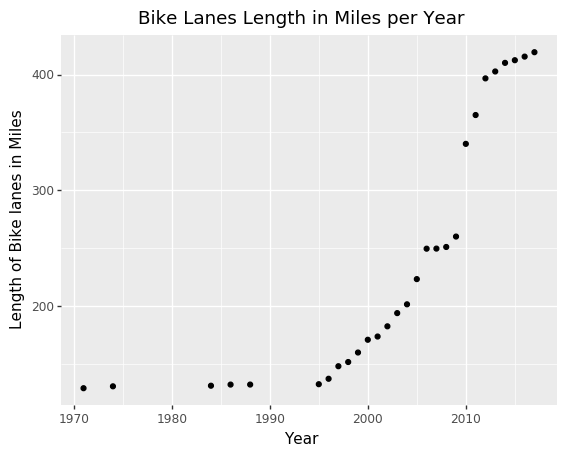

<ggplot: (188934435599)>

In [154]:
(ggplot(bikelanes_peryear, aes( x='year', y = 'len_bikelane_network')) + geom_point()
 + labs(title=('Bike Lanes Length in Miles per Year'), x='Year', y='Length of Bike lanes in Miles'))

Some years are skipped due to lack of installations in that year (we can add them later). We see that they have increased dramatically between 2000 and 2018. There's definitely a correlation between bike lane installations and accidents. Let's consider putting bike lane network miles as a control for the entire dataset

### What I'm using for the flask app!

In [84]:
traffic_reports_and_bikelanes3.to_csv( 'BikewayNetwork_edit/accidents_bikelanes_roads_wlengths.csv')

In [73]:
daysofweek_array = np.array(set(traffic_reports_and_bikelanes3.DayOfWeek )).tolist()
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes3.groupby(['cnn_of_road' ,'globalid','hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday', 'road_length', 'bikelane_length_haver'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [74]:
accidentsby_ifhour_bikelane.traffic_accidents.value_counts()

1    842
2     11
3      3
4      2
Name: traffic_accidents, dtype: int64

In [85]:
accidentsby_ifhour_bikelane2 = accidentsby_ifhour_bikelane.groupby(['hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday'], as_index = False)['traffic_accidents', 'road_length', 'bikelane_length_haver'].sum().sort_values( by = ['bikelane_exist', 'hour', 'DayOfWeek'])

In [86]:
def calc_standard( row ):
    if row['bikelane_exist'] == "No":
        return (row['traffic_accidents']/row['road_length'] )
    else:
        return (row['traffic_accidents'] /row['bikelane_length_haver'])


In [87]:
accidentsby_ifhour_bikelane2['standardized_metric'] = accidentsby_ifhour_bikelane2.apply( lambda x: calc_standard(x) , axis = 1)

In [88]:
accidents_hour_bikelane_day_graphs_std =[]

for i in set(accidentsby_ifhour_bikelane2.isWeekday):
    accidents_hour_bikelane_day2 = accidentsby_ifhour_bikelane2.loc[traffic_reports_and_bikelanes.isWeekday == i, ['bikelane_exist', 'hour', 'standardized_metric']]
    accidents_hour_bikelane_day_graphs_std.append((ggplot(accidents_hour_bikelane_day2, aes(x='bikelane_exist', y = 'standardized_metric'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, time of day on ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)

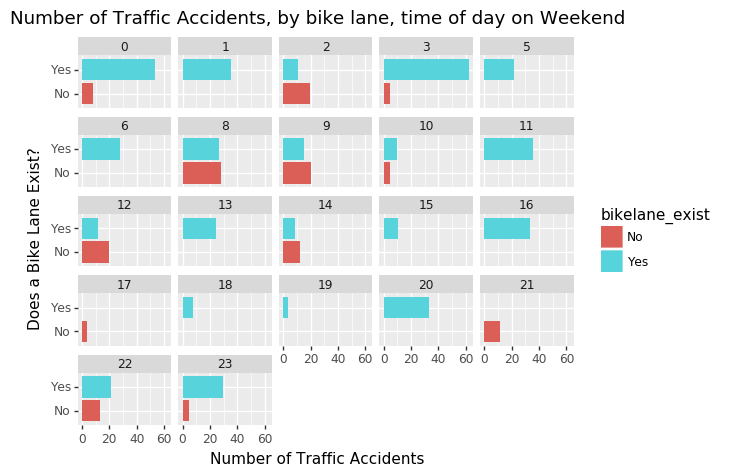

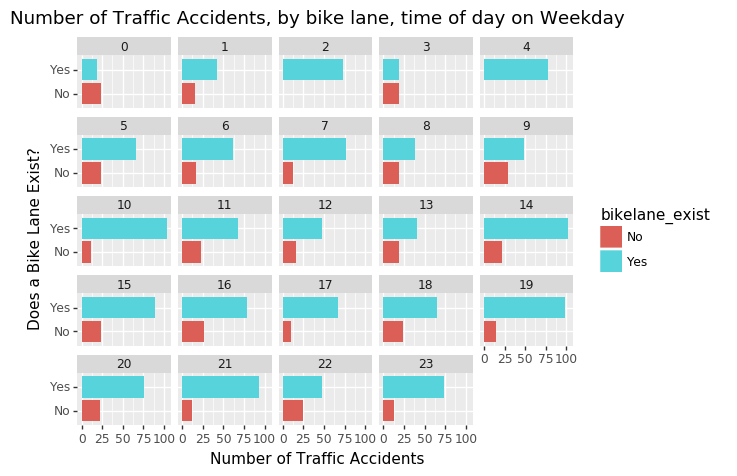

[<ggplot: (168674888491)>, <ggplot: (-9223371868179891810)>]

In [89]:
accidents_hour_bikelane_day_graphs_std

In [ ]:
select accidents_where

## Bike lanes vs Roads vs Accidents Map

Lanebreach at Code4SF is working on something more detailed than dynamic than this. However in the mean time, this was pretty interesting to learn to use matplotlib

In [23]:
traffic_reports_and_bikelanes['point'] = [Point(xy) for xy in zip(traffic_reports_and_bikelanes.X, traffic_reports_and_bikelanes.Y)]

In [24]:
traffic_reports_map = gpd.GeoDataFrame( \
    traffic_reports_and_bikelanes[ ['X', 'Y', 'Category', 'Descript', 'DayOfWeek', 'accident_year', 'bikelane_exist'] ],  \
    geometry =  traffic_reports_and_bikelanes.point, crs = bikeway_map3.crs)

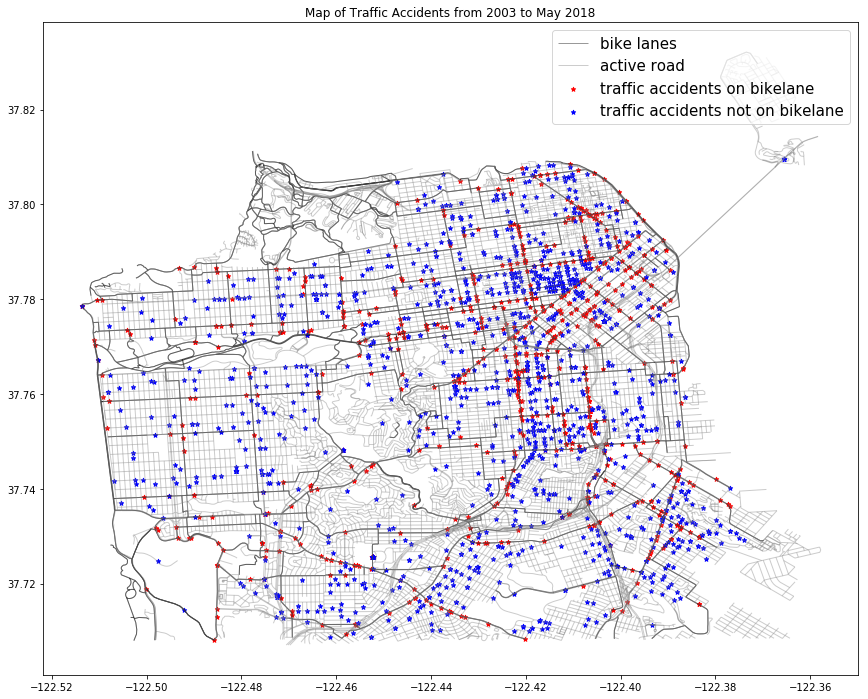

In [114]:
fig, ax=plt.subplots(figsize=(16,12))
#plt.xticks(traffic_reports_by_year['accident_year'], fontsize=10, rotation=30, ha='center', va='top')

bikeway_map3.geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4, label = 'bike lanes') #
total_map.geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'grey', alpha = 0.4, label = 'active road') #

#bikeway_map3.loc[bikeway_map3.symbology == 'BIKE LANE', ].geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4) #
#bikeway_map3.loc[bikeway_map3.symbology == 'BIKE PATH', ].geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4) #
traffic_reports_map.loc[traffic_reports_map['bikelane_exist'] == True, ].plot( ax = ax,marker = '*',markersize = 20, color = 'red', label = "traffic accidents on bikelane")
traffic_reports_map.loc[traffic_reports_map['bikelane_exist'] == False, ].plot( ax = ax,marker = '*',markersize = 20, color = 'blue', label = "traffic accidents not on bikelane")

plt.legend(prop={'size':15})
plt.title('Map of Traffic Accidents from 2003 to May 2018')
plt.show()

Let create a chart of number of traffic accidents per year, on or not on a bike lane

In [32]:
traffic_reports_by_year2 = traffic_reports_and_bikelanes.groupby(['accident_year', 'bikelane_exist'], as_index = False)['Category'].count()
#drop 2018 point
#traffic_reports_by_year = traffic_reports_by_year.drop([(traffic_reports_by_year.shape[0]-1)], axis = 0)
traffic_reports_by_year2.rename(columns={'Category': 'accident_counts'}, inplace=True)
traffic_reports_by_year2 = traffic_reports_by_year2.reset_index( drop = True) #traffic_reports_and_bikelanes

# drop 2018 since traffic accident dataset only goes til May 2018
traffic_reports_by_year2.drop( traffic_reports_by_year2.loc[ traffic_reports_by_year2.accident_year == 2018 ].index , inplace = True)

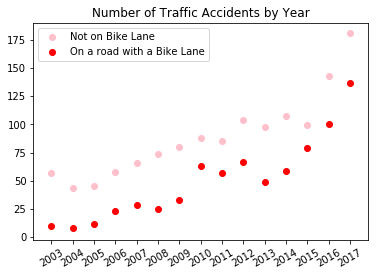

In [33]:
plt.scatter(traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == False), 'accident_year'], traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == False),'accident_counts'], label ='Not on Bike Lane', color = 'pink' )
plt.scatter(traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == True), 'accident_year'], traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == True),'accident_counts'], label ='On a road with a Bike Lane', color = 'red')
plt.title( ("Number of Traffic Accidents by Year"))
plt.legend()
plt.xticks(np.unique(traffic_reports_by_year2['accident_year']), fontsize=10, rotation=30, ha='center', va='top')
    #fig.set_size_inches(18.5, 10.5, forward=True)a
    #plt.xticks(ticks=np.arange(0, 440/57.2985, 90/57.2985), fontsize=12, rotation=30, ha='center', va='top')  # 1 radian = 57.2985 degrees
plt.show()

Trend of more accidents without a bike lane than with a bike lane, per year

Let's see what happens when we look at this data by neighborhood

In [24]:
traffic_reports_by_year = traffic_reports_and_bikelanes.groupby(['accident_year', 'bikelane_exist', 'PdDistrict'], as_index = False)['Category'].count()
#drop 2018 point
#traffic_reports_by_year = traffic_reports_by_year.drop([(traffic_reports_by_year.shape[0]-1)], axis = 0)
traffic_reports_by_year.rename(columns={'Category': 'accident_counts'}, inplace=True)
traffic_reports_by_year = traffic_reports_by_year.reset_index( drop = True) #traffic_reports_and_bikelanes

# drop 2018 since traffic accident dataset only goes til May 2018
traffic_reports_by_year.drop( traffic_reports_by_year.loc[ traffic_reports_by_year.accident_year == 2018 ].index , inplace = True)

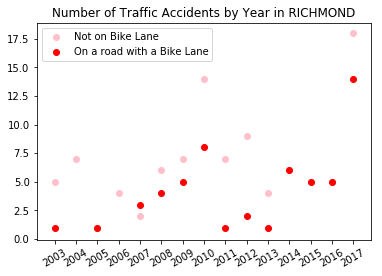

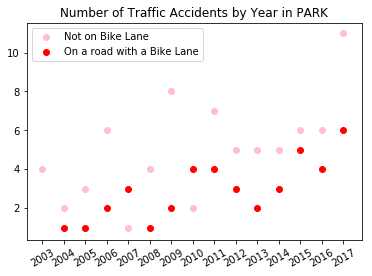

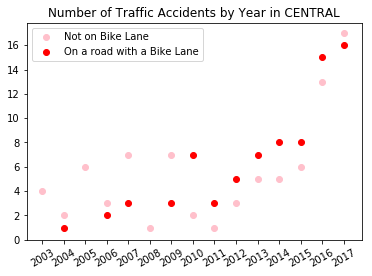

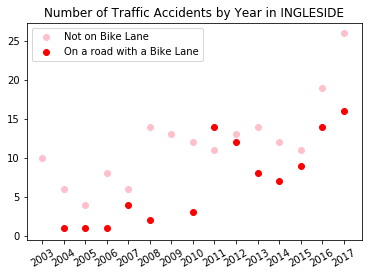

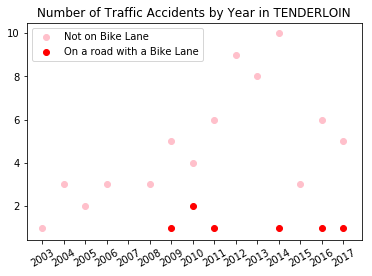

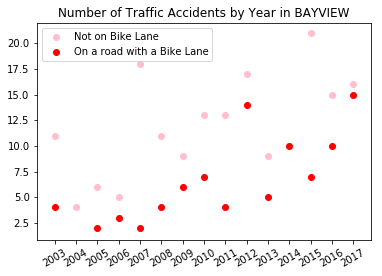

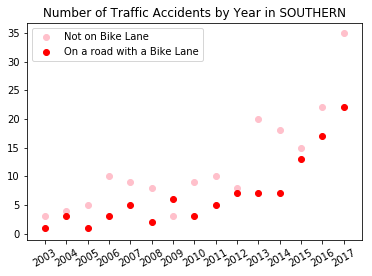

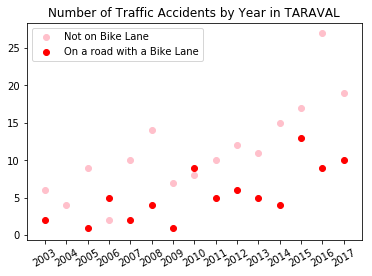

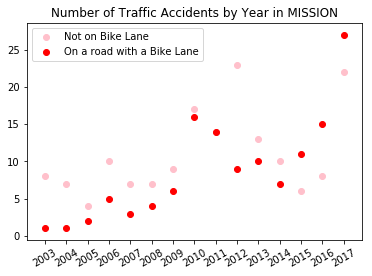

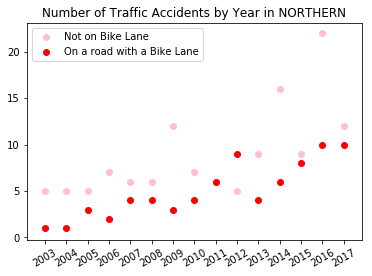

In [25]:
for i in set(traffic_reports_by_year.PdDistrict.tolist()):
    plt.scatter(traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == False) & (traffic_reports_by_year.PdDistrict == i), 'accident_year'], traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == False) & (traffic_reports_by_year.PdDistrict == i),'accident_counts'], label ='Not on Bike Lane', color = 'pink' )
    plt.scatter(traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == True) & (traffic_reports_by_year.PdDistrict == i), 'accident_year'], traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == True) & (traffic_reports_by_year.PdDistrict == i),'accident_counts'], label ='On a road with a Bike Lane', color = 'red')
    plt.title( ("Number of Traffic Accidents by Year in "+ i))
    plt.legend()
    plt.xticks(np.unique(traffic_reports_by_year['accident_year']), fontsize=10, rotation=30, ha='center', va='top')
    #fig.set_size_inches(18.5, 10.5, forward=True)a
    #plt.xticks(ticks=np.arange(0, 440/57.2985, 90/57.2985), fontsize=12, rotation=30, ha='center', va='top')  # 1 radian = 57.2985 degrees
    plt.show()

Traffic accidents are clearly going up over the years for all locations. Differences between effects of a bike lane vs without bike lane are lower in Mission than in Tenderloin. But this could be a function of the fact that some places have more bike lanes than other places.

I think it would be helpful to look at the ratio of accidents to bike lanes lengths vs the ratio of accidents to roads (without bike lanes lengths), per neighborhood.

## Let's see if there looks like there is a trend between number of accidents and bike lane type

This isn't a regression but it looks like there are a lot more accidents on a bike lane and bike path, because there are more of this type of lane

In [557]:
traffic_reports_and_bikelanes['Time'] = pd.to_datetime(traffic_reports_and_bikelanes['Time'])
traffic_reports_and_bikelanes['hour'] = traffic_reports_and_bikelanes['Time'].apply(lambda x: x.hour)

In [150]:
# figure out how much each bike lane type covers sf in miles
symbology_lengths = pd.merge( bikeway_map3.groupby('symbology')['length'].sum().reset_index(), traffic_reports_and_bikelanes.symbology.value_counts().reset_index(), how = 'left', right_on = "index", left_on = "symbology", sort = False)
symbology_lengths.drop( 'index', axis = 1, inplace = True)
symbology_lengths.columns =  ['symbology', 'length_mi', 'accident_counts']
symbology_lengths['length_percent'] = symbology_lengths.length_mi / np.sum(symbology_lengths.length_mi)

# text formatting for chart - very imp to point this out!
symbology_lengths['length_percent_str'] = (np.round(symbology_lengths['length_percent']*100).astype(str)  + "%").tolist()
symbology_lengths['x_index'] = symbology_lengths.symbology + " (" + symbology_lengths.length_percent_str + ")"

C:\Anaconda3\lib\site-packages\plotnine\layer.py:430: UserWarning: position_stack : Removed 1 rows containing missing values.
  data = self.position.setup_data(self.data, params)


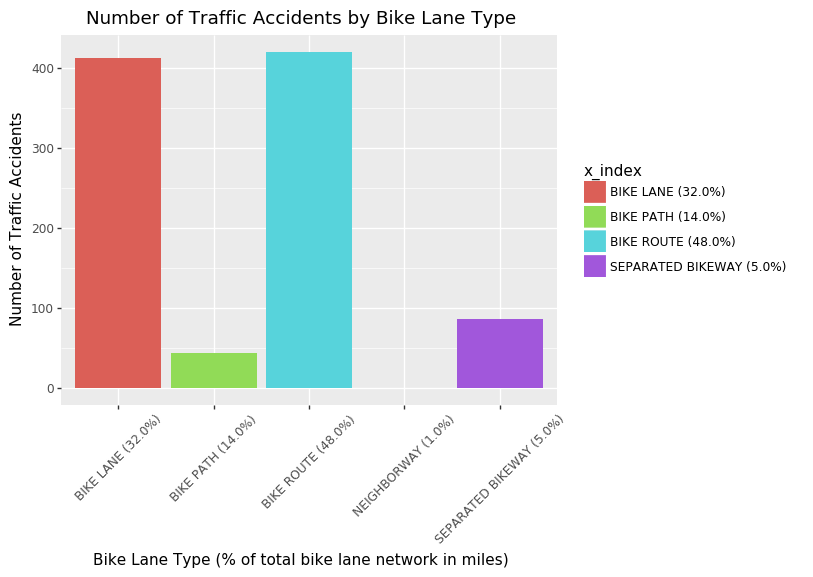

<ggplot: (-9223371905425364939)>

In [36]:
(ggplot(symbology_lengths, aes(x ='x_index', y='accident_counts', fill = 'x_index'))
 + geom_bar( stat='identity') + theme(axis_text_x = element_text(angle=45) )
    + labs(title=('Number of Traffic Accidents by Bike Lane Type'), x='Bike Lane Type (% of total bike lane network in miles)', y='Number of Traffic Accidents'))

## Let's see if there's a trend between accidents and neighborhood

In [ ]:
'cnn_of_road' ,'globalid','hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday', 'road_length', 'bikelane_length_haver'

In [103]:
traffic_reports_and_bikelanes.columns

Index(['Unnamed: 0', 'IncidntNum', 'Category', 'Descript', 'DayOfWeek', 'Date',
       'Time', 'PdDistrict', 'Resolution', 'Address', 'X', 'Y', 'Location',
       'PdId', 'accident_year', 'globalid', 'bikelane_exist',
       'install_yr_accid', 'barrier', 'biap', 'buffered', 'cnn', 'contraflow',
       'date_creat', 'time_creat', 'created_us', 'dir', 'direct', 'double',
       'facility_t', 'from_st', 'fy', 'greenwave', 'install_mo',
       'install_yr_bikelane', 'date_last_', 'time_last_', 'last_edite',
       'length', 'notes', 'number', 'objectid', 'qtr', 'raised', 'shape_len',
       'sharrow', 'sm_sweeper', 'street', 'streetname', 'surface_tr',
       'symbology', 'to_st', 'update_mo', 'update_yr', 'censusbloc',
       'geometry', '_merge', 'bikelane_installdate', 'isWeekday'],
      dtype='object')

In [111]:
accident_counts_bydistrict_bikelane_exist = traffic_reports_and_bikelanes3.groupby(['bikelane_exist', 'PdDistrict', 'accident_year', 'cnn_of_road', 'globalid', 'road_length', 'bikelane_length_haver']).agg({'Category':'count'}).reset_index()

accident_counts_bydistrict_bikelane_exist.rename( columns = {'Category': 'accident_counts'}, inplace = True)
accident_counts_bydistrict_bikelane_exist = accident_counts_bydistrict_bikelane_exist.groupby( ['bikelane_exist', 'PdDistrict', 'accident_year'], as_index = False)['accident_counts','road_length', 'bikelane_length_haver'].sum()

#accident_counts_bydistrict = traffic_reports_and_bikelanes.groupby([ 'PdDistrict']).count()['Category'].reset_index()
#accident_counts_bydistrict.rename( columns = {'Category': 'accident_counts'}, inplace = True)


In [114]:
def calc_standard( row ):
    if row['bikelane_exist'] == "No":
        return (row['accident_counts']/row['road_length'] )
    else:
        return (row['accident_counts'] /row['bikelane_length_haver'])

In [115]:
accident_counts_bydistrict_bikelane_exist['std_metric'] = accident_counts_bydistrict_bikelane_exist.apply(calc_standard, axis = 1)

In [129]:
num_traffic_neighborhood = (ggplot(accident_counts_bydistrict_bikelane_exist.loc[ 'accident_year' , ], aes(x ='PdDistrict', y='std_metric', fill = 'bikelane_exist'))
 + geom_bar( stat='identity', position='dodge', show_legend=True) + theme(axis_text_x = element_text(angle=45)) + \
                            labs(title=('Number of Traffic Accidents per meter of road by Neighborhood'), x='Neighborhood', y='Number of Traffic Accidents', fill = "Does the road have Bike Lanes?") \
                           )

C:\Anaconda3\lib\site-packages\plotnine\guides\guides.py:198: UserWarning: Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it
  "variable to it".format(output))


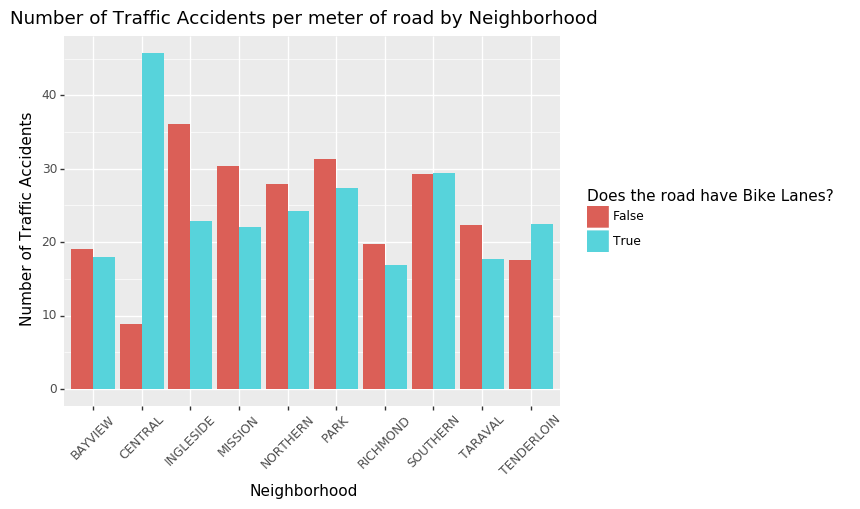

<ggplot: (-9223371868163444536)>

In [130]:
num_traffic_neighborhood

We are also not really accounting for size of the neighborhood here (in terms of road ways!) It would be helpful to have data on the road way map size per neighborhood?

## Accidents by Hour, district, weekday vs weekend

Now, let's look at number of accidents by hour of the day

In [564]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'PdDistrict', 'Day', ''], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

.6% of roads are bikeways 

In [565]:
accidentsby_byhour = accidentsby_ifhour_bikelane.groupby('hour').sum()['traffic_accidents'].reset_index()

In [566]:
num_traffic_accidents_hour = (ggplot(accidentsby_byhour, aes(x = 'hour', y = 'traffic_accidents')) + geom_bar(stat= 'identity')
 + labs(title=('Number of Traffic Accidents by Time of Day'), x='Time (24:00 format)', y='Number of Traffic Accidents'))

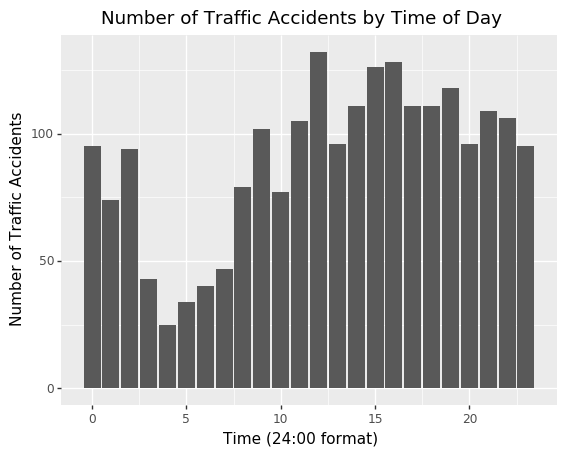

<ggplot: (-9223371904483382826)>

In [567]:
num_traffic_accidents_hour

## Accidents by Hour

Now, let's look at number of accidents by hour of the day

In [564]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

.6% of roads are bikeways 

In [565]:
accidentsby_byhour = accidentsby_ifhour_bikelane.groupby('hour').sum()['traffic_accidents'].reset_index()

In [566]:
num_traffic_accidents_hour = (ggplot(accidentsby_byhour, aes(x = 'hour', y = 'traffic_accidents')) + geom_bar(stat= 'identity')
 + labs(title=('Number of Traffic Accidents by Time of Day'), x='Time (24:00 format)', y='Number of Traffic Accidents'))

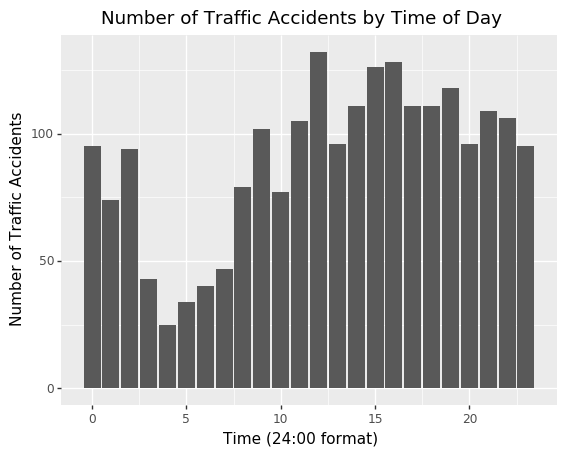

<ggplot: (-9223371904483382826)>

In [567]:
num_traffic_accidents_hour

ways graphic can be improved
- write number of accidents
- show entire bottom scale
- We're not 'controlling' for location, bike lane type, day of week, yaer

## Accidents by time of day, on and not on a bike lane

Let's attempt to control for traffic accidents per day of week

In [558]:
accidents_ifbikelane_hour = (ggplot(accidentsby_ifhour_bikelane, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
 + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
 + coord_flip()
 + facet_wrap('hour')
 + labs(title='Number of Traffic Accidents for Road with/w/o Bike Lane, Hour in Day', x='Does a Bike Lane Exist?', y='Number of Traffic Accidents')
)

# of course I'd like to convert the hour to AM/PM format

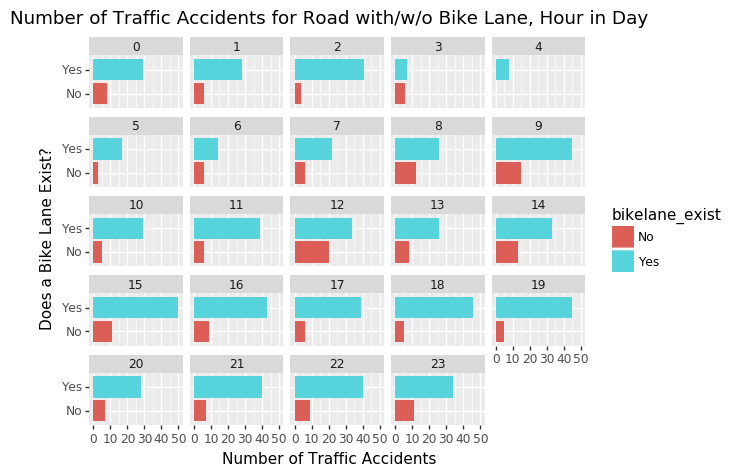

<ggplot: (-9223371904483376419)>

In [559]:
accidents_ifbikelane_hour

We see that there is a lot of difference in accidents when we include hour. If there were actually more counts of accidents per each hour in this dataset, I would definitely put a control for hour in the ultimate regression

It would be interesting to visualize this by day of week if there are differences?

In [561]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [562]:
daysofweek_array = np.array(set(traffic_reports_and_bikelanes.DayOfWeek )).tolist()

## Accidents by time of day, week day vs weekend vs whether or not bike lane exists 

Accidents conditional on varying time of day, weekday vs weekend, and whether or not bike lane exists

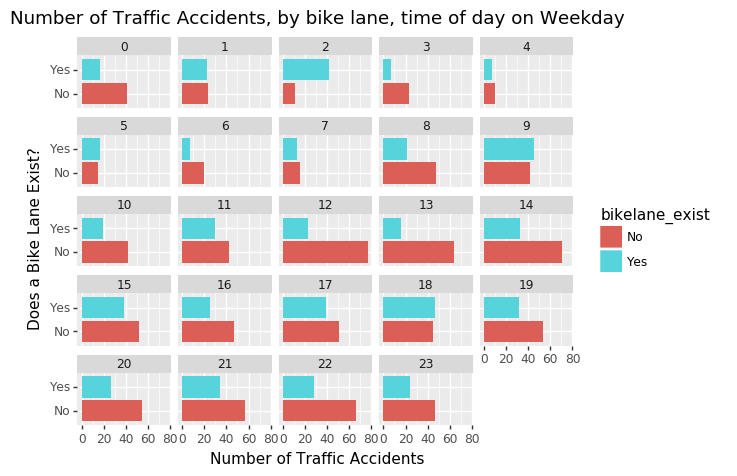

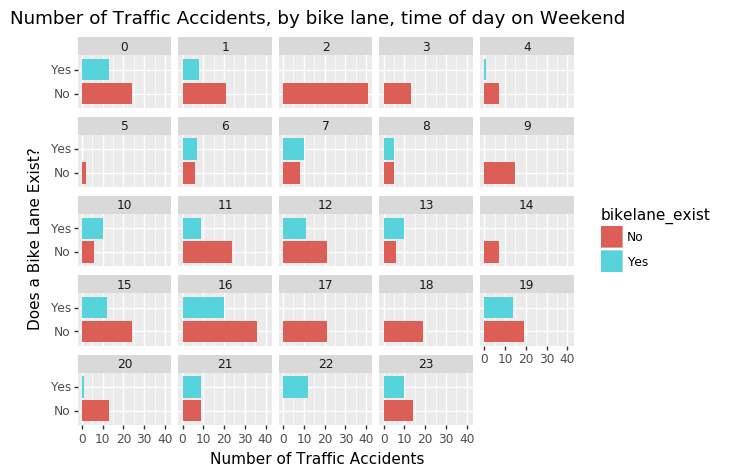

[<ggplot: (132372877523)>, <ggplot: (132371998847)>]

In [563]:
accidents_hour_bikelane_day_graphs = []

for i in set(accidentsby_ifhour_bikelane.isWeekday):
    accidents_hour_bikelane_day = accidentsby_ifhour_bikelane.loc[traffic_reports_and_bikelanes.isWeekday == i]
    accidents_hour_bikelane_day_graphs.append((ggplot(accidents_hour_bikelane_day, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, time of day on ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)
    
accidents_hour_bikelane_day_graphs

## Accidents conditional on varying time of day, day of week, and whether or not bike lane exists

In [249]:
for i in daysofweek_array:
    accidents_hour_bikelane_day = accidentsby_ifhour_bikelane.loc[traffic_reports_and_bikelanes.DayOfWeek == i]
    print((ggplot(accidents_hour_bikelane_day, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, during hour of day on a ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)

NameError: name 'accidentsby_ifhour_bikelane' is not defined

## Accidents conditional on varying time of day, day of week, neighborhood, and whether or not bike lane exists

In [596]:
accidentsby_ifhour_bikelane_day_district = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'isWeekday', 'PdDistrict'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane_day_district = accidentsby_ifhour_bikelane_day_district.reset_index(drop = True)
accidentsby_ifhour_bikelane_day_district.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane_day_district.bikelane_exist = accidentsby_ifhour_bikelane_day_district.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [597]:
accidentsby_ifhour_bikelane_day_district_plots = []

for i in (set(accidentsby_ifhour_bikelane_day_district.isWeekday)):
    for j in set( traffic_reports_and_bikelanes.PdDistrict):
        df_hold2 = accidentsby_ifhour_bikelane_day_district.loc[((accidentsby_ifhour_bikelane_day_district.isWeekday == i) & (accidentsby_ifhour_bikelane_day_district.PdDistrict == j))]
        accidentsby_ifhour_bikelane_day_district_plots.append((ggplot(df_hold2, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
         + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
         + coord_flip()
         + facet_wrap('hour')
         + labs(title=('Number of Traffic Accidents, with and without bike lane, during a hour of day, on a ' + i + ' in ' + j), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
        )

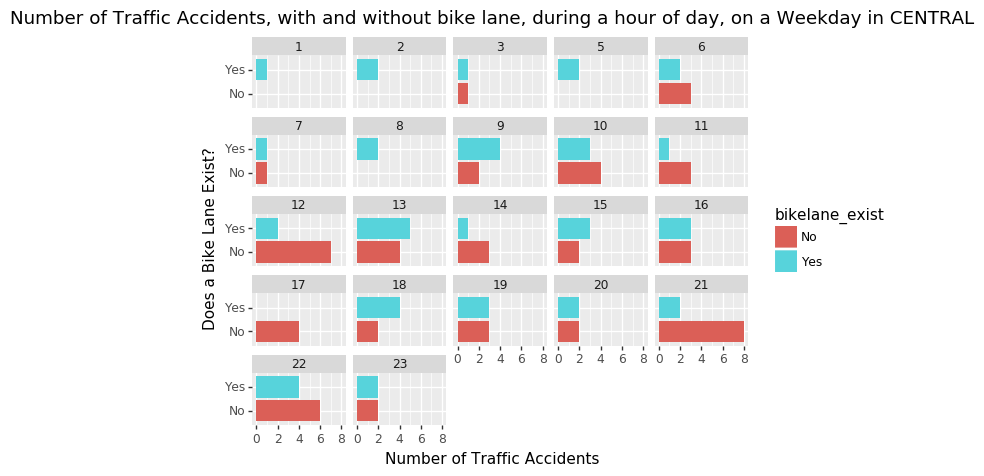

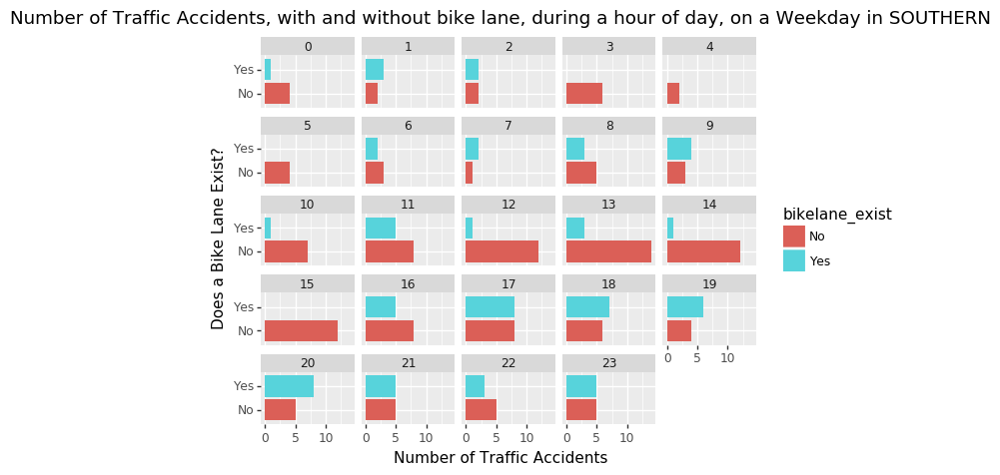

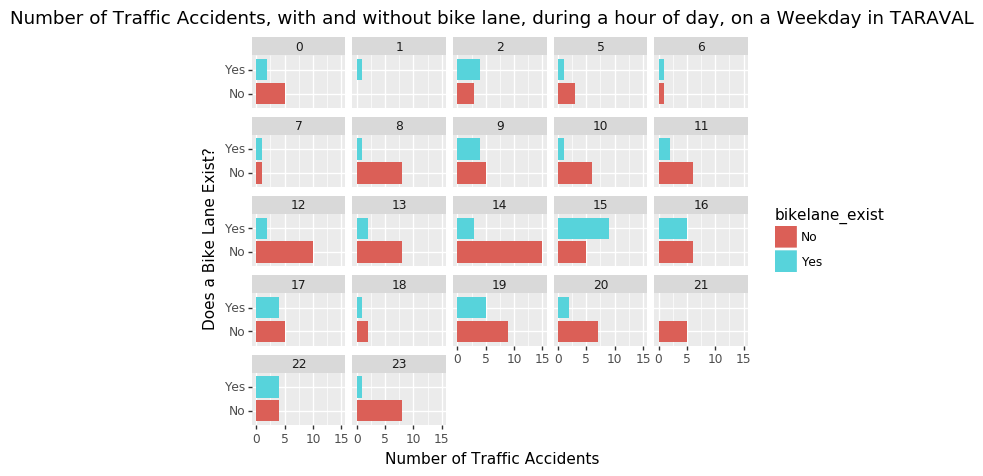

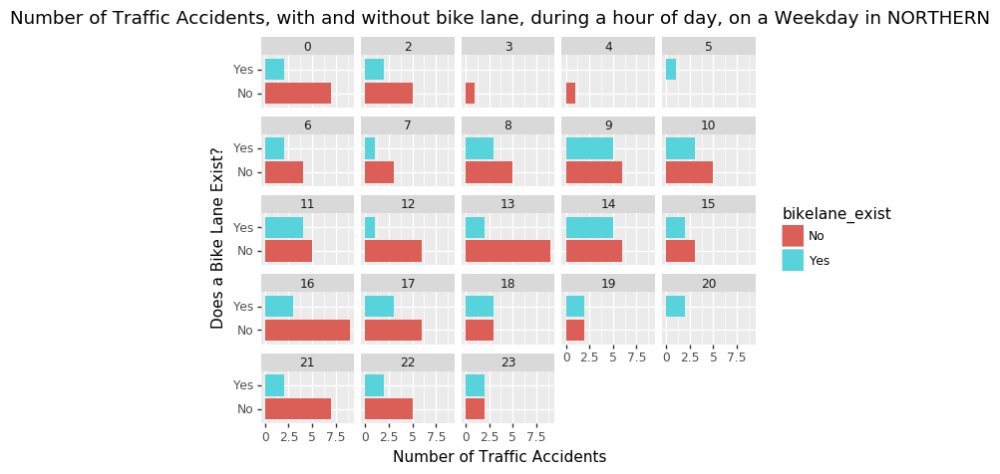

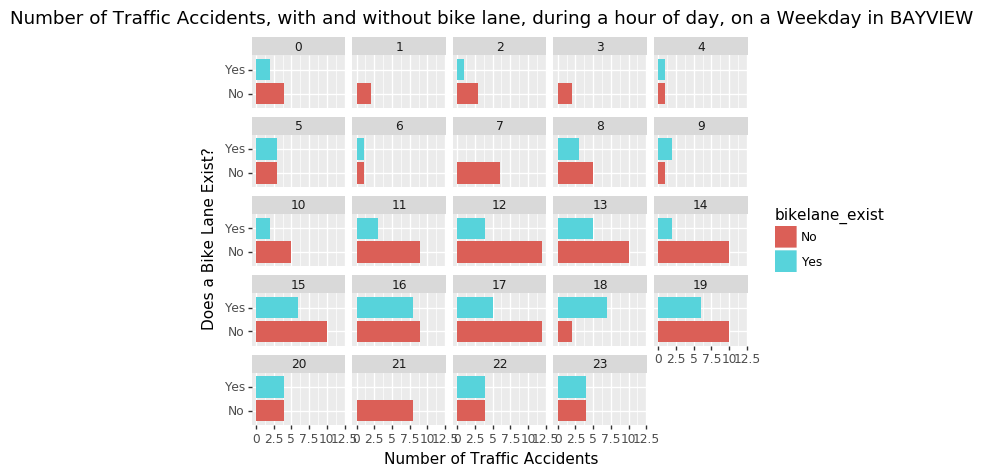

...

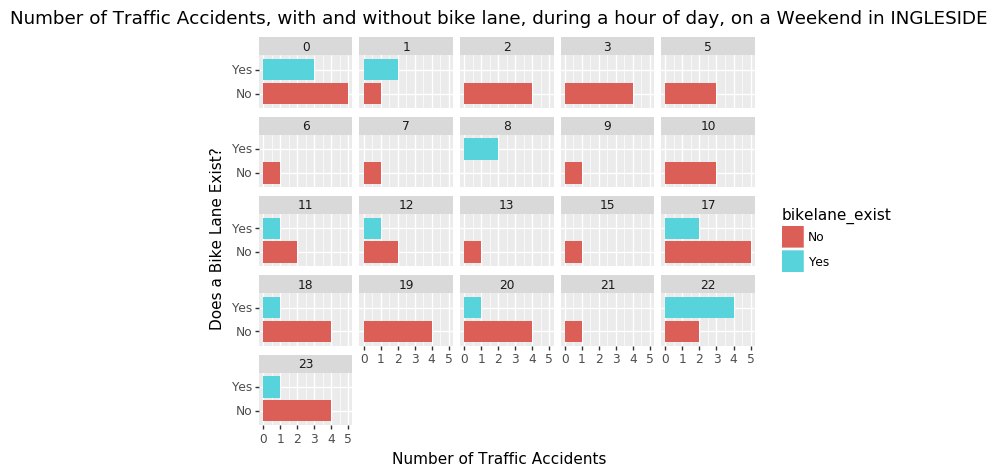

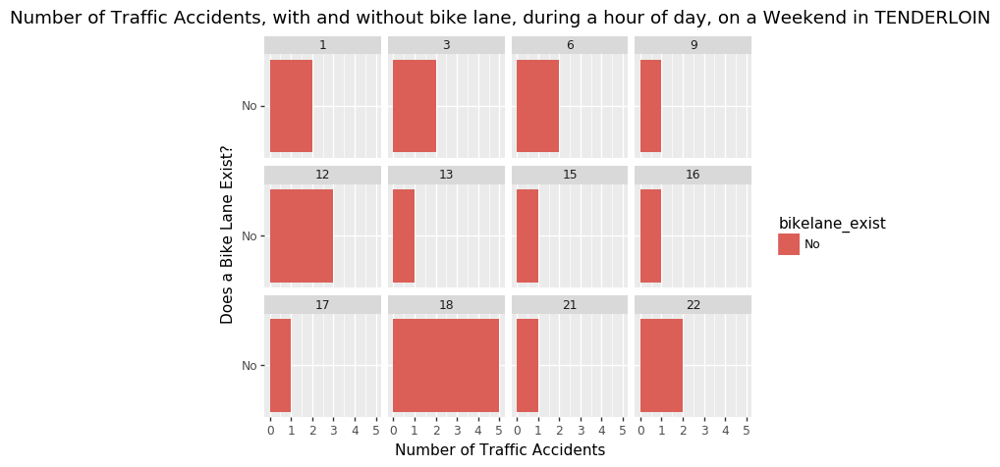

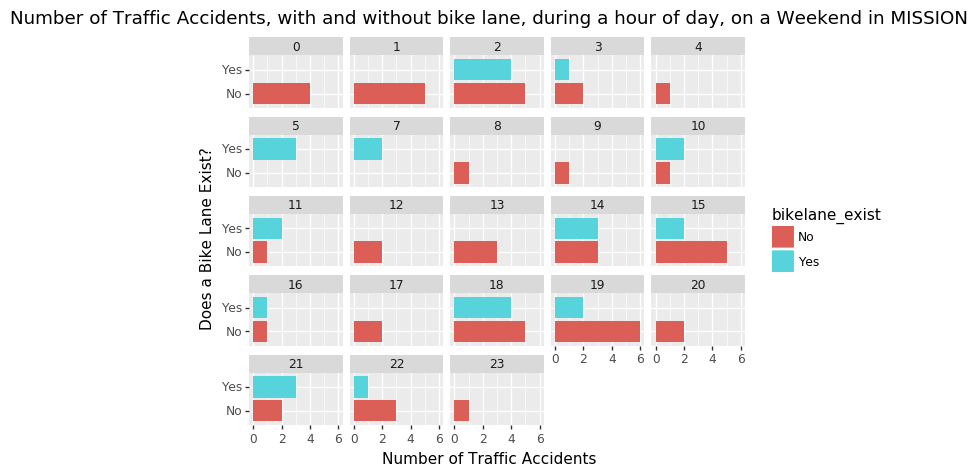

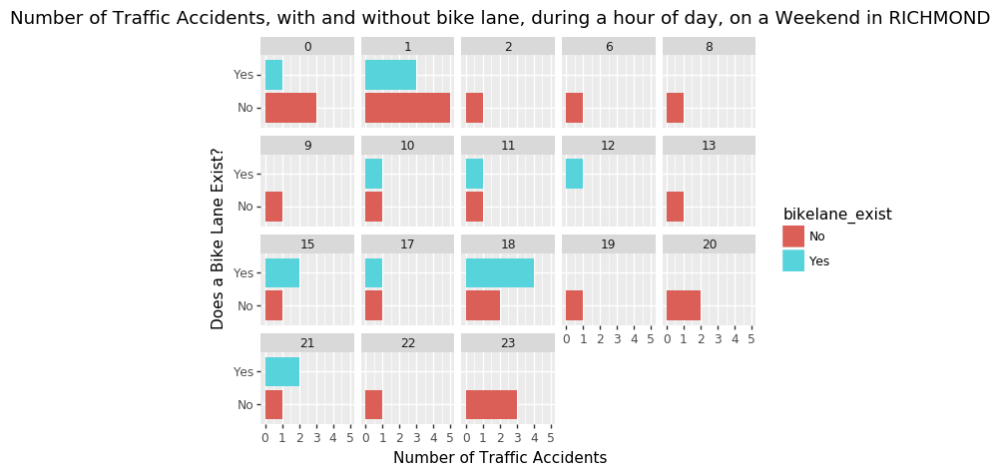

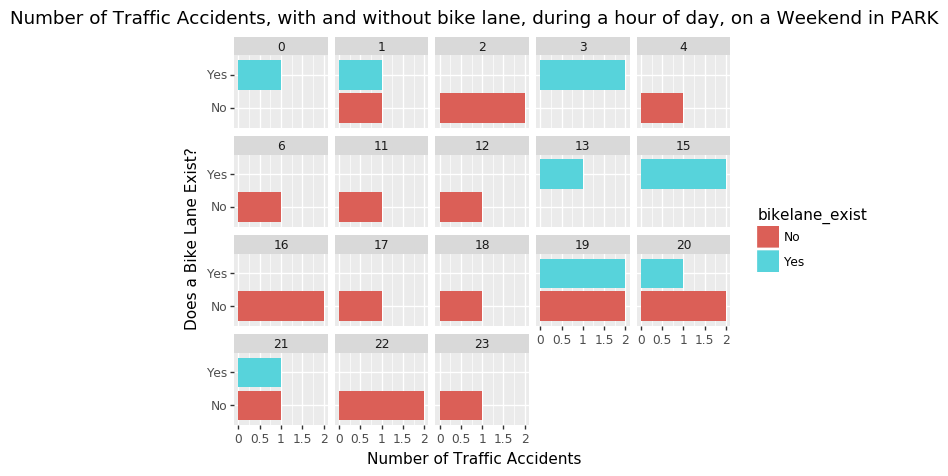

[<ggplot: (-9223371847919354024)>,
 <ggplot: (188934633259)>,
 <ggplot: (-9223371847920142476)>,
 <ggplot: (-9223371847919335182)>,
 <ggplot: (188935072639)>,
 <ggplot: (-9223371847919703096)>,
 <ggplot: (-9223371847920166901)>,
 <ggplot: (188950917503)>,
 <ggplot: (188934768669)>,
 <ggplot: (188935440525)>,
 <ggplot: (188951006377)>,
 <ggplot: (188951328874)>,
 <ggplot: (-9223371847919687750)>,
 <ggplot: (-9223371847920230719)>,
 <ggplot: (188934639375)>,
 <ggplot: (188935072765)>,
 <ggplot: (-9223371847918951164)>,
 <ggplot: (-9223371847920016864)>,
 <ggplot: (-9223371847919356542)>,
 <ggplot: (188935353871)>]

In [271]:
accidentsby_ifhour_bikelane_day_district_plots

## By neighborhood - Standardized Metric

In [582]:
accidentsby_ifhour_bikelane_day_district_std = traffic_reports_and_bikelanes3.groupby(['hour', 'bikelane_exist', 'isWeekday', 'PdDistrict','cnn_road','globalid', 'road_length', 'bikelane_length_haver'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane_day_district_std = accidentsby_ifhour_bikelane_day_district_std.reset_index(drop = True)
accidentsby_ifhour_bikelane_day_district_std.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane_day_district_std.bikelane_exist = accidentsby_ifhour_bikelane_day_district_std.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [583]:
# sum road length, bike lane length, traffic accident numbers by categories in question
accidentsby_ifhour_bikelane_day_district_std2 = accidentsby_ifhour_bikelane_day_district_std.groupby( ['hour', 'bikelane_exist', 'isWeekday', 'PdDistrict'], as_index=False)['traffic_accidents', 'road_length', 'bikelane_length_haver'].sum().sort_values( by =['bikelane_exist', 'hour'] )

In [ ]:
# sum road length, bike lane length, traffic accident numbers by categories in question
accidentsby_ifhour_bikelane_day_district_std2 = accidentsby_ifhour_bikelane_day_district_std.groupby( ['hour', 'bikelane_exist', 'isWeekday', 'PdDistrict'], as_index=False)['traffic_accidents', 'road_length', 'bikelane_length_haver'].sum().sort_values( by =['bikelane_exist', 'hour'] )

accidentsby_ifhour_bikelane_day_district_std2['std_metric'] = accidentsby_ifhour_bikelane_day_district_std2.apply(calc_standard, axis = 1)

In [585]:
accidentsby_ifhour_bikelane_day_district_std2['std_metric'] = accidentsby_ifhour_bikelane_day_district_std2.apply(calc_standard, axis = 1)

In [598]:
accidentsby_ifhour_bikelane_day_district_plots_std = []

for j in (set(accidentsby_ifhour_bikelane_day_district_std2.PdDistrict)): #iterate over weekday vs 
    for i in set(accidentsby_ifhour_bikelane_day_district_std2.isWeekday ):
        df_hold2 = accidentsby_ifhour_bikelane_day_district_std2.loc[((accidentsby_ifhour_bikelane_day_district_std2.isWeekday == i) & (accidentsby_ifhour_bikelane_day_district_std2.PdDistrict == j))]
        accidentsby_ifhour_bikelane_day_district_plots_std.append((ggplot(df_hold2, aes(x='bikelane_exist', y = 'std_metric'))         # defining what data to use
         + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
         + coord_flip()
         + facet_wrap('hour')
         + labs(title=('Number of Traffic Accidents, with and without bike lane, during a hour of day, on a ' + i + ' in ' + j + '/n standard metric'), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
        )

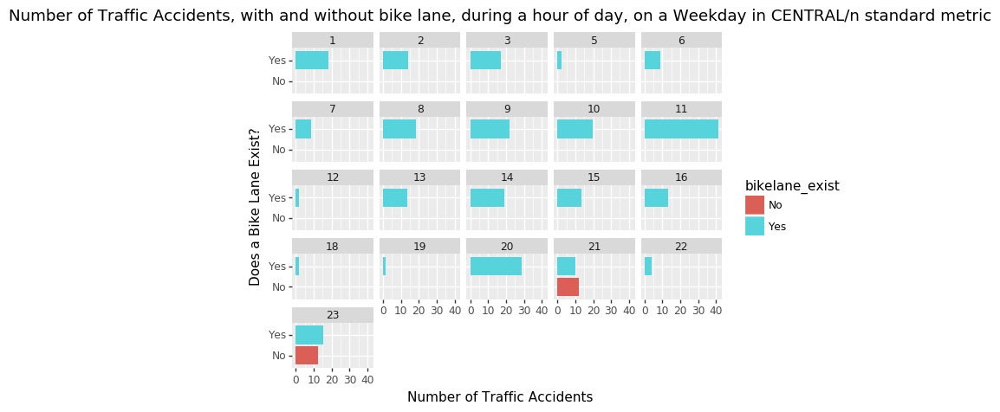

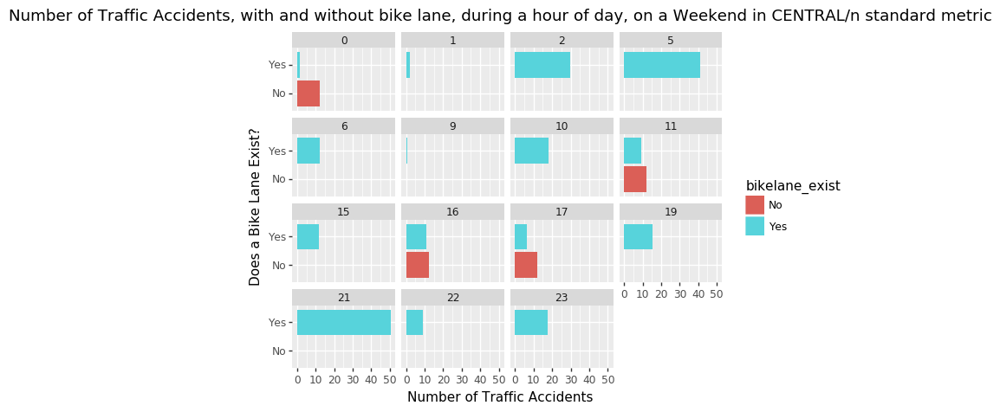

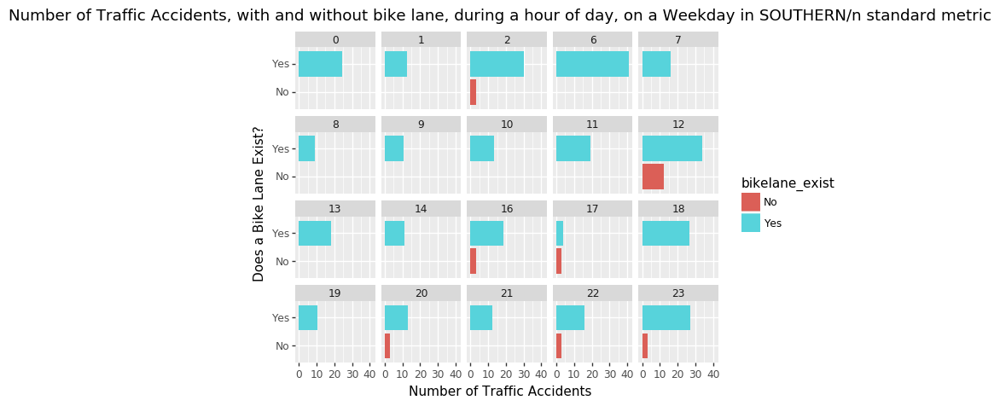

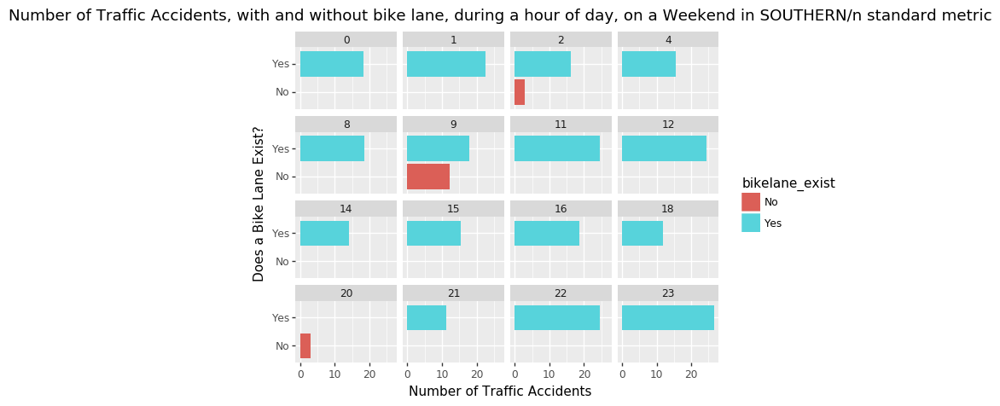

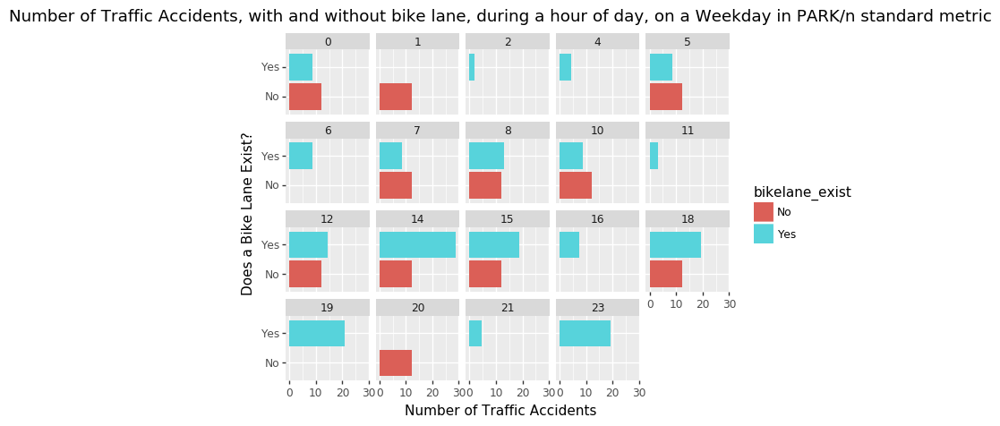

...

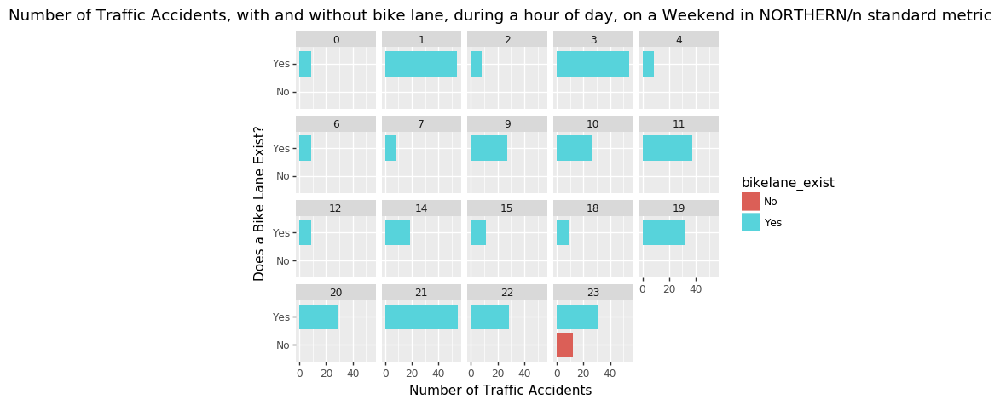

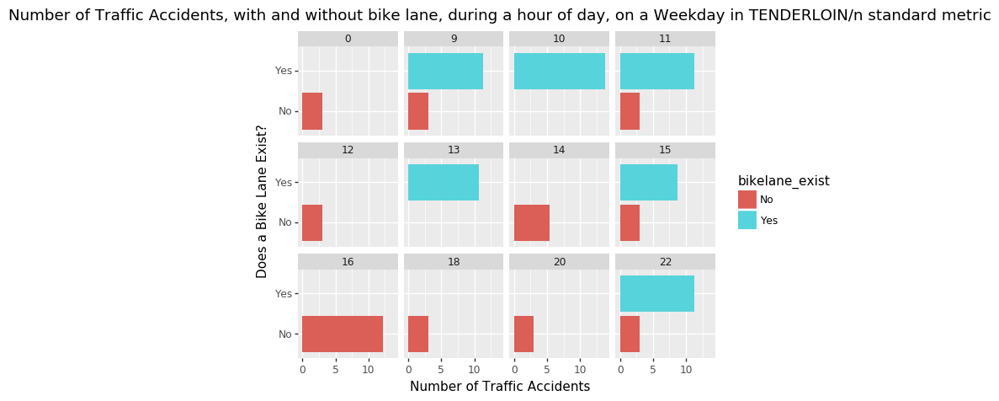

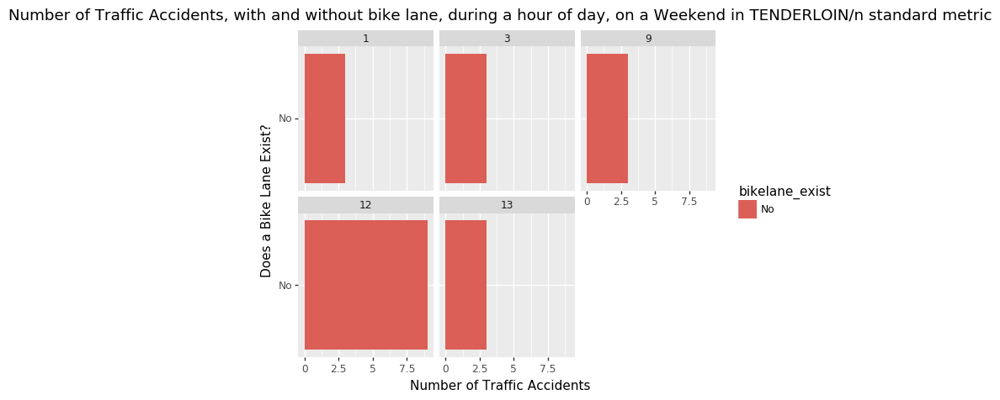

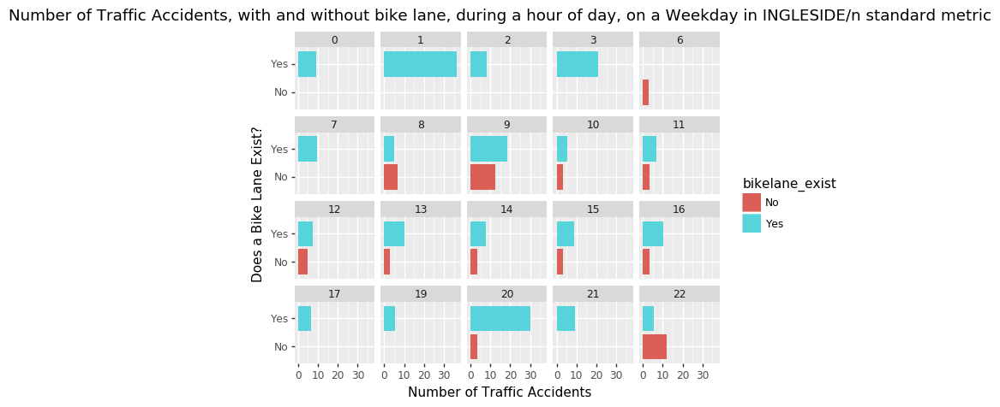

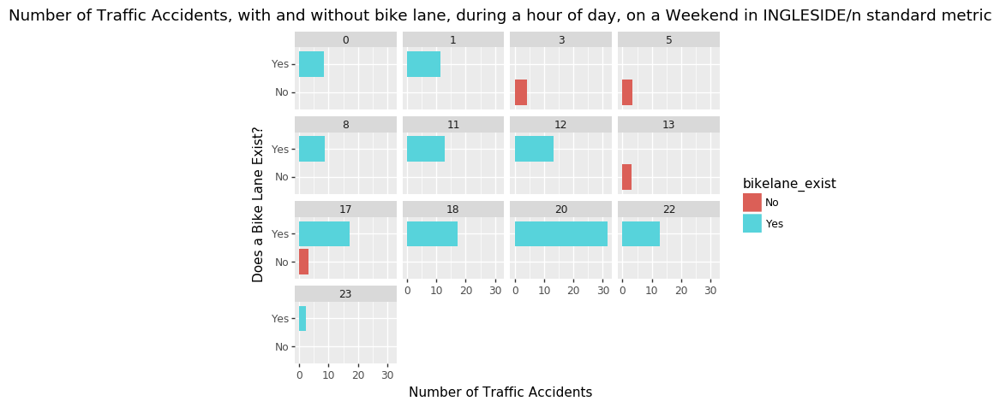

[<ggplot: (132387992889)>,
 <ggplot: (-9223371904479193123)>,
 <ggplot: (132373317601)>,
 <ggplot: (132372983311)>,
 <ggplot: (-9223371904481807686)>,
 <ggplot: (132388369051)>,
 <ggplot: (-9223371904481897910)>,
 <ggplot: (-9223371904481458337)>,
 <ggplot: (132372485910)>,
 <ggplot: (132373590280)>,
 <ggplot: (-9223371904481751022)>,
 <ggplot: (-9223371904481446975)>,
 <ggplot: (-9223371904480603718)>,
 <ggplot: (132372486008)>,
 <ggplot: (132372176048)>,
 <ggplot: (-9223371904479187866)>,
 <ggplot: (132373471173)>,
 <ggplot: (132372690710)>,
 <ggplot: (-9223371904481546415)>,
 <ggplot: (132372486057)>]

In [599]:
accidentsby_ifhour_bikelane_day_district_plots_std

## Bike Lane Length over the years

For historical context, how have the number of bike lanes increased over the years?

In [153]:
bikelanes_peryear = bikeway_map3.groupby(['install_yr']).sum()['length'].reset_index()
bikelanes_peryear.columns = ['year', 'len_bikelane_installed']
bikelanes_peryear['len_bikelane_network'] = bikelanes_peryear['len_bikelane_installed'].cumsum()

# drop first and last row - year is '0' (before 1971) and last being year 2018 which doesn't have all the datapoints, unless it was a slow year for bike lanes
bikelanes_peryear = bikelanes_peryear.drop([(bikelanes_peryear.shape[0]-1), 0], axis = 0).reset_index(drop = True)

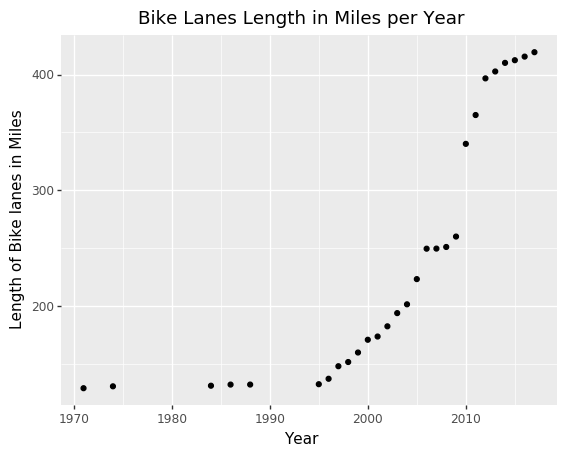

<ggplot: (188934435599)>

In [154]:
(ggplot(bikelanes_peryear, aes( x='year', y = 'len_bikelane_network')) + geom_point()
 + labs(title=('Bike Lanes Length in Miles per Year'), x='Year', y='Length of Bike lanes in Miles'))

Some years are skipped due to lack of installations in that year (we can add them later). We see that they have increased dramatically between 2000 and 2018. There's definitely a correlation between bike lane installations and accidents. Let's consider putting bike lane network miles as a control for the entire dataset

### What I'm using for the flask app!

In [84]:
traffic_reports_and_bikelanes3.to_csv( 'BikewayNetwork_edit/accidents_bikelanes_roads_wlengths.csv')

In [73]:
daysofweek_array = np.array(set(traffic_reports_and_bikelanes3.DayOfWeek )).tolist()
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes3.groupby(['cnn_of_road' ,'globalid','hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday', 'road_length', 'bikelane_length_haver'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [74]:
accidentsby_ifhour_bikelane.traffic_accidents.value_counts()

1    842
2     11
3      3
4      2
Name: traffic_accidents, dtype: int64

In [85]:
accidentsby_ifhour_bikelane2 = accidentsby_ifhour_bikelane.groupby(['hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday'], as_index = False)['traffic_accidents', 'road_length', 'bikelane_length_haver'].sum().sort_values( by = ['bikelane_exist', 'hour', 'DayOfWeek'])

In [86]:
def calc_standard( row ):
    if row['bikelane_exist'] == "No":
        return (row['traffic_accidents']/row['road_length'] )
    else:
        return (row['traffic_accidents'] /row['bikelane_length_haver'])


In [87]:
accidentsby_ifhour_bikelane2['standardized_metric'] = accidentsby_ifhour_bikelane2.apply( lambda x: calc_standard(x) , axis = 1)

In [88]:
accidents_hour_bikelane_day_graphs_std =[]

for i in set(accidentsby_ifhour_bikelane2.isWeekday):
    accidents_hour_bikelane_day2 = accidentsby_ifhour_bikelane2.loc[traffic_reports_and_bikelanes.isWeekday == i, ['bikelane_exist', 'hour', 'standardized_metric']]
    accidents_hour_bikelane_day_graphs_std.append((ggplot(accidents_hour_bikelane_day2, aes(x='bikelane_exist', y = 'standardized_metric'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, time of day on ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)

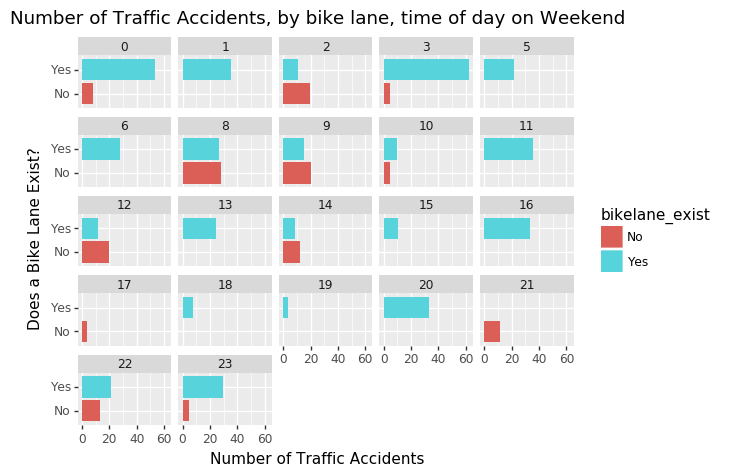

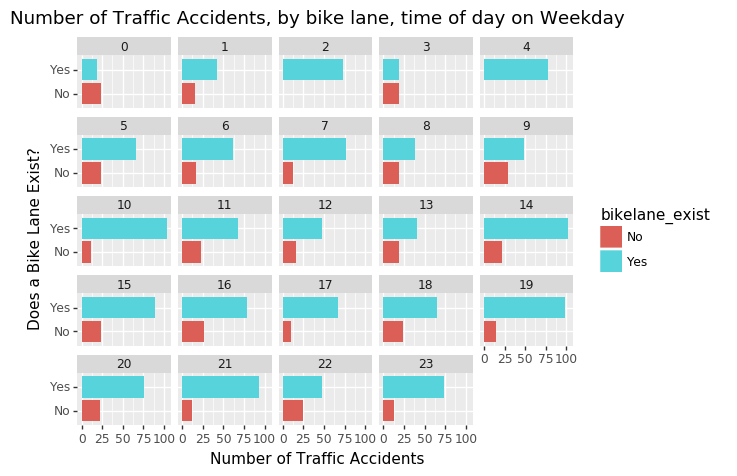

[<ggplot: (168674888491)>, <ggplot: (-9223371868179891810)>]

In [89]:
accidents_hour_bikelane_day_graphs_std

In [ ]:
select accidents_where

## Bike lanes vs Roads vs Accidents Map

Lanebreach at Code4SF is working on something more detailed than dynamic than this. However in the mean time, this was pretty interesting to learn to use matplotlib

In [23]:
traffic_reports_and_bikelanes['point'] = [Point(xy) for xy in zip(traffic_reports_and_bikelanes.X, traffic_reports_and_bikelanes.Y)]

In [24]:
traffic_reports_map = gpd.GeoDataFrame( \
    traffic_reports_and_bikelanes[ ['X', 'Y', 'Category', 'Descript', 'DayOfWeek', 'accident_year', 'bikelane_exist'] ],  \
    geometry =  traffic_reports_and_bikelanes.point, crs = bikeway_map3.crs)

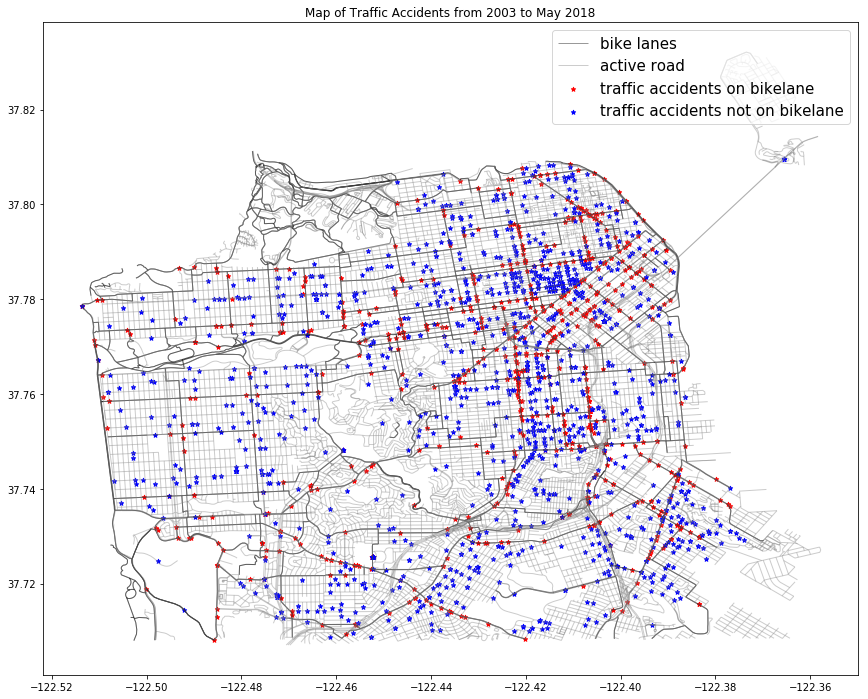

In [114]:
fig, ax=plt.subplots(figsize=(16,12))
#plt.xticks(traffic_reports_by_year['accident_year'], fontsize=10, rotation=30, ha='center', va='top')

bikeway_map3.geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4, label = 'bike lanes') #
total_map.geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'grey', alpha = 0.4, label = 'active road') #

#bikeway_map3.loc[bikeway_map3.symbology == 'BIKE LANE', ].geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4) #
#bikeway_map3.loc[bikeway_map3.symbology == 'BIKE PATH', ].geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4) #
traffic_reports_map.loc[traffic_reports_map['bikelane_exist'] == True, ].plot( ax = ax,marker = '*',markersize = 20, color = 'red', label = "traffic accidents on bikelane")
traffic_reports_map.loc[traffic_reports_map['bikelane_exist'] == False, ].plot( ax = ax,marker = '*',markersize = 20, color = 'blue', label = "traffic accidents not on bikelane")

plt.legend(prop={'size':15})
plt.title('Map of Traffic Accidents from 2003 to May 2018')
plt.show()

Let create a chart of number of traffic accidents per year, on or not on a bike lane

In [32]:
traffic_reports_by_year2 = traffic_reports_and_bikelanes.groupby(['accident_year', 'bikelane_exist'], as_index = False)['Category'].count()
#drop 2018 point
#traffic_reports_by_year = traffic_reports_by_year.drop([(traffic_reports_by_year.shape[0]-1)], axis = 0)
traffic_reports_by_year2.rename(columns={'Category': 'accident_counts'}, inplace=True)
traffic_reports_by_year2 = traffic_reports_by_year2.reset_index( drop = True) #traffic_reports_and_bikelanes

# drop 2018 since traffic accident dataset only goes til May 2018
traffic_reports_by_year2.drop( traffic_reports_by_year2.loc[ traffic_reports_by_year2.accident_year == 2018 ].index , inplace = True)

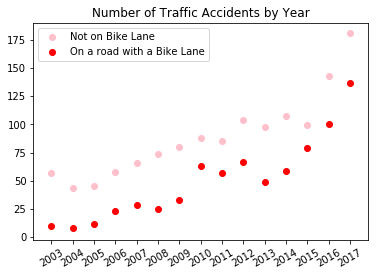

In [33]:
plt.scatter(traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == False), 'accident_year'], traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == False),'accident_counts'], label ='Not on Bike Lane', color = 'pink' )
plt.scatter(traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == True), 'accident_year'], traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == True),'accident_counts'], label ='On a road with a Bike Lane', color = 'red')
plt.title( ("Number of Traffic Accidents by Year"))
plt.legend()
plt.xticks(np.unique(traffic_reports_by_year2['accident_year']), fontsize=10, rotation=30, ha='center', va='top')
    #fig.set_size_inches(18.5, 10.5, forward=True)a
    #plt.xticks(ticks=np.arange(0, 440/57.2985, 90/57.2985), fontsize=12, rotation=30, ha='center', va='top')  # 1 radian = 57.2985 degrees
plt.show()

Trend of more accidents without a bike lane than with a bike lane, per year

Let's see what happens when we look at this data by neighborhood

In [24]:
traffic_reports_by_year = traffic_reports_and_bikelanes.groupby(['accident_year', 'bikelane_exist', 'PdDistrict'], as_index = False)['Category'].count()
#drop 2018 point
#traffic_reports_by_year = traffic_reports_by_year.drop([(traffic_reports_by_year.shape[0]-1)], axis = 0)
traffic_reports_by_year.rename(columns={'Category': 'accident_counts'}, inplace=True)
traffic_reports_by_year = traffic_reports_by_year.reset_index( drop = True) #traffic_reports_and_bikelanes

# drop 2018 since traffic accident dataset only goes til May 2018
traffic_reports_by_year.drop( traffic_reports_by_year.loc[ traffic_reports_by_year.accident_year == 2018 ].index , inplace = True)

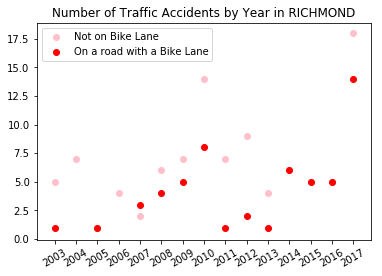

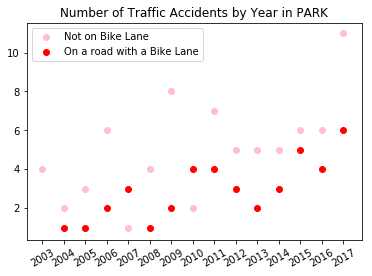

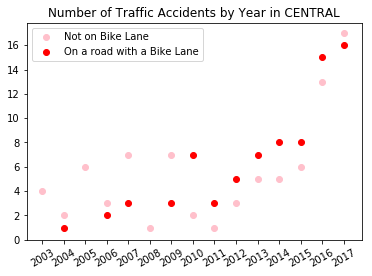

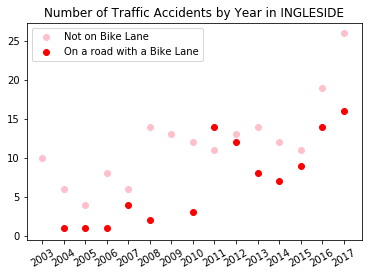

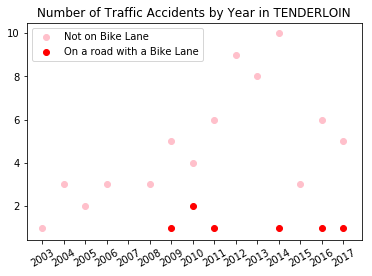

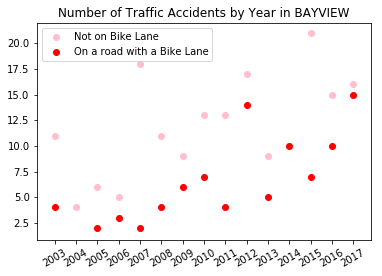

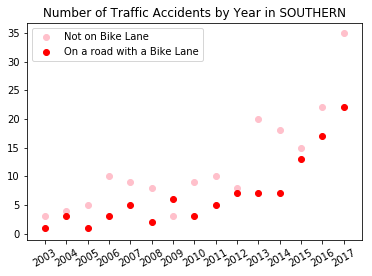

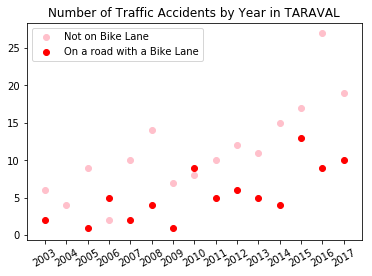

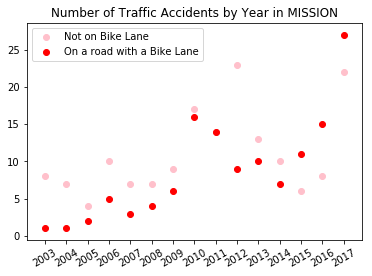

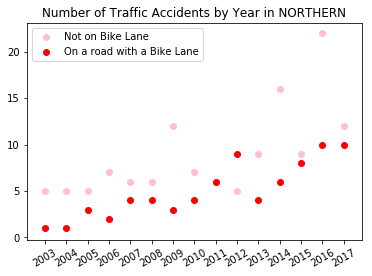

In [25]:
for i in set(traffic_reports_by_year.PdDistrict.tolist()):
    plt.scatter(traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == False) & (traffic_reports_by_year.PdDistrict == i), 'accident_year'], traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == False) & (traffic_reports_by_year.PdDistrict == i),'accident_counts'], label ='Not on Bike Lane', color = 'pink' )
    plt.scatter(traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == True) & (traffic_reports_by_year.PdDistrict == i), 'accident_year'], traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == True) & (traffic_reports_by_year.PdDistrict == i),'accident_counts'], label ='On a road with a Bike Lane', color = 'red')
    plt.title( ("Number of Traffic Accidents by Year in "+ i))
    plt.legend()
    plt.xticks(np.unique(traffic_reports_by_year['accident_year']), fontsize=10, rotation=30, ha='center', va='top')
    #fig.set_size_inches(18.5, 10.5, forward=True)a
    #plt.xticks(ticks=np.arange(0, 440/57.2985, 90/57.2985), fontsize=12, rotation=30, ha='center', va='top')  # 1 radian = 57.2985 degrees
    plt.show()

Traffic accidents are clearly going up over the years for all locations. Differences between effects of a bike lane vs without bike lane are lower in Mission than in Tenderloin. But this could be a function of the fact that some places have more bike lanes than other places.

I think it would be helpful to look at the ratio of accidents to bike lanes lengths vs the ratio of accidents to roads (without bike lanes lengths), per neighborhood.

## Let's see if there looks like there is a trend between number of accidents and bike lane type

This isn't a regression but it looks like there are a lot more accidents on a bike lane and bike path, because there are more of this type of lane

In [557]:
traffic_reports_and_bikelanes['Time'] = pd.to_datetime(traffic_reports_and_bikelanes['Time'])
traffic_reports_and_bikelanes['hour'] = traffic_reports_and_bikelanes['Time'].apply(lambda x: x.hour)

In [150]:
# figure out how much each bike lane type covers sf in miles
symbology_lengths = pd.merge( bikeway_map3.groupby('symbology')['length'].sum().reset_index(), traffic_reports_and_bikelanes.symbology.value_counts().reset_index(), how = 'left', right_on = "index", left_on = "symbology", sort = False)
symbology_lengths.drop( 'index', axis = 1, inplace = True)
symbology_lengths.columns =  ['symbology', 'length_mi', 'accident_counts']
symbology_lengths['length_percent'] = symbology_lengths.length_mi / np.sum(symbology_lengths.length_mi)

# text formatting for chart - very imp to point this out!
symbology_lengths['length_percent_str'] = (np.round(symbology_lengths['length_percent']*100).astype(str)  + "%").tolist()
symbology_lengths['x_index'] = symbology_lengths.symbology + " (" + symbology_lengths.length_percent_str + ")"

C:\Anaconda3\lib\site-packages\plotnine\layer.py:430: UserWarning: position_stack : Removed 1 rows containing missing values.
  data = self.position.setup_data(self.data, params)


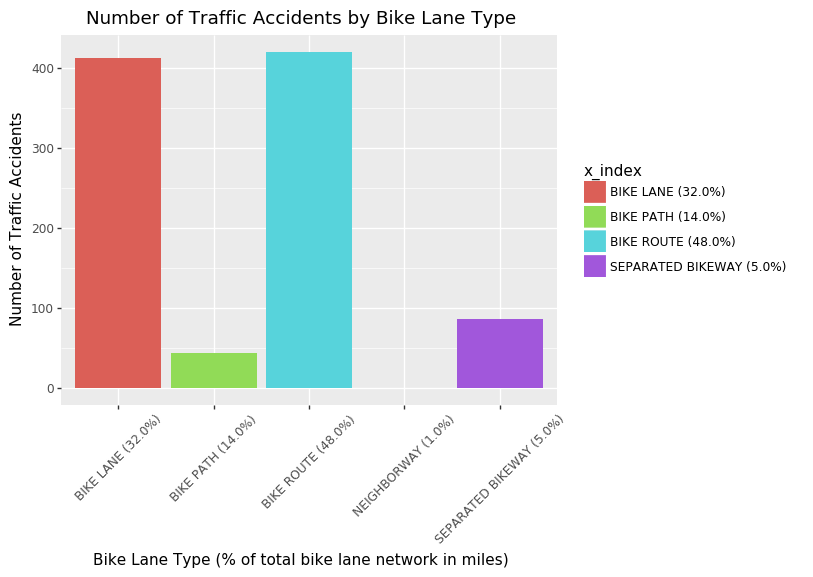

<ggplot: (-9223371905425364939)>

In [36]:
(ggplot(symbology_lengths, aes(x ='x_index', y='accident_counts', fill = 'x_index'))
 + geom_bar( stat='identity') + theme(axis_text_x = element_text(angle=45) )
    + labs(title=('Number of Traffic Accidents by Bike Lane Type'), x='Bike Lane Type (% of total bike lane network in miles)', y='Number of Traffic Accidents'))

## Let's see if there's a trend between accidents and neighborhood

In [ ]:
'cnn_of_road' ,'globalid','hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday', 'road_length', 'bikelane_length_haver'

In [103]:
traffic_reports_and_bikelanes.columns

Index(['Unnamed: 0', 'IncidntNum', 'Category', 'Descript', 'DayOfWeek', 'Date',
       'Time', 'PdDistrict', 'Resolution', 'Address', 'X', 'Y', 'Location',
       'PdId', 'accident_year', 'globalid', 'bikelane_exist',
       'install_yr_accid', 'barrier', 'biap', 'buffered', 'cnn', 'contraflow',
       'date_creat', 'time_creat', 'created_us', 'dir', 'direct', 'double',
       'facility_t', 'from_st', 'fy', 'greenwave', 'install_mo',
       'install_yr_bikelane', 'date_last_', 'time_last_', 'last_edite',
       'length', 'notes', 'number', 'objectid', 'qtr', 'raised', 'shape_len',
       'sharrow', 'sm_sweeper', 'street', 'streetname', 'surface_tr',
       'symbology', 'to_st', 'update_mo', 'update_yr', 'censusbloc',
       'geometry', '_merge', 'bikelane_installdate', 'isWeekday'],
      dtype='object')

In [111]:
accident_counts_bydistrict_bikelane_exist = traffic_reports_and_bikelanes3.groupby(['bikelane_exist', 'PdDistrict', 'accident_year', 'cnn_of_road', 'globalid', 'road_length', 'bikelane_length_haver']).agg({'Category':'count'}).reset_index()

accident_counts_bydistrict_bikelane_exist.rename( columns = {'Category': 'accident_counts'}, inplace = True)
accident_counts_bydistrict_bikelane_exist = accident_counts_bydistrict_bikelane_exist.groupby( ['bikelane_exist', 'PdDistrict', 'accident_year'], as_index = False)['accident_counts','road_length', 'bikelane_length_haver'].sum()

#accident_counts_bydistrict = traffic_reports_and_bikelanes.groupby([ 'PdDistrict']).count()['Category'].reset_index()
#accident_counts_bydistrict.rename( columns = {'Category': 'accident_counts'}, inplace = True)


In [114]:
def calc_standard( row ):
    if row['bikelane_exist'] == "No":
        return (row['accident_counts']/row['road_length'] )
    else:
        return (row['accident_counts'] /row['bikelane_length_haver'])

In [115]:
accident_counts_bydistrict_bikelane_exist['std_metric'] = accident_counts_bydistrict_bikelane_exist.apply(calc_standard, axis = 1)

In [129]:
num_traffic_neighborhood = (ggplot(accident_counts_bydistrict_bikelane_exist.loc[ 'accident_year' , ], aes(x ='PdDistrict', y='std_metric', fill = 'bikelane_exist'))
 + geom_bar( stat='identity', position='dodge', show_legend=True) + theme(axis_text_x = element_text(angle=45)) + \
                            labs(title=('Number of Traffic Accidents per meter of road by Neighborhood'), x='Neighborhood', y='Number of Traffic Accidents', fill = "Does the road have Bike Lanes?") \
                           )

C:\Anaconda3\lib\site-packages\plotnine\guides\guides.py:198: UserWarning: Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it
  "variable to it".format(output))


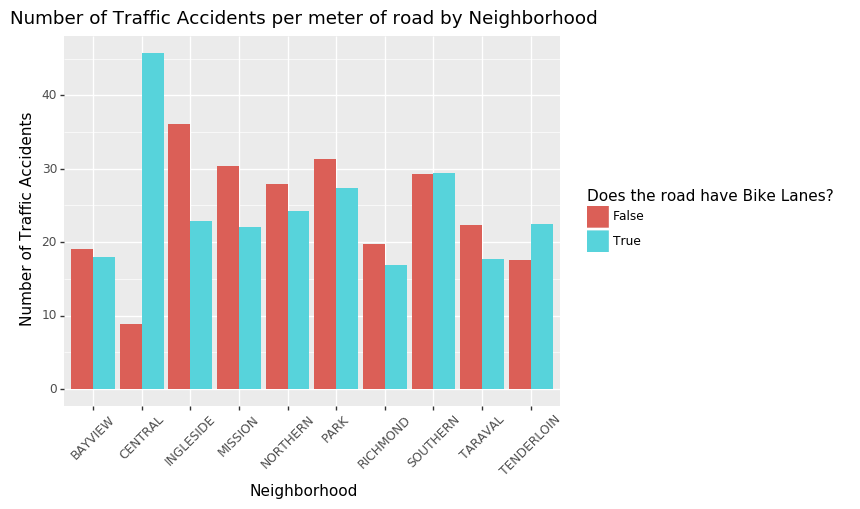

<ggplot: (-9223371868163444536)>

In [130]:
num_traffic_neighborhood

We are also not really accounting for size of the neighborhood here (in terms of road ways!) It would be helpful to have data on the road way map size per neighborhood?

## Accidents by Hour, district, weekday vs weekend

Now, let's look at number of accidents by hour of the day

In [564]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'PdDistrict', 'Day', ''], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

.6% of roads are bikeways 

In [565]:
accidentsby_byhour = accidentsby_ifhour_bikelane.groupby('hour').sum()['traffic_accidents'].reset_index()

In [566]:
num_traffic_accidents_hour = (ggplot(accidentsby_byhour, aes(x = 'hour', y = 'traffic_accidents')) + geom_bar(stat= 'identity')
 + labs(title=('Number of Traffic Accidents by Time of Day'), x='Time (24:00 format)', y='Number of Traffic Accidents'))

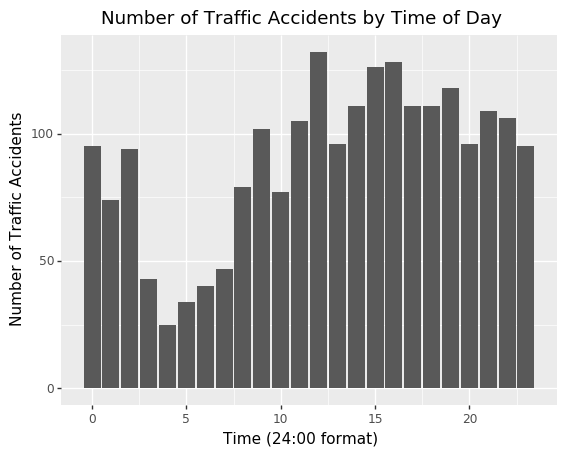

<ggplot: (-9223371904483382826)>

In [567]:
num_traffic_accidents_hour

## Accidents by Hour

Now, let's look at number of accidents by hour of the day

In [564]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

.6% of roads are bikeways 

In [565]:
accidentsby_byhour = accidentsby_ifhour_bikelane.groupby('hour').sum()['traffic_accidents'].reset_index()

In [566]:
num_traffic_accidents_hour = (ggplot(accidentsby_byhour, aes(x = 'hour', y = 'traffic_accidents')) + geom_bar(stat= 'identity')
 + labs(title=('Number of Traffic Accidents by Time of Day'), x='Time (24:00 format)', y='Number of Traffic Accidents'))

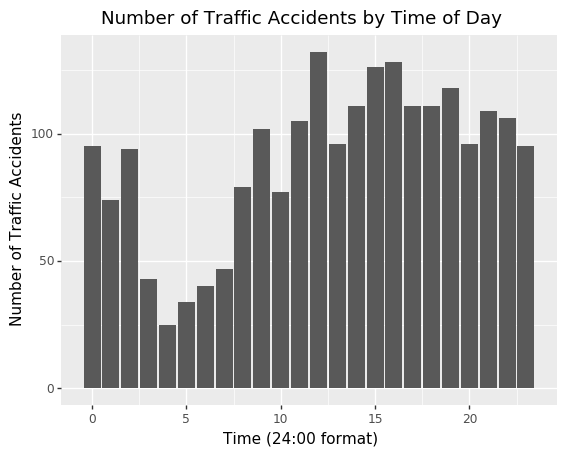

<ggplot: (-9223371904483382826)>

In [567]:
num_traffic_accidents_hour

ways graphic can be improved
- write number of accidents
- show entire bottom scale
- We're not 'controlling' for location, bike lane type, day of week, yaer

## Accidents by time of day, on and not on a bike lane

Let's attempt to control for traffic accidents per day of week

In [558]:
accidents_ifbikelane_hour = (ggplot(accidentsby_ifhour_bikelane, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
 + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
 + coord_flip()
 + facet_wrap('hour')
 + labs(title='Number of Traffic Accidents for Road with/w/o Bike Lane, Hour in Day', x='Does a Bike Lane Exist?', y='Number of Traffic Accidents')
)

# of course I'd like to convert the hour to AM/PM format

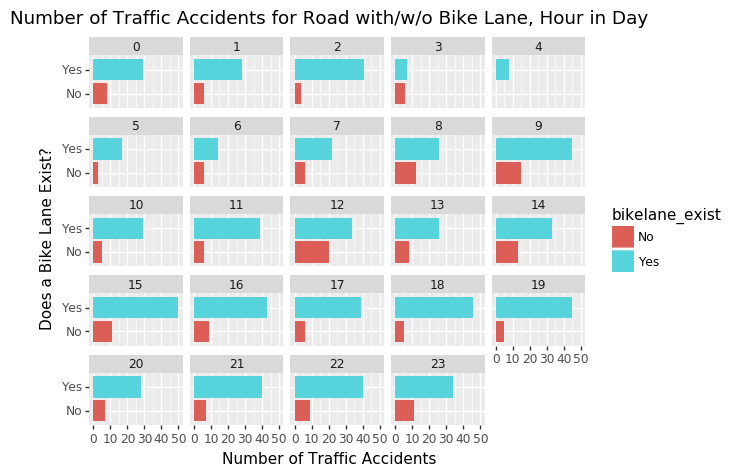

<ggplot: (-9223371904483376419)>

In [559]:
accidents_ifbikelane_hour

We see that there is a lot of difference in accidents when we include hour. If there were actually more counts of accidents per each hour in this dataset, I would definitely put a control for hour in the ultimate regression

It would be interesting to visualize this by day of week if there are differences?

In [561]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [562]:
daysofweek_array = np.array(set(traffic_reports_and_bikelanes.DayOfWeek )).tolist()

## Accidents by time of day, week day vs weekend vs whether or not bike lane exists 

Accidents conditional on varying time of day, weekday vs weekend, and whether or not bike lane exists

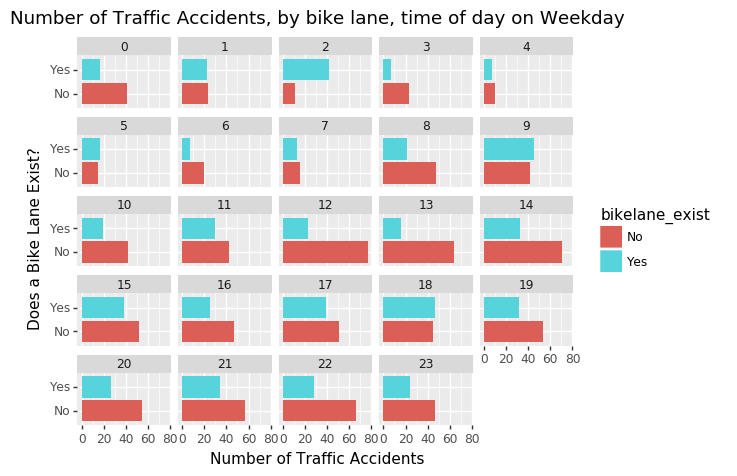

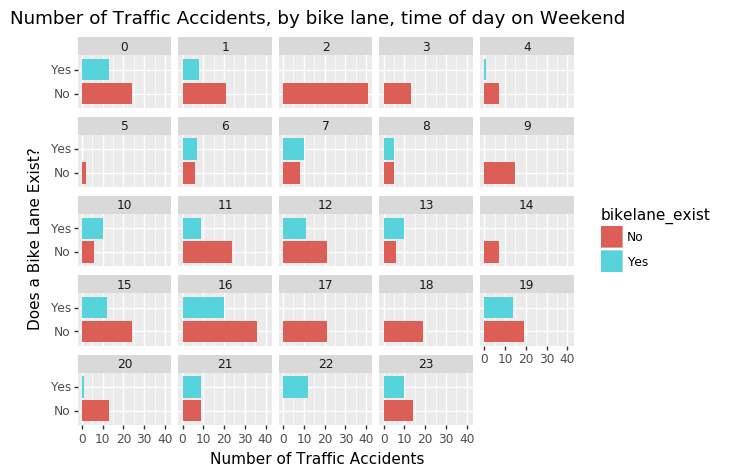

[<ggplot: (132372877523)>, <ggplot: (132371998847)>]

In [563]:
accidents_hour_bikelane_day_graphs = []

for i in set(accidentsby_ifhour_bikelane.isWeekday):
    accidents_hour_bikelane_day = accidentsby_ifhour_bikelane.loc[traffic_reports_and_bikelanes.isWeekday == i]
    accidents_hour_bikelane_day_graphs.append((ggplot(accidents_hour_bikelane_day, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, time of day on ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)
    
accidents_hour_bikelane_day_graphs

## Accidents conditional on varying time of day, day of week, and whether or not bike lane exists

In [249]:
for i in daysofweek_array:
    accidents_hour_bikelane_day = accidentsby_ifhour_bikelane.loc[traffic_reports_and_bikelanes.DayOfWeek == i]
    print((ggplot(accidents_hour_bikelane_day, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, during hour of day on a ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)

NameError: name 'accidentsby_ifhour_bikelane' is not defined

## Accidents conditional on varying time of day, day of week, neighborhood, and whether or not bike lane exists

In [596]:
accidentsby_ifhour_bikelane_day_district = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'isWeekday', 'PdDistrict'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane_day_district = accidentsby_ifhour_bikelane_day_district.reset_index(drop = True)
accidentsby_ifhour_bikelane_day_district.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane_day_district.bikelane_exist = accidentsby_ifhour_bikelane_day_district.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [597]:
accidentsby_ifhour_bikelane_day_district_plots = []

for i in (set(accidentsby_ifhour_bikelane_day_district.isWeekday)):
    for j in set( traffic_reports_and_bikelanes.PdDistrict):
        df_hold2 = accidentsby_ifhour_bikelane_day_district.loc[((accidentsby_ifhour_bikelane_day_district.isWeekday == i) & (accidentsby_ifhour_bikelane_day_district.PdDistrict == j))]
        accidentsby_ifhour_bikelane_day_district_plots.append((ggplot(df_hold2, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
         + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
         + coord_flip()
         + facet_wrap('hour')
         + labs(title=('Number of Traffic Accidents, with and without bike lane, during a hour of day, on a ' + i + ' in ' + j), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
        )

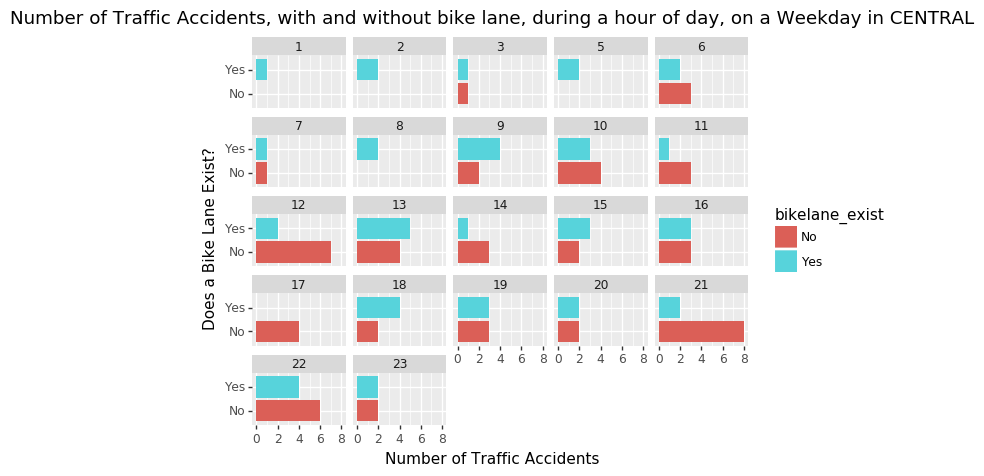

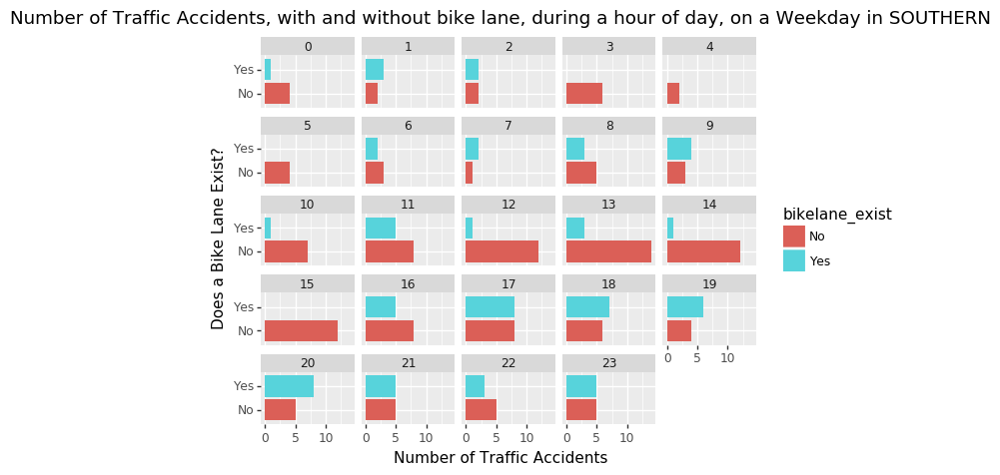

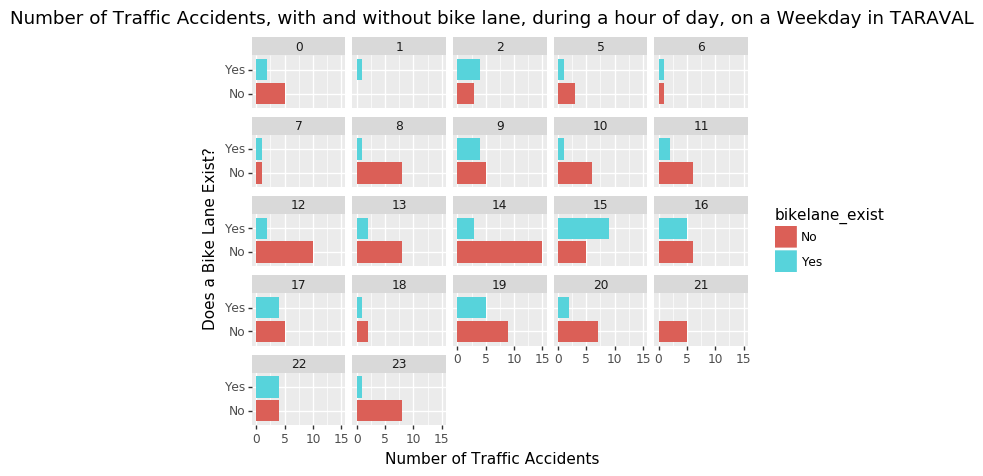

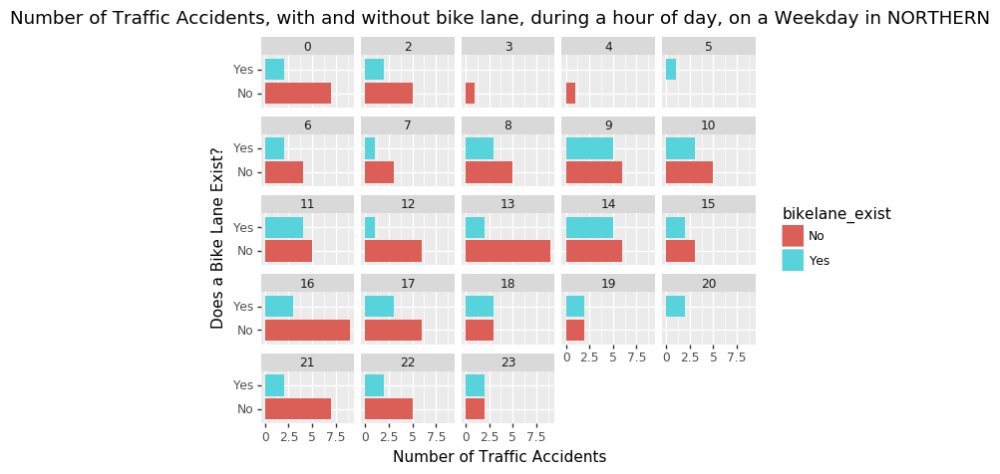

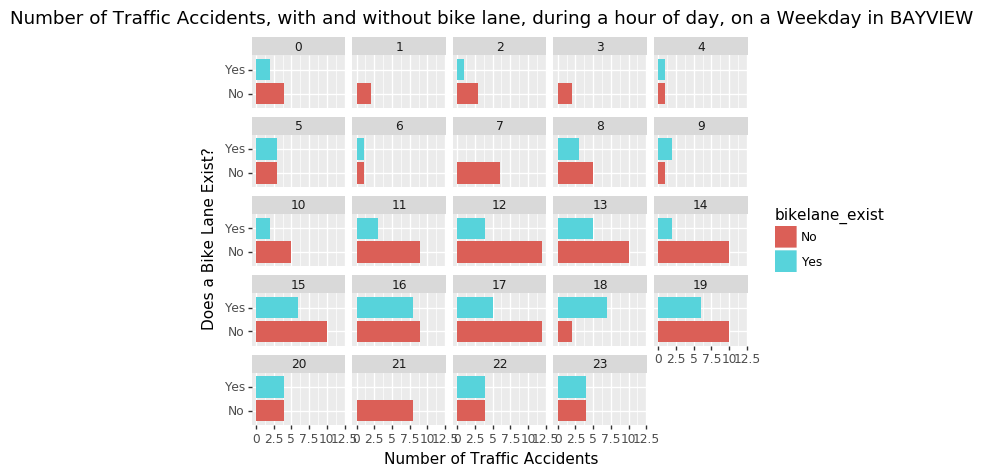

...

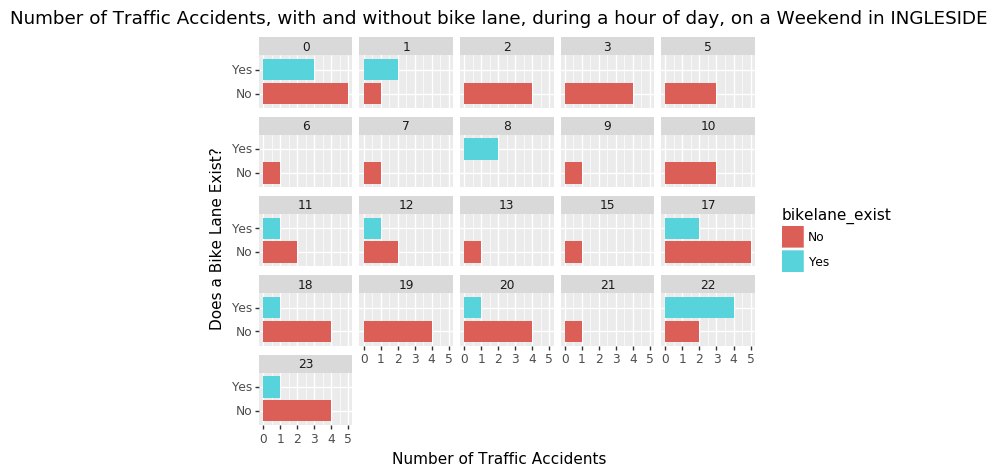

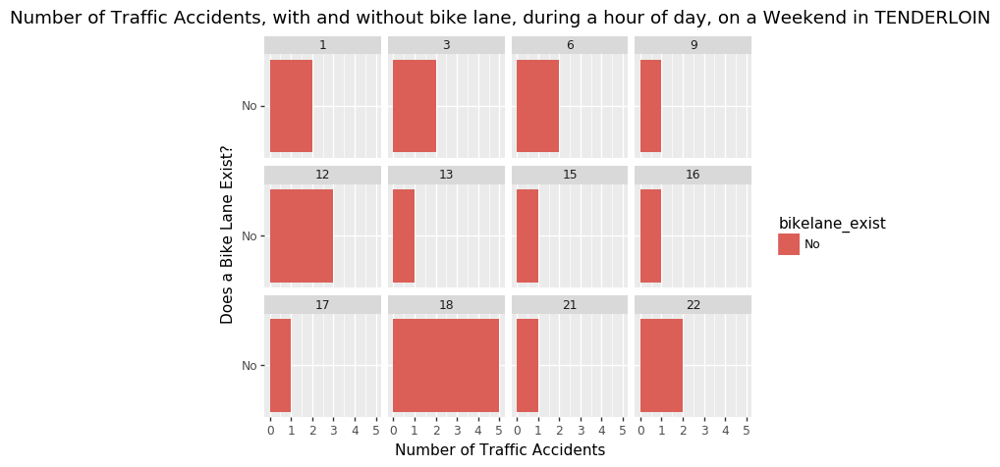

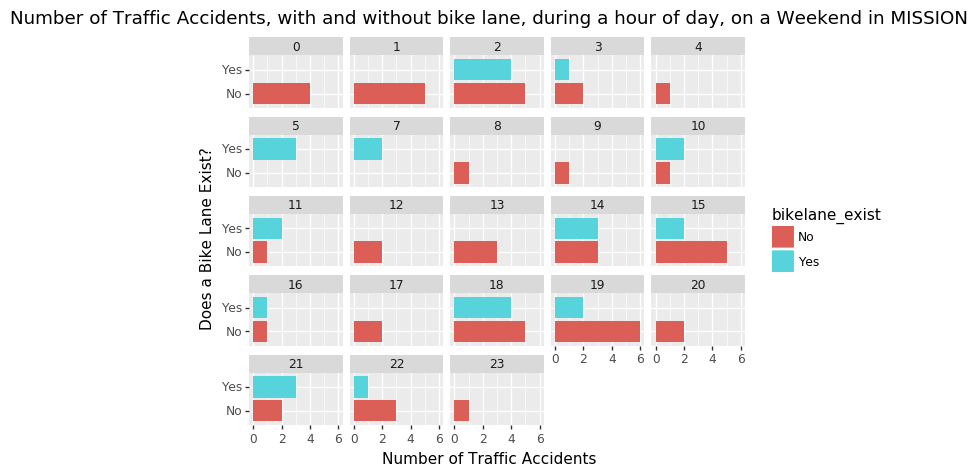

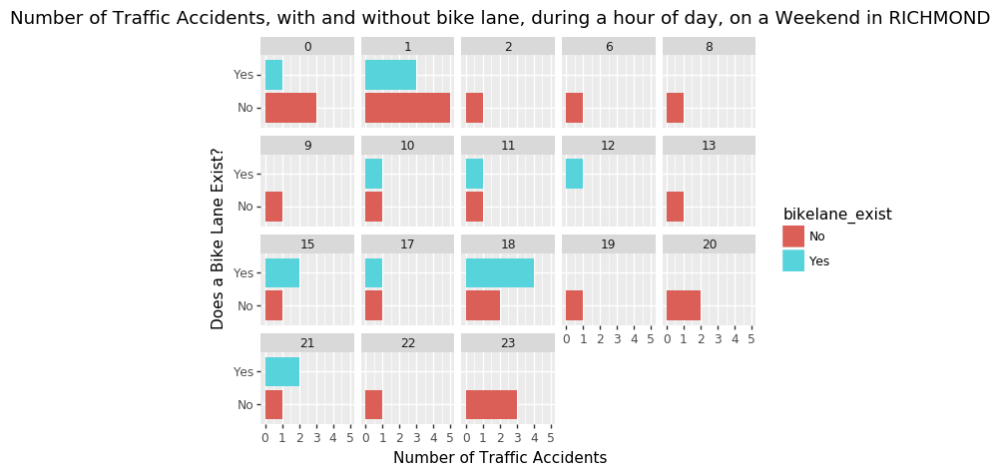

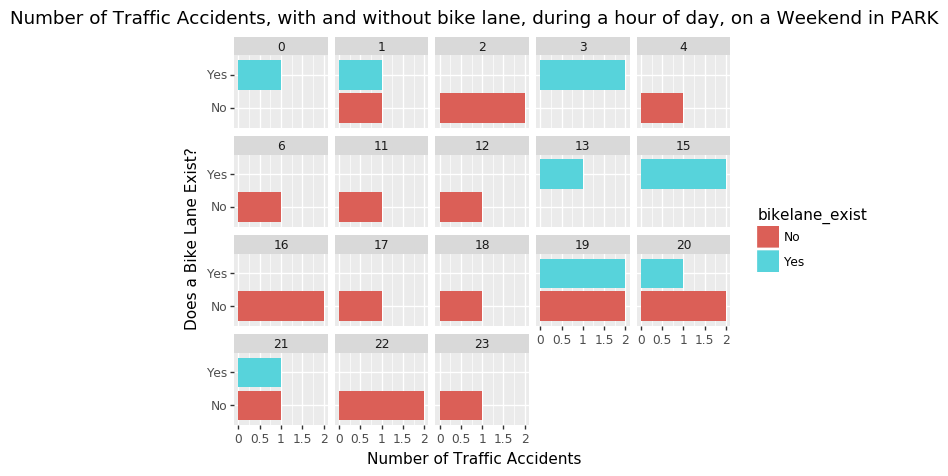

[<ggplot: (-9223371847919354024)>,
 <ggplot: (188934633259)>,
 <ggplot: (-9223371847920142476)>,
 <ggplot: (-9223371847919335182)>,
 <ggplot: (188935072639)>,
 <ggplot: (-9223371847919703096)>,
 <ggplot: (-9223371847920166901)>,
 <ggplot: (188950917503)>,
 <ggplot: (188934768669)>,
 <ggplot: (188935440525)>,
 <ggplot: (188951006377)>,
 <ggplot: (188951328874)>,
 <ggplot: (-9223371847919687750)>,
 <ggplot: (-9223371847920230719)>,
 <ggplot: (188934639375)>,
 <ggplot: (188935072765)>,
 <ggplot: (-9223371847918951164)>,
 <ggplot: (-9223371847920016864)>,
 <ggplot: (-9223371847919356542)>,
 <ggplot: (188935353871)>]

In [271]:
accidentsby_ifhour_bikelane_day_district_plots

## By neighborhood - Standardized Metric

In [582]:
accidentsby_ifhour_bikelane_day_district_std = traffic_reports_and_bikelanes3.groupby(['hour', 'bikelane_exist', 'isWeekday', 'PdDistrict','cnn_road','globalid', 'road_length', 'bikelane_length_haver'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane_day_district_std = accidentsby_ifhour_bikelane_day_district_std.reset_index(drop = True)
accidentsby_ifhour_bikelane_day_district_std.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane_day_district_std.bikelane_exist = accidentsby_ifhour_bikelane_day_district_std.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [583]:
# sum road length, bike lane length, traffic accident numbers by categories in question
accidentsby_ifhour_bikelane_day_district_std2 = accidentsby_ifhour_bikelane_day_district_std.groupby( ['hour', 'bikelane_exist', 'isWeekday', 'PdDistrict'], as_index=False)['traffic_accidents', 'road_length', 'bikelane_length_haver'].sum().sort_values( by =['bikelane_exist', 'hour'] )

In [ ]:
# sum road length, bike lane length, traffic accident numbers by categories in question
accidentsby_ifhour_bikelane_day_district_std2 = accidentsby_ifhour_bikelane_day_district_std.groupby( ['hour', 'bikelane_exist', 'isWeekday', 'PdDistrict'], as_index=False)['traffic_accidents', 'road_length', 'bikelane_length_haver'].sum().sort_values( by =['bikelane_exist', 'hour'] )

accidentsby_ifhour_bikelane_day_district_std2['std_metric'] = accidentsby_ifhour_bikelane_day_district_std2.apply(calc_standard, axis = 1)

In [585]:
accidentsby_ifhour_bikelane_day_district_std2['std_metric'] = accidentsby_ifhour_bikelane_day_district_std2.apply(calc_standard, axis = 1)

In [598]:
accidentsby_ifhour_bikelane_day_district_plots_std = []

for j in (set(accidentsby_ifhour_bikelane_day_district_std2.PdDistrict)): #iterate over weekday vs 
    for i in set(accidentsby_ifhour_bikelane_day_district_std2.isWeekday ):
        df_hold2 = accidentsby_ifhour_bikelane_day_district_std2.loc[((accidentsby_ifhour_bikelane_day_district_std2.isWeekday == i) & (accidentsby_ifhour_bikelane_day_district_std2.PdDistrict == j))]
        accidentsby_ifhour_bikelane_day_district_plots_std.append((ggplot(df_hold2, aes(x='bikelane_exist', y = 'std_metric'))         # defining what data to use
         + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
         + coord_flip()
         + facet_wrap('hour')
         + labs(title=('Number of Traffic Accidents, with and without bike lane, during a hour of day, on a ' + i + ' in ' + j + '/n standard metric'), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
        )

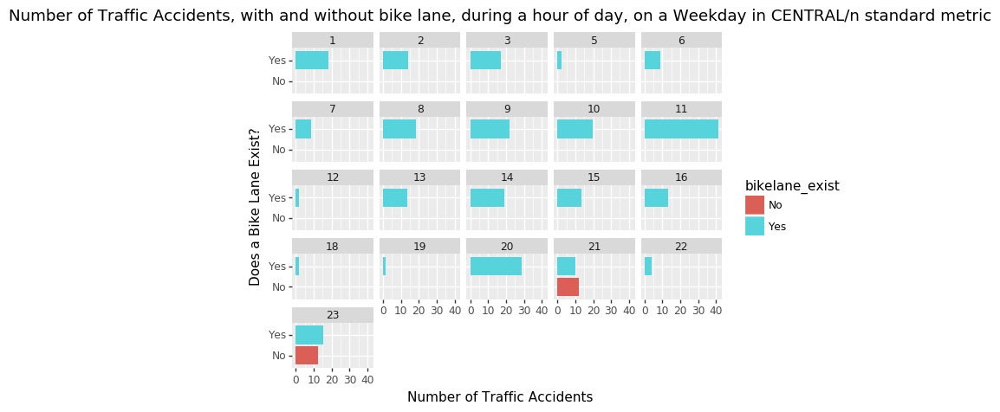

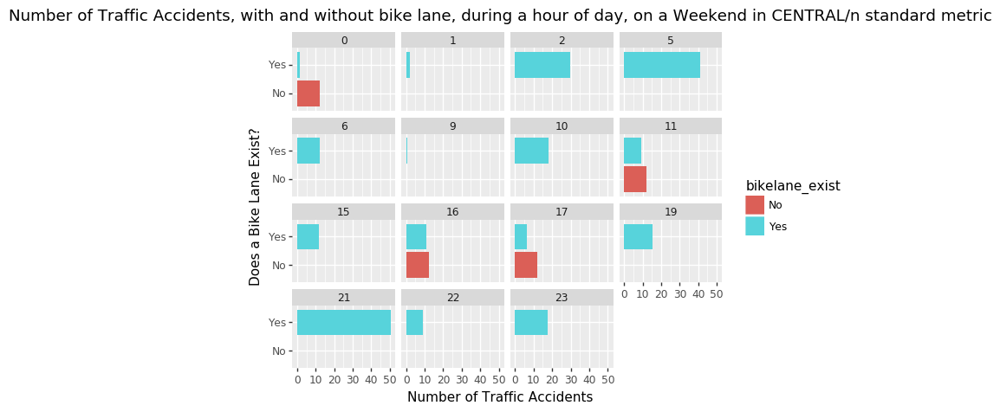

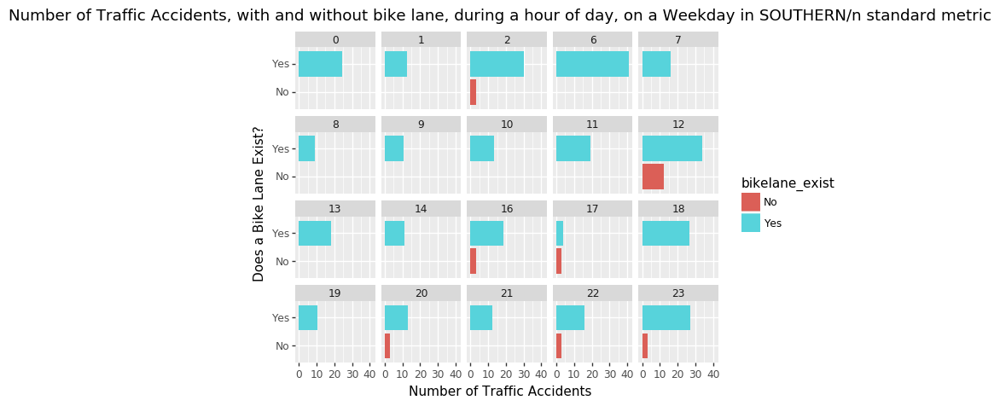

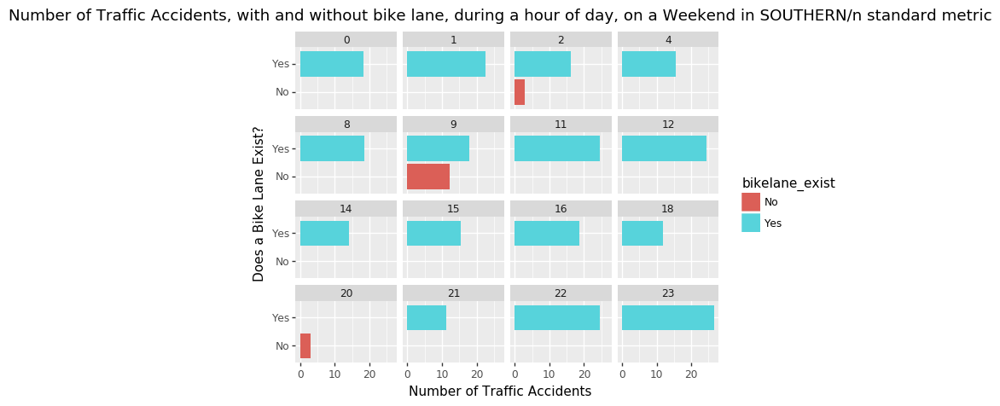

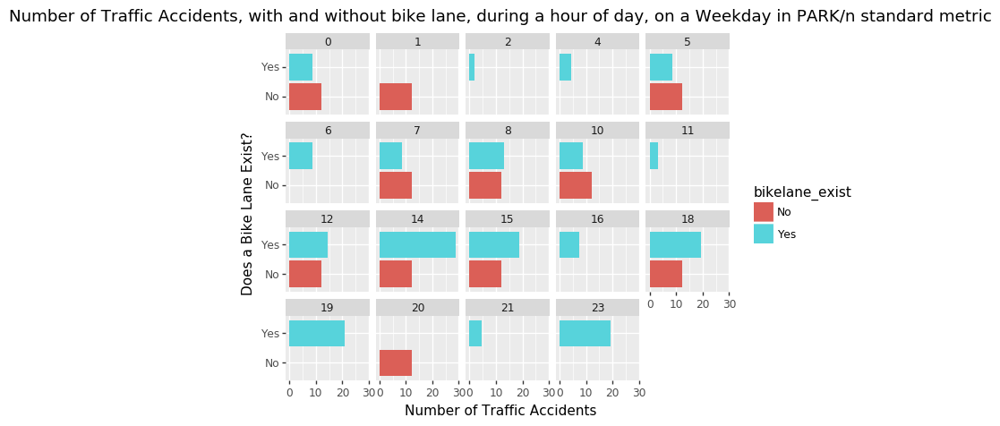

...

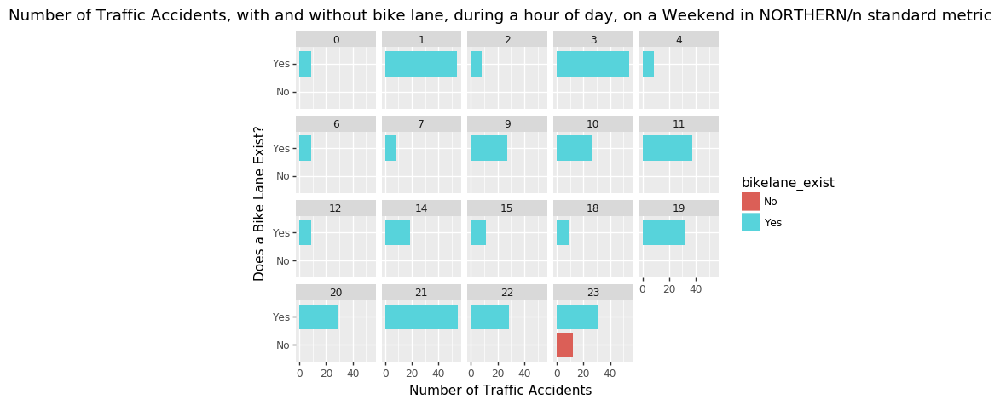

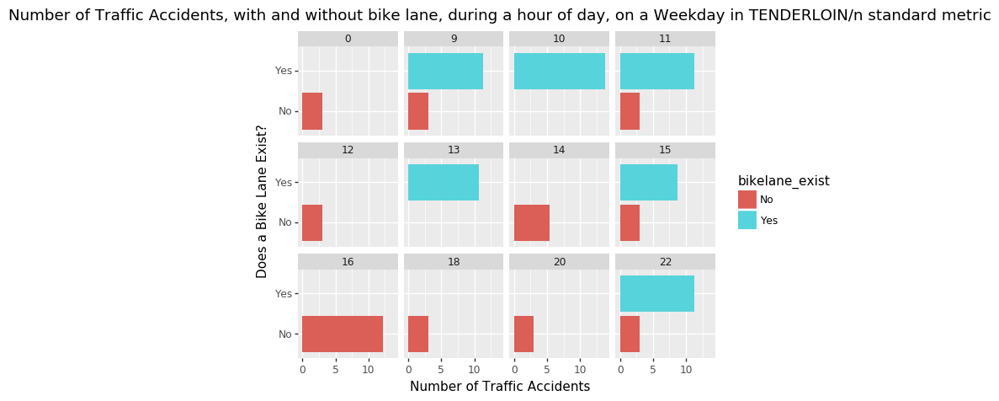

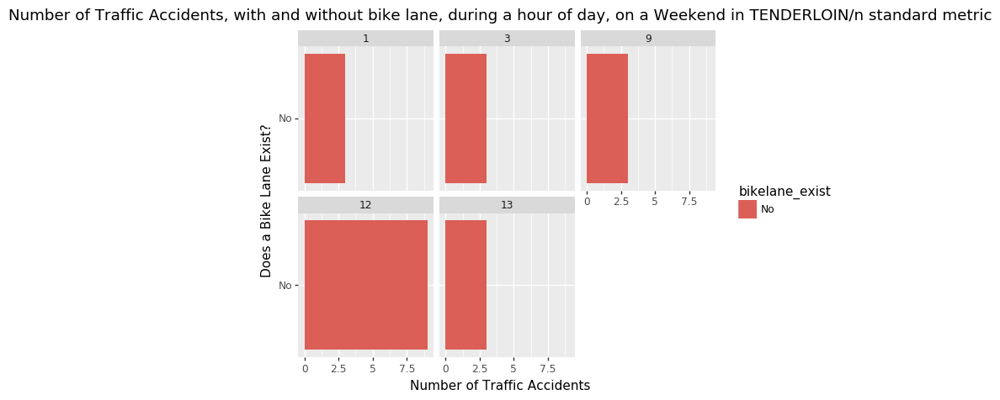

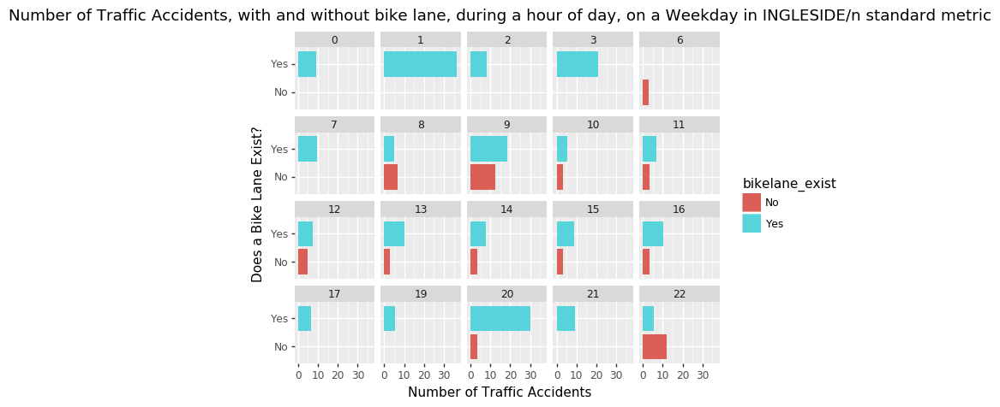

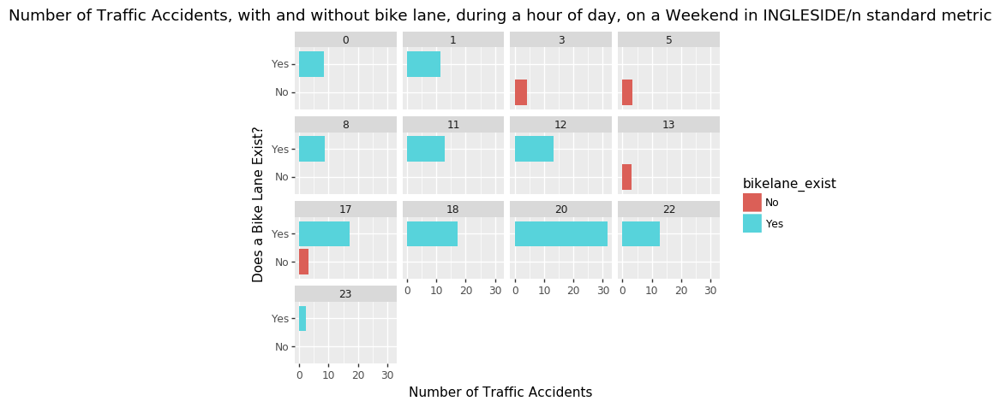

[<ggplot: (132387992889)>,
 <ggplot: (-9223371904479193123)>,
 <ggplot: (132373317601)>,
 <ggplot: (132372983311)>,
 <ggplot: (-9223371904481807686)>,
 <ggplot: (132388369051)>,
 <ggplot: (-9223371904481897910)>,
 <ggplot: (-9223371904481458337)>,
 <ggplot: (132372485910)>,
 <ggplot: (132373590280)>,
 <ggplot: (-9223371904481751022)>,
 <ggplot: (-9223371904481446975)>,
 <ggplot: (-9223371904480603718)>,
 <ggplot: (132372486008)>,
 <ggplot: (132372176048)>,
 <ggplot: (-9223371904479187866)>,
 <ggplot: (132373471173)>,
 <ggplot: (132372690710)>,
 <ggplot: (-9223371904481546415)>,
 <ggplot: (132372486057)>]

In [599]:
accidentsby_ifhour_bikelane_day_district_plots_std

## Bike Lane Length over the years

For historical context, how have the number of bike lanes increased over the years?

In [153]:
bikelanes_peryear = bikeway_map3.groupby(['install_yr']).sum()['length'].reset_index()
bikelanes_peryear.columns = ['year', 'len_bikelane_installed']
bikelanes_peryear['len_bikelane_network'] = bikelanes_peryear['len_bikelane_installed'].cumsum()

# drop first and last row - year is '0' (before 1971) and last being year 2018 which doesn't have all the datapoints, unless it was a slow year for bike lanes
bikelanes_peryear = bikelanes_peryear.drop([(bikelanes_peryear.shape[0]-1), 0], axis = 0).reset_index(drop = True)

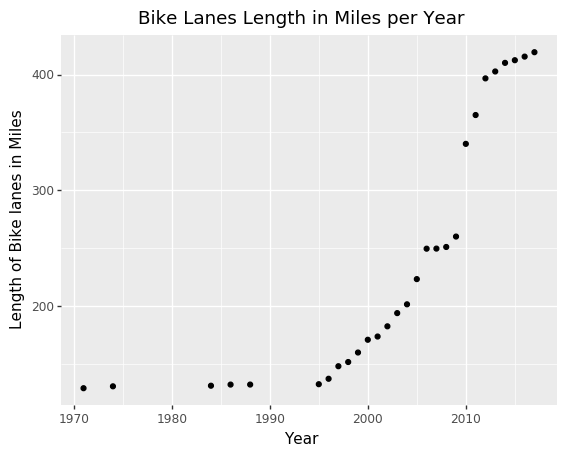

<ggplot: (188934435599)>

In [154]:
(ggplot(bikelanes_peryear, aes( x='year', y = 'len_bikelane_network')) + geom_point()
 + labs(title=('Bike Lanes Length in Miles per Year'), x='Year', y='Length of Bike lanes in Miles'))

Some years are skipped due to lack of installations in that year (we can add them later). We see that they have increased dramatically between 2000 and 2018. There's definitely a correlation between bike lane installations and accidents. Let's consider putting bike lane network miles as a control for the entire dataset

### What I'm using for the flask app!

In [84]:
traffic_reports_and_bikelanes3.to_csv( 'BikewayNetwork_edit/accidents_bikelanes_roads_wlengths.csv')

In [73]:
daysofweek_array = np.array(set(traffic_reports_and_bikelanes3.DayOfWeek )).tolist()
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes3.groupby(['cnn_of_road' ,'globalid','hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday', 'road_length', 'bikelane_length_haver'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [74]:
accidentsby_ifhour_bikelane.traffic_accidents.value_counts()

1    842
2     11
3      3
4      2
Name: traffic_accidents, dtype: int64

In [85]:
accidentsby_ifhour_bikelane2 = accidentsby_ifhour_bikelane.groupby(['hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday'], as_index = False)['traffic_accidents', 'road_length', 'bikelane_length_haver'].sum().sort_values( by = ['bikelane_exist', 'hour', 'DayOfWeek'])

In [86]:
def calc_standard( row ):
    if row['bikelane_exist'] == "No":
        return (row['traffic_accidents']/row['road_length'] )
    else:
        return (row['traffic_accidents'] /row['bikelane_length_haver'])


In [87]:
accidentsby_ifhour_bikelane2['standardized_metric'] = accidentsby_ifhour_bikelane2.apply( lambda x: calc_standard(x) , axis = 1)

In [88]:
accidents_hour_bikelane_day_graphs_std =[]

for i in set(accidentsby_ifhour_bikelane2.isWeekday):
    accidents_hour_bikelane_day2 = accidentsby_ifhour_bikelane2.loc[traffic_reports_and_bikelanes.isWeekday == i, ['bikelane_exist', 'hour', 'standardized_metric']]
    accidents_hour_bikelane_day_graphs_std.append((ggplot(accidents_hour_bikelane_day2, aes(x='bikelane_exist', y = 'standardized_metric'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, time of day on ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)

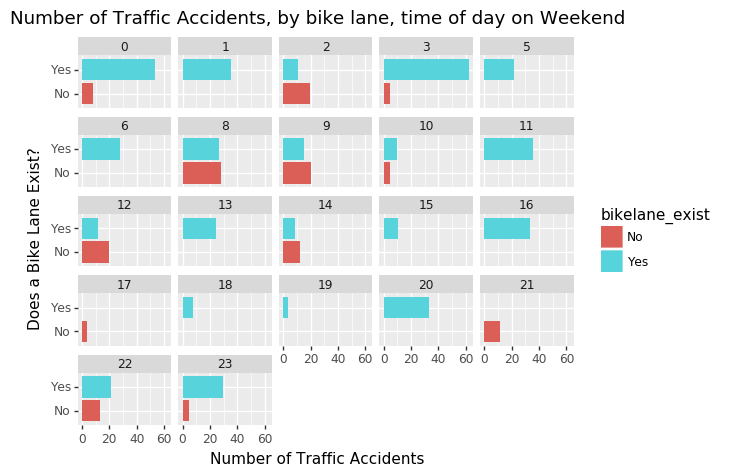

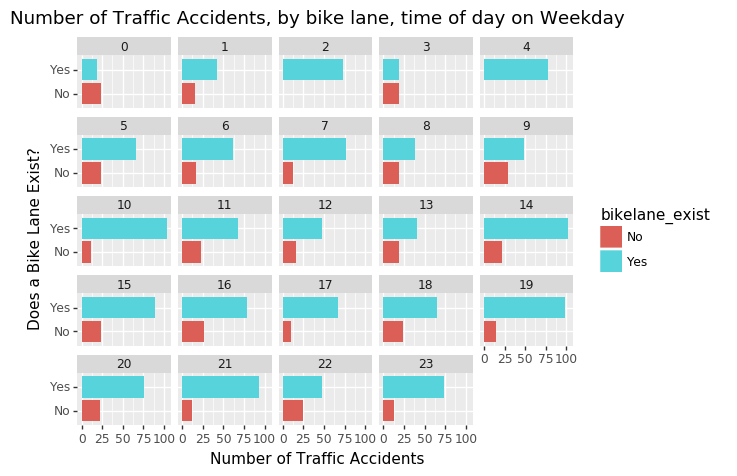

[<ggplot: (168674888491)>, <ggplot: (-9223371868179891810)>]

In [89]:
accidents_hour_bikelane_day_graphs_std

In [ ]:
select accidents_where

## Bike lanes vs Roads vs Accidents Map

Lanebreach at Code4SF is working on something more detailed than dynamic than this. However in the mean time, this was pretty interesting to learn to use matplotlib

In [23]:
traffic_reports_and_bikelanes['point'] = [Point(xy) for xy in zip(traffic_reports_and_bikelanes.X, traffic_reports_and_bikelanes.Y)]

In [24]:
traffic_reports_map = gpd.GeoDataFrame( \
    traffic_reports_and_bikelanes[ ['X', 'Y', 'Category', 'Descript', 'DayOfWeek', 'accident_year', 'bikelane_exist'] ],  \
    geometry =  traffic_reports_and_bikelanes.point, crs = bikeway_map3.crs)

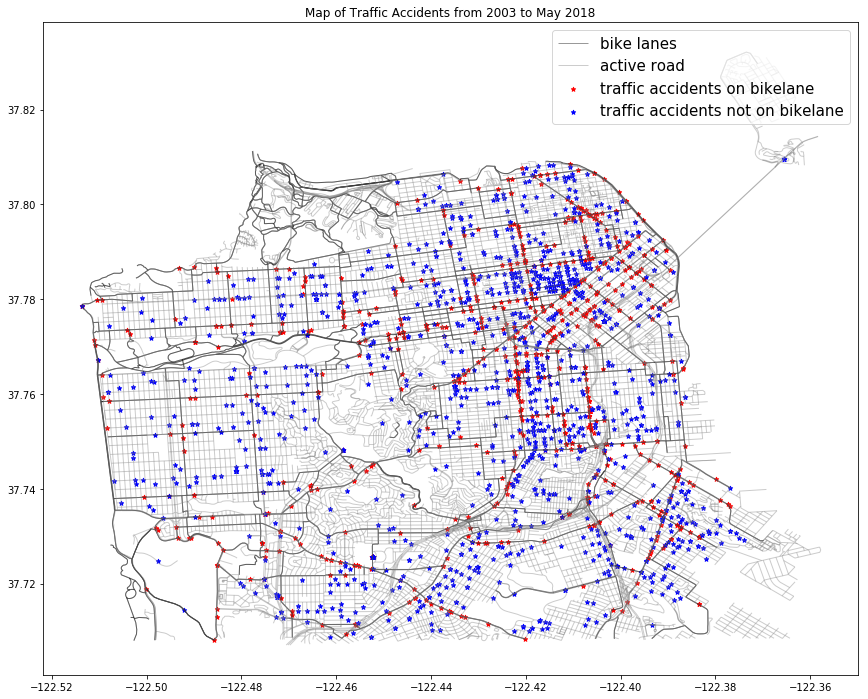

In [114]:
fig, ax=plt.subplots(figsize=(16,12))
#plt.xticks(traffic_reports_by_year['accident_year'], fontsize=10, rotation=30, ha='center', va='top')

bikeway_map3.geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4, label = 'bike lanes') #
total_map.geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'grey', alpha = 0.4, label = 'active road') #

#bikeway_map3.loc[bikeway_map3.symbology == 'BIKE LANE', ].geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4) #
#bikeway_map3.loc[bikeway_map3.symbology == 'BIKE PATH', ].geometry.plot(ax = ax, linewidth = 1,edgecolor='black', color = 'black', alpha = 0.4) #
traffic_reports_map.loc[traffic_reports_map['bikelane_exist'] == True, ].plot( ax = ax,marker = '*',markersize = 20, color = 'red', label = "traffic accidents on bikelane")
traffic_reports_map.loc[traffic_reports_map['bikelane_exist'] == False, ].plot( ax = ax,marker = '*',markersize = 20, color = 'blue', label = "traffic accidents not on bikelane")

plt.legend(prop={'size':15})
plt.title('Map of Traffic Accidents from 2003 to May 2018')
plt.show()

Let create a chart of number of traffic accidents per year, on or not on a bike lane

In [32]:
traffic_reports_by_year2 = traffic_reports_and_bikelanes.groupby(['accident_year', 'bikelane_exist'], as_index = False)['Category'].count()
#drop 2018 point
#traffic_reports_by_year = traffic_reports_by_year.drop([(traffic_reports_by_year.shape[0]-1)], axis = 0)
traffic_reports_by_year2.rename(columns={'Category': 'accident_counts'}, inplace=True)
traffic_reports_by_year2 = traffic_reports_by_year2.reset_index( drop = True) #traffic_reports_and_bikelanes

# drop 2018 since traffic accident dataset only goes til May 2018
traffic_reports_by_year2.drop( traffic_reports_by_year2.loc[ traffic_reports_by_year2.accident_year == 2018 ].index , inplace = True)

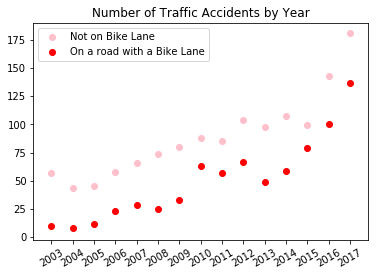

In [33]:
plt.scatter(traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == False), 'accident_year'], traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == False),'accident_counts'], label ='Not on Bike Lane', color = 'pink' )
plt.scatter(traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == True), 'accident_year'], traffic_reports_by_year2.loc[(traffic_reports_by_year2['bikelane_exist'] == True),'accident_counts'], label ='On a road with a Bike Lane', color = 'red')
plt.title( ("Number of Traffic Accidents by Year"))
plt.legend()
plt.xticks(np.unique(traffic_reports_by_year2['accident_year']), fontsize=10, rotation=30, ha='center', va='top')
    #fig.set_size_inches(18.5, 10.5, forward=True)a
    #plt.xticks(ticks=np.arange(0, 440/57.2985, 90/57.2985), fontsize=12, rotation=30, ha='center', va='top')  # 1 radian = 57.2985 degrees
plt.show()

Trend of more accidents without a bike lane than with a bike lane, per year

Let's see what happens when we look at this data by neighborhood

In [24]:
traffic_reports_by_year = traffic_reports_and_bikelanes.groupby(['accident_year', 'bikelane_exist', 'PdDistrict'], as_index = False)['Category'].count()
#drop 2018 point
#traffic_reports_by_year = traffic_reports_by_year.drop([(traffic_reports_by_year.shape[0]-1)], axis = 0)
traffic_reports_by_year.rename(columns={'Category': 'accident_counts'}, inplace=True)
traffic_reports_by_year = traffic_reports_by_year.reset_index( drop = True) #traffic_reports_and_bikelanes

# drop 2018 since traffic accident dataset only goes til May 2018
traffic_reports_by_year.drop( traffic_reports_by_year.loc[ traffic_reports_by_year.accident_year == 2018 ].index , inplace = True)

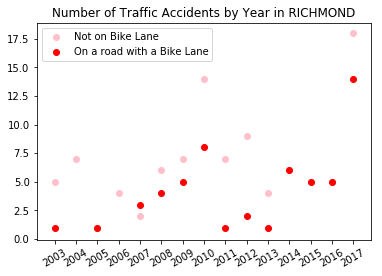

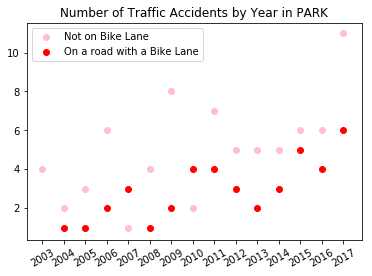

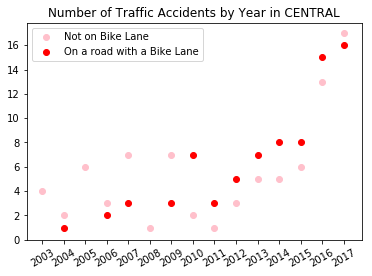

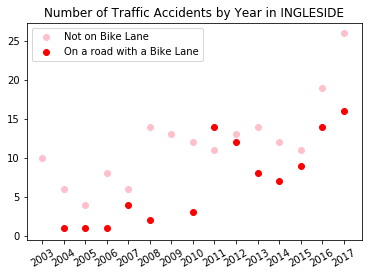

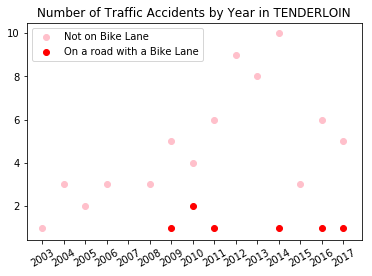

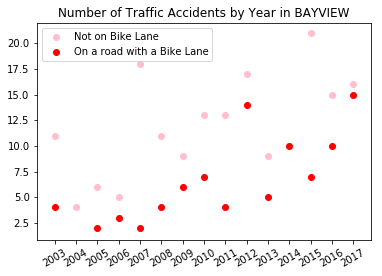

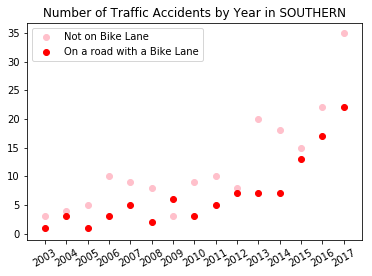

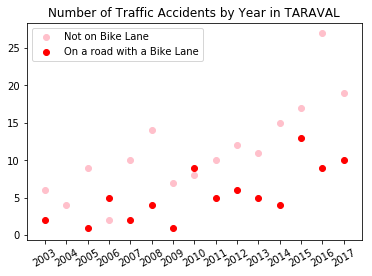

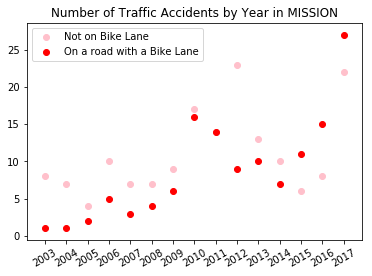

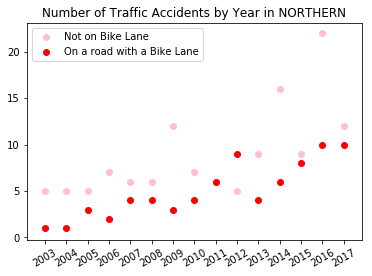

In [25]:
for i in set(traffic_reports_by_year.PdDistrict.tolist()):
    plt.scatter(traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == False) & (traffic_reports_by_year.PdDistrict == i), 'accident_year'], traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == False) & (traffic_reports_by_year.PdDistrict == i),'accident_counts'], label ='Not on Bike Lane', color = 'pink' )
    plt.scatter(traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == True) & (traffic_reports_by_year.PdDistrict == i), 'accident_year'], traffic_reports_by_year.loc[(traffic_reports_by_year['bikelane_exist'] == True) & (traffic_reports_by_year.PdDistrict == i),'accident_counts'], label ='On a road with a Bike Lane', color = 'red')
    plt.title( ("Number of Traffic Accidents by Year in "+ i))
    plt.legend()
    plt.xticks(np.unique(traffic_reports_by_year['accident_year']), fontsize=10, rotation=30, ha='center', va='top')
    #fig.set_size_inches(18.5, 10.5, forward=True)a
    #plt.xticks(ticks=np.arange(0, 440/57.2985, 90/57.2985), fontsize=12, rotation=30, ha='center', va='top')  # 1 radian = 57.2985 degrees
    plt.show()

Traffic accidents are clearly going up over the years for all locations. Differences between effects of a bike lane vs without bike lane are lower in Mission than in Tenderloin. But this could be a function of the fact that some places have more bike lanes than other places.

I think it would be helpful to look at the ratio of accidents to bike lanes lengths vs the ratio of accidents to roads (without bike lanes lengths), per neighborhood.

## Let's see if there looks like there is a trend between number of accidents and bike lane type

This isn't a regression but it looks like there are a lot more accidents on a bike lane and bike path, because there are more of this type of lane

In [557]:
traffic_reports_and_bikelanes['Time'] = pd.to_datetime(traffic_reports_and_bikelanes['Time'])
traffic_reports_and_bikelanes['hour'] = traffic_reports_and_bikelanes['Time'].apply(lambda x: x.hour)

In [150]:
# figure out how much each bike lane type covers sf in miles
symbology_lengths = pd.merge( bikeway_map3.groupby('symbology')['length'].sum().reset_index(), traffic_reports_and_bikelanes.symbology.value_counts().reset_index(), how = 'left', right_on = "index", left_on = "symbology", sort = False)
symbology_lengths.drop( 'index', axis = 1, inplace = True)
symbology_lengths.columns =  ['symbology', 'length_mi', 'accident_counts']
symbology_lengths['length_percent'] = symbology_lengths.length_mi / np.sum(symbology_lengths.length_mi)

# text formatting for chart - very imp to point this out!
symbology_lengths['length_percent_str'] = (np.round(symbology_lengths['length_percent']*100).astype(str)  + "%").tolist()
symbology_lengths['x_index'] = symbology_lengths.symbology + " (" + symbology_lengths.length_percent_str + ")"

C:\Anaconda3\lib\site-packages\plotnine\layer.py:430: UserWarning: position_stack : Removed 1 rows containing missing values.
  data = self.position.setup_data(self.data, params)


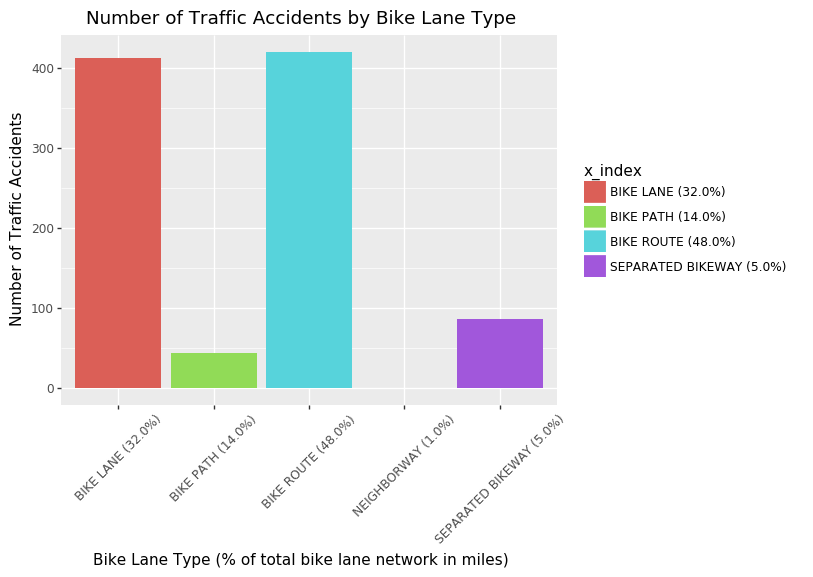

<ggplot: (-9223371905425364939)>

In [36]:
(ggplot(symbology_lengths, aes(x ='x_index', y='accident_counts', fill = 'x_index'))
 + geom_bar( stat='identity') + theme(axis_text_x = element_text(angle=45) )
    + labs(title=('Number of Traffic Accidents by Bike Lane Type'), x='Bike Lane Type (% of total bike lane network in miles)', y='Number of Traffic Accidents'))

## Let's see if there's a trend between accidents and neighborhood

In [ ]:
'cnn_of_road' ,'globalid','hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday', 'road_length', 'bikelane_length_haver'

In [103]:
traffic_reports_and_bikelanes.columns

Index(['Unnamed: 0', 'IncidntNum', 'Category', 'Descript', 'DayOfWeek', 'Date',
       'Time', 'PdDistrict', 'Resolution', 'Address', 'X', 'Y', 'Location',
       'PdId', 'accident_year', 'globalid', 'bikelane_exist',
       'install_yr_accid', 'barrier', 'biap', 'buffered', 'cnn', 'contraflow',
       'date_creat', 'time_creat', 'created_us', 'dir', 'direct', 'double',
       'facility_t', 'from_st', 'fy', 'greenwave', 'install_mo',
       'install_yr_bikelane', 'date_last_', 'time_last_', 'last_edite',
       'length', 'notes', 'number', 'objectid', 'qtr', 'raised', 'shape_len',
       'sharrow', 'sm_sweeper', 'street', 'streetname', 'surface_tr',
       'symbology', 'to_st', 'update_mo', 'update_yr', 'censusbloc',
       'geometry', '_merge', 'bikelane_installdate', 'isWeekday'],
      dtype='object')

In [111]:
accident_counts_bydistrict_bikelane_exist = traffic_reports_and_bikelanes3.groupby(['bikelane_exist', 'PdDistrict', 'accident_year', 'cnn_of_road', 'globalid', 'road_length', 'bikelane_length_haver']).agg({'Category':'count'}).reset_index()

accident_counts_bydistrict_bikelane_exist.rename( columns = {'Category': 'accident_counts'}, inplace = True)
accident_counts_bydistrict_bikelane_exist = accident_counts_bydistrict_bikelane_exist.groupby( ['bikelane_exist', 'PdDistrict', 'accident_year'], as_index = False)['accident_counts','road_length', 'bikelane_length_haver'].sum()

#accident_counts_bydistrict = traffic_reports_and_bikelanes.groupby([ 'PdDistrict']).count()['Category'].reset_index()
#accident_counts_bydistrict.rename( columns = {'Category': 'accident_counts'}, inplace = True)


In [114]:
def calc_standard( row ):
    if row['bikelane_exist'] == "No":
        return (row['accident_counts']/row['road_length'] )
    else:
        return (row['accident_counts'] /row['bikelane_length_haver'])

In [115]:
accident_counts_bydistrict_bikelane_exist['std_metric'] = accident_counts_bydistrict_bikelane_exist.apply(calc_standard, axis = 1)

In [129]:
num_traffic_neighborhood = (ggplot(accident_counts_bydistrict_bikelane_exist.loc[ 'accident_year' , ], aes(x ='PdDistrict', y='std_metric', fill = 'bikelane_exist'))
 + geom_bar( stat='identity', position='dodge', show_legend=True) + theme(axis_text_x = element_text(angle=45)) + \
                            labs(title=('Number of Traffic Accidents per meter of road by Neighborhood'), x='Neighborhood', y='Number of Traffic Accidents', fill = "Does the road have Bike Lanes?") \
                           )

C:\Anaconda3\lib\site-packages\plotnine\guides\guides.py:198: UserWarning: Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it
  "variable to it".format(output))


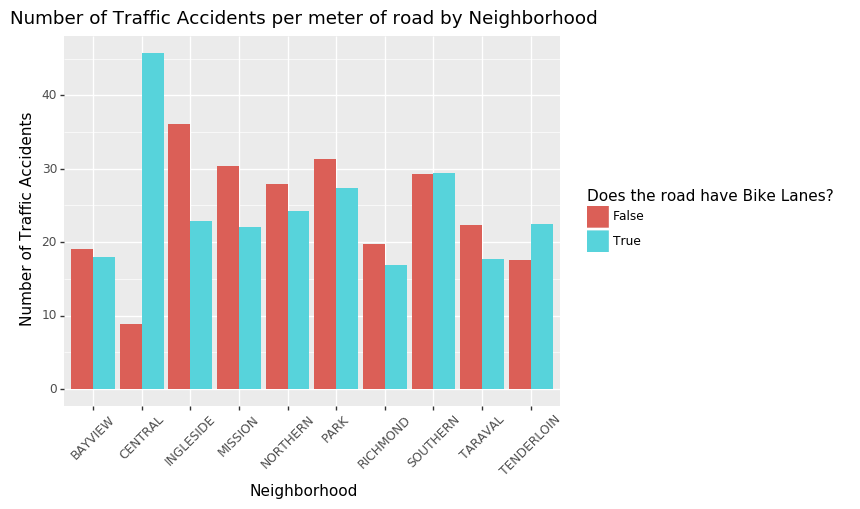

<ggplot: (-9223371868163444536)>

In [130]:
num_traffic_neighborhood

We are also not really accounting for size of the neighborhood here (in terms of road ways!) It would be helpful to have data on the road way map size per neighborhood?

## Accidents by Hour, district, weekday vs weekend

Now, let's look at number of accidents by hour of the day

In [564]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'PdDistrict', 'Day', ''], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

.6% of roads are bikeways 

In [565]:
accidentsby_byhour = accidentsby_ifhour_bikelane.groupby('hour').sum()['traffic_accidents'].reset_index()

In [566]:
num_traffic_accidents_hour = (ggplot(accidentsby_byhour, aes(x = 'hour', y = 'traffic_accidents')) + geom_bar(stat= 'identity')
 + labs(title=('Number of Traffic Accidents by Time of Day'), x='Time (24:00 format)', y='Number of Traffic Accidents'))

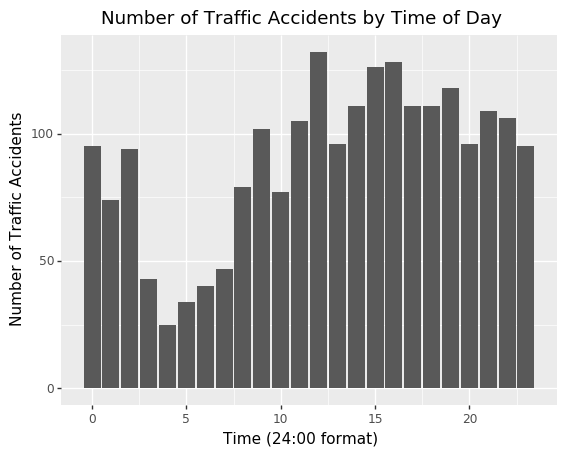

<ggplot: (-9223371904483382826)>

In [567]:
num_traffic_accidents_hour

## Accidents by Hour

Now, let's look at number of accidents by hour of the day

In [564]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

.6% of roads are bikeways 

In [565]:
accidentsby_byhour = accidentsby_ifhour_bikelane.groupby('hour').sum()['traffic_accidents'].reset_index()

In [566]:
num_traffic_accidents_hour = (ggplot(accidentsby_byhour, aes(x = 'hour', y = 'traffic_accidents')) + geom_bar(stat= 'identity')
 + labs(title=('Number of Traffic Accidents by Time of Day'), x='Time (24:00 format)', y='Number of Traffic Accidents'))

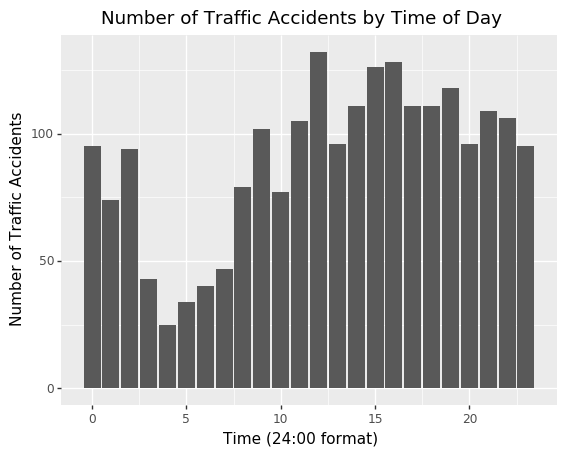

<ggplot: (-9223371904483382826)>

In [567]:
num_traffic_accidents_hour

ways graphic can be improved
- write number of accidents
- show entire bottom scale
- We're not 'controlling' for location, bike lane type, day of week, yaer

## Accidents by time of day, on and not on a bike lane

Let's attempt to control for traffic accidents per day of week

In [558]:
accidents_ifbikelane_hour = (ggplot(accidentsby_ifhour_bikelane, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
 + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
 + coord_flip()
 + facet_wrap('hour')
 + labs(title='Number of Traffic Accidents for Road with/w/o Bike Lane, Hour in Day', x='Does a Bike Lane Exist?', y='Number of Traffic Accidents')
)

# of course I'd like to convert the hour to AM/PM format

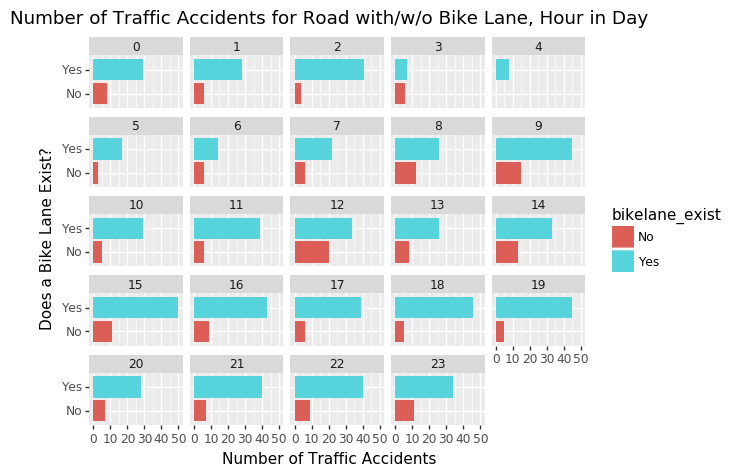

<ggplot: (-9223371904483376419)>

In [559]:
accidents_ifbikelane_hour

We see that there is a lot of difference in accidents when we include hour. If there were actually more counts of accidents per each hour in this dataset, I would definitely put a control for hour in the ultimate regression

It would be interesting to visualize this by day of week if there are differences?

In [561]:
accidentsby_ifhour_bikelane = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'DayOfWeek', 'isWeekday'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane = accidentsby_ifhour_bikelane.reset_index(drop = True)
accidentsby_ifhour_bikelane.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane.bikelane_exist = accidentsby_ifhour_bikelane.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [562]:
daysofweek_array = np.array(set(traffic_reports_and_bikelanes.DayOfWeek )).tolist()

## Accidents by time of day, week day vs weekend vs whether or not bike lane exists 

Accidents conditional on varying time of day, weekday vs weekend, and whether or not bike lane exists

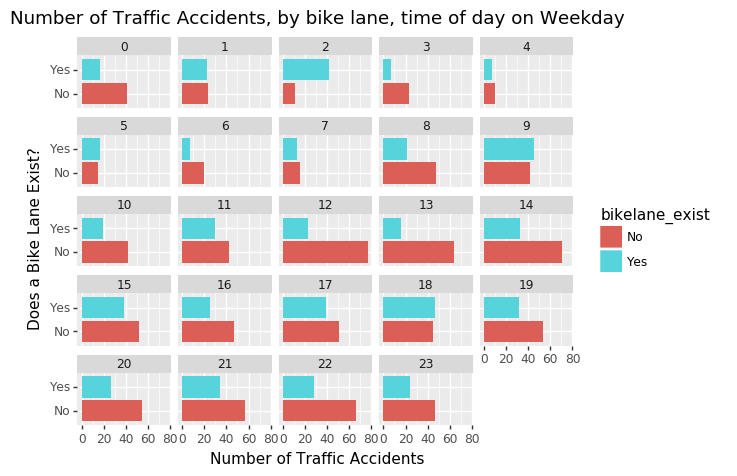

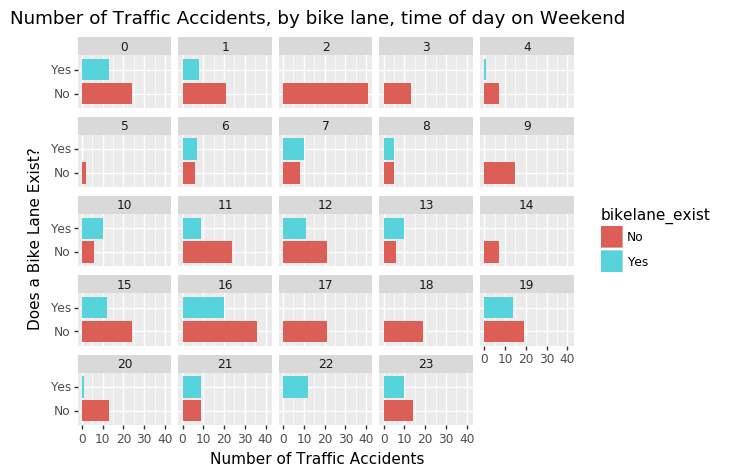

[<ggplot: (132372877523)>, <ggplot: (132371998847)>]

In [563]:
accidents_hour_bikelane_day_graphs = []

for i in set(accidentsby_ifhour_bikelane.isWeekday):
    accidents_hour_bikelane_day = accidentsby_ifhour_bikelane.loc[traffic_reports_and_bikelanes.isWeekday == i]
    accidents_hour_bikelane_day_graphs.append((ggplot(accidents_hour_bikelane_day, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, time of day on ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)
    
accidents_hour_bikelane_day_graphs

## Accidents conditional on varying time of day, day of week, and whether or not bike lane exists

In [249]:
for i in daysofweek_array:
    accidents_hour_bikelane_day = accidentsby_ifhour_bikelane.loc[traffic_reports_and_bikelanes.DayOfWeek == i]
    print((ggplot(accidents_hour_bikelane_day, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
     + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
     + coord_flip()
     + facet_wrap('hour')
     + labs(title=('Number of Traffic Accidents, by bike lane, during hour of day on a ' + i), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
)

NameError: name 'accidentsby_ifhour_bikelane' is not defined

## Accidents conditional on varying time of day, day of week, neighborhood, and whether or not bike lane exists

In [596]:
accidentsby_ifhour_bikelane_day_district = traffic_reports_and_bikelanes.groupby(['hour', 'bikelane_exist', 'isWeekday', 'PdDistrict'], as_index = False)['Category'].count().sort_values( by = ['bikelane_exist', 'hour'])
accidentsby_ifhour_bikelane_day_district = accidentsby_ifhour_bikelane_day_district.reset_index(drop = True)
accidentsby_ifhour_bikelane_day_district.rename( columns = {'Category': 'traffic_accidents'}, inplace = True)
accidentsby_ifhour_bikelane_day_district.bikelane_exist = accidentsby_ifhour_bikelane_day_district.bikelane_exist.apply( lambda x: "Yes" if x == True else "No")

In [597]:
accidentsby_ifhour_bikelane_day_district_plots = []

for i in (set(accidentsby_ifhour_bikelane_day_district.isWeekday)):
    for j in set( traffic_reports_and_bikelanes.PdDistrict):
        df_hold2 = accidentsby_ifhour_bikelane_day_district.loc[((accidentsby_ifhour_bikelane_day_district.isWeekday == i) & (accidentsby_ifhour_bikelane_day_district.PdDistrict == j))]
        accidentsby_ifhour_bikelane_day_district_plots.append((ggplot(df_hold2, aes(x='bikelane_exist', y = 'traffic_accidents'))         # defining what data to use
         + geom_bar(aes(fill = 'bikelane_exist'), stat='identity') # aes(fill = 'hour')
         + coord_flip()
         + facet_wrap('hour')
         + labs(title=('Number of Traffic Accidents, with and without bike lane, during a hour of day, on a ' + i + ' in ' + j), x='Does a Bike Lane Exist?', y='Number of Traffic Accidents'))
        )

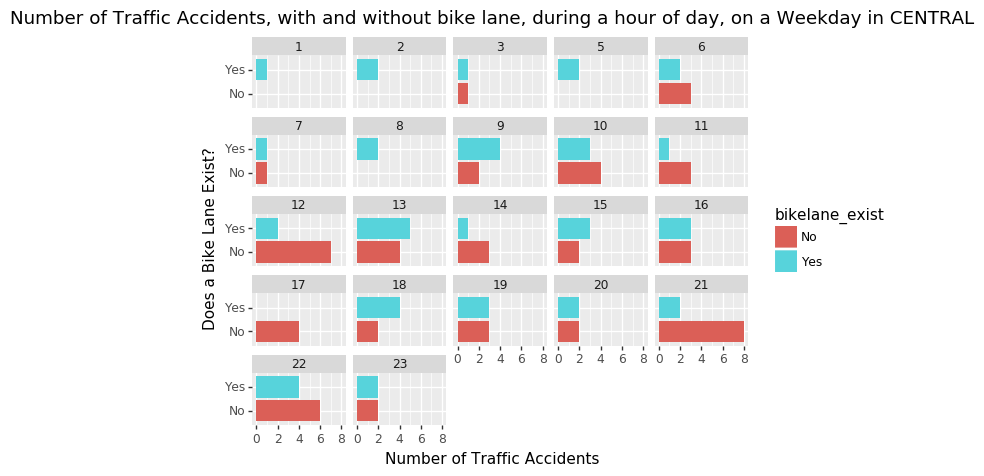

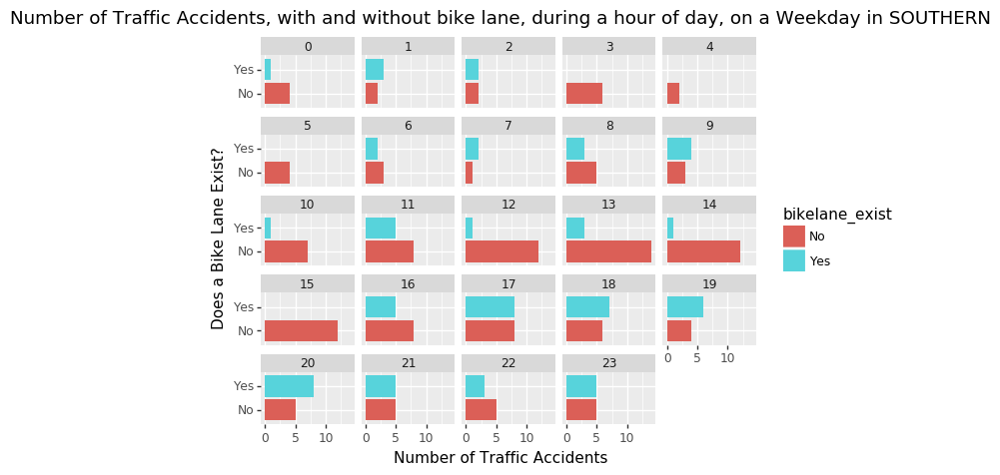

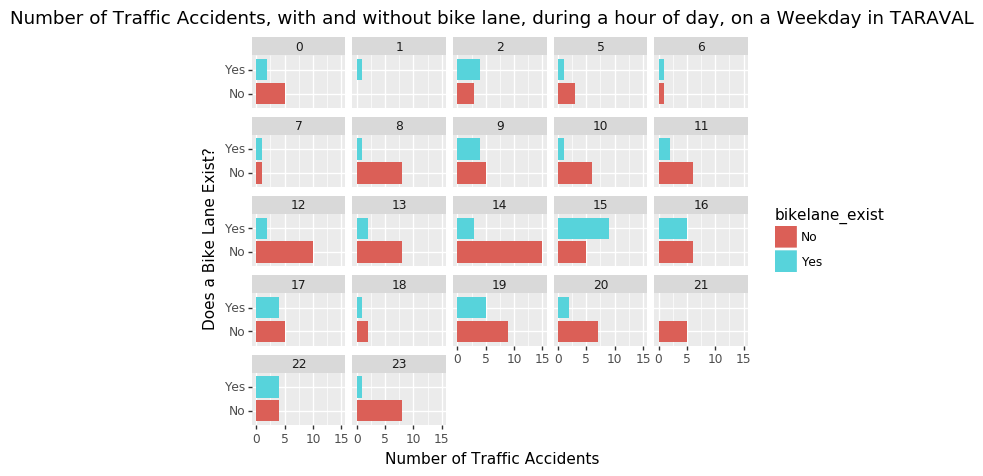

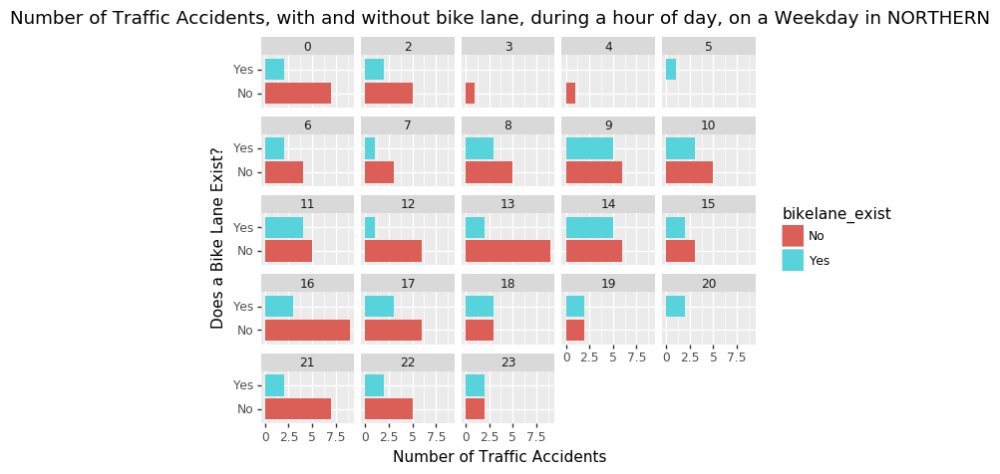

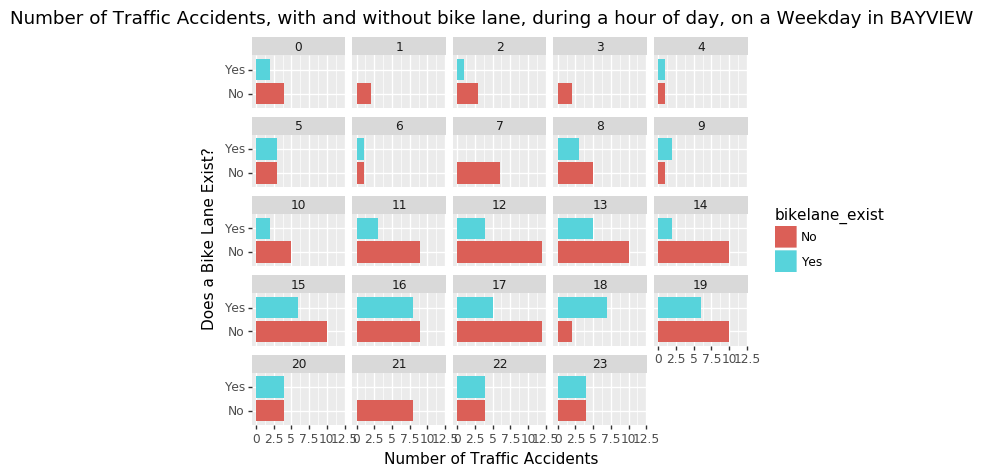

...

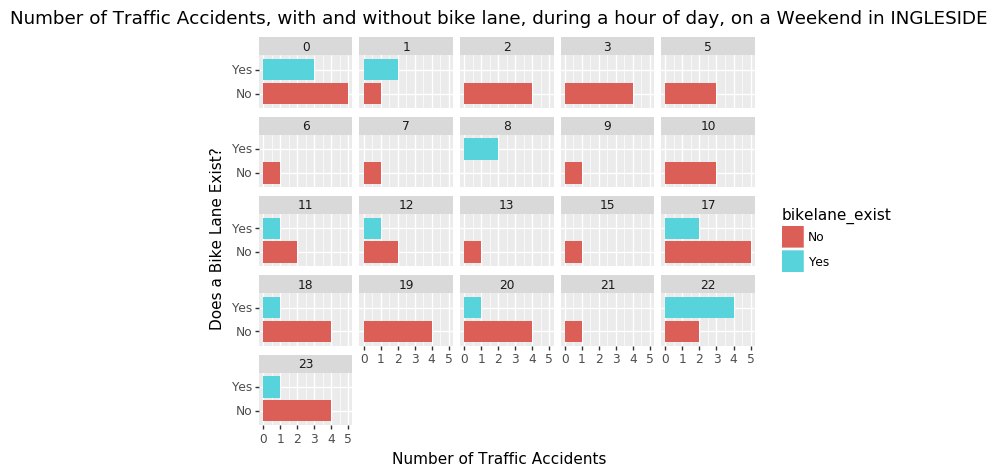

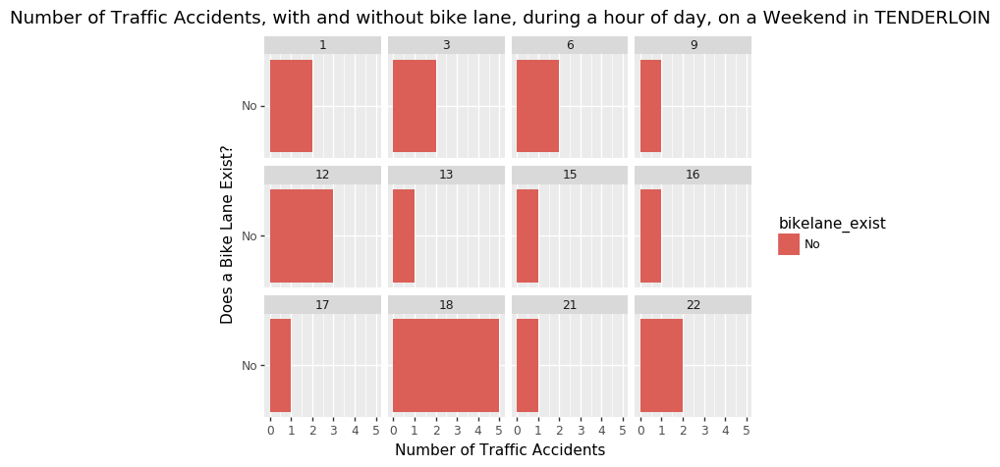

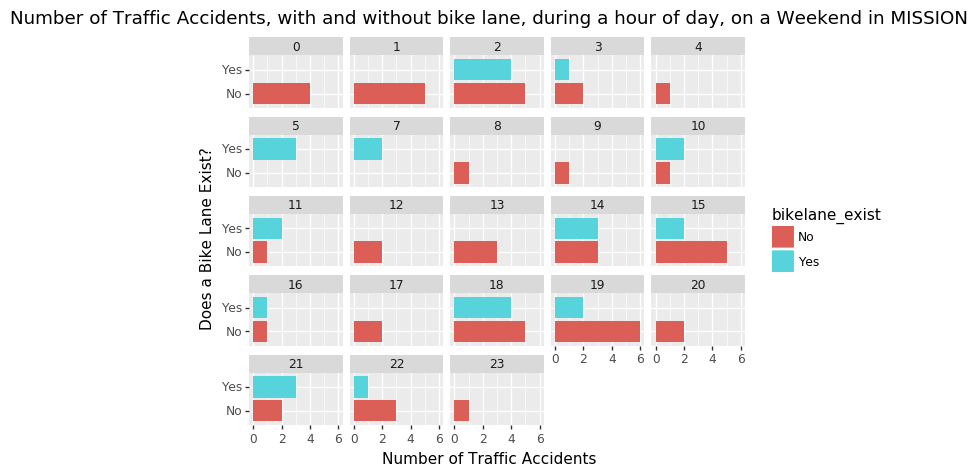

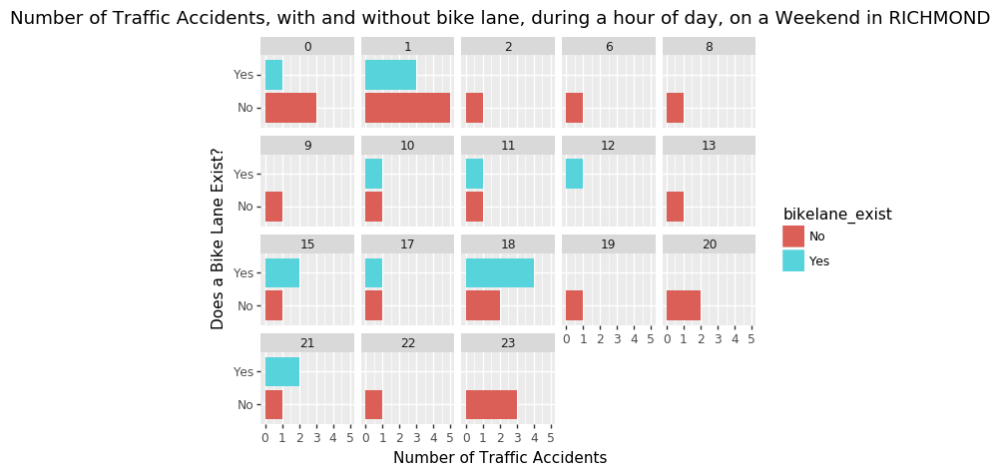

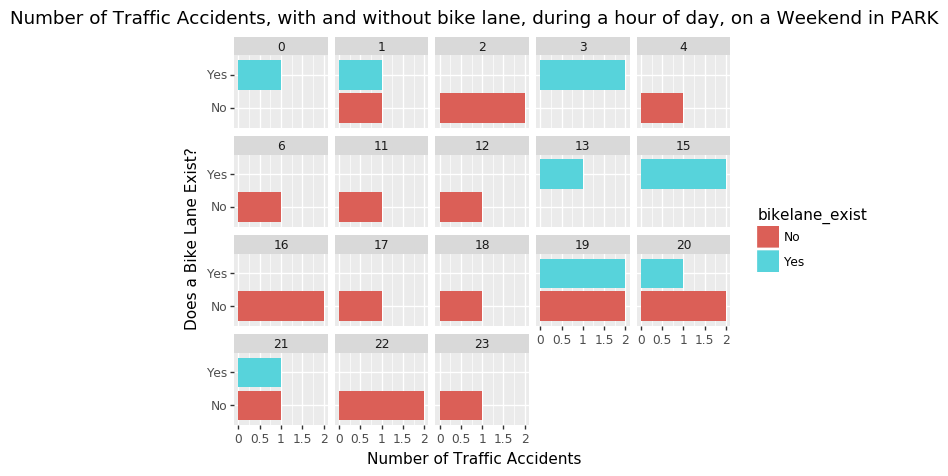

[<ggplot: (-9223371847919354024)>,
 <ggplot: (188934633259)>,
 <ggplot: (-9223371847920142476)>,
 <ggplot: (-9223371847919335182)>,
 <ggplot: (188935072639)>,
 <ggplot: (-9223371847919703096)>,
 <ggplot: (-9223371847920166901)>,
 <ggplot: (188950917503)>,
 <ggplot: (188934768669)>,
 <ggplot: (188935440525)>,
 <ggplot: (188951006377)>,
 <ggplot: (188951328874)>,
 <ggplot: (-9223371847919687750)>,
 <ggplot: (-9223371847920230719)>,
 <ggplot: (188934639375)>,
 <ggplot: (188935072765)>,
 <ggplot: (-9223371847918951164)>,
 <ggplot: (-9223371847920016864)>,
 <ggplot: (-9223371847919356542)>,
 <ggplot: (188935353871)>]

In [271]:
accidentsby_ifhour_bikelane_day_district_plots

Notice that some places do not have any noticeable number of accidents at some hours of the day. But this is probably due to number of bikelanes in the area?

If no bikelane exists in the area, obviously there can't be any accidents on it and it isn't comparable! In the next notebook, I'll create a metric that standardizes bike lanes